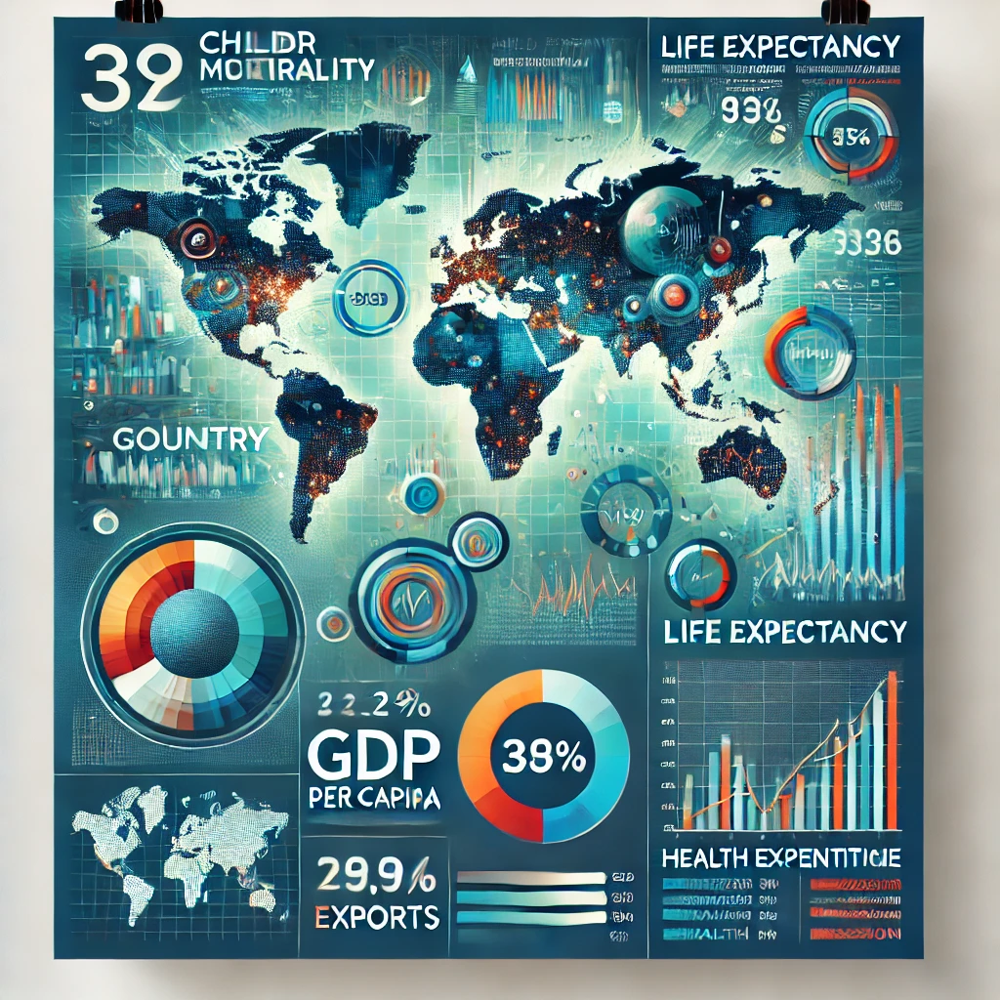

# 1. Data description and problem statement:

The dataset contains information about countries, including various socio-economic and health indicators. Below is the description of the dataset columns:

Dataset Description
country: Name of the country.
child_mort: Child mortality rate (deaths per 1000 children under 5 years).
exports: Exports as a percentage of GDP.
health: Health expenditure as a percentage of GDP.
imports: Imports as a percentage of GDP.
income: Net income per person.
inflation: Inflation rate (annual %).
life_expec: Life expectancy at birth (years).
total_fer: Total fertility rate (children per woman).
gdpp: GDP per capita.

The objective of this dataset is to determine how to distribute a fixed amount of funding among countries. To ensure a fair and effective allocation, we analyzed the data and created clusters to identify which countries require more assistance. Since the dataset lacks a target variable, we applied unsupervised learning methods, both before and after applying PCA, to achieve the best results.




# 2. Install libraries

In [1]:
pip install ipympl ipywidgets

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install --upgrade numba

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install ydata-profiling numba

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 43.7 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.14.1
    Uninstalling scipy-1.14.1:
      Successfully uninstalled scipy-1.14.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
cesium 0.12.3 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
mlxtend 0.23.3 requires scikit-learn>=1.3.1, but you have scikit-learn 1.2.2 which is incompatible.
plotnine 0.14.3 requires matplotlib>=3.8.0, but you have matplotlib 3.7.5 which is incompatible.
tsfresh 0.20.3 requires scipy>=1.14.0; pyth

In [4]:
pip install visions==0.7.4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.4/102.4 kB 4.1 MB/s eta 0:00:00
  Attempting uninstall: visions
    Found existing installation: visions 0.7.5
    Uninstalling visions-0.7.5:
      Successfully uninstalled visions-0.7.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.12.0 requires visions[type_image_path]<0.7.7,>=0.7.5, but you have visions 0.7.4 which is incompatible.
Note: you may need to restart the kernel to use updated packages.


In [5]:
pip install --upgrade visions

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.1 MB/s eta 0:00:00
  Attempting uninstall: visions
    Found existing installation: visions 0.7.4
    Uninstalling visions-0.7.4:
      Successfully uninstalled visions-0.7.4
Note: you may need to restart the kernel to use updated packages.


In [6]:
pip install kneed

Note: you may need to restart the kernel to use updated packages.


# 3. Import Libraries

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn import metrics
import warnings
warnings.filterwarnings('ignore')
import plotly.express as pe
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from kneed import KneeLocator
from sklearn.cluster import KMeans
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import MeanShift, estimate_bandwidth
from sklearn.cluster import DBSCAN
from sklearn.cluster import MiniBatchKMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.cluster import AgglomerativeClustering
import itertools
from mpl_toolkits import mplot3d
from sklearn.decomposition import PCA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import explained_variance_score
import plotly.express as px
#from dataprep.eda import create_report
from ydata_profiling import ProfileReport

# 4. Read data and Create DataFrame

In [8]:
train= pd.read_csv("/kaggle/input/country-dataset/Country-data.csv")
train

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [9]:
df = pd.DataFrame(train)
df

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


# 5. Data Pre-Processing

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167 entries, 0 to 166
Data columns (total 10 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   country     167 non-null    object 
 1   child_mort  167 non-null    float64
 2   exports     167 non-null    float64
 3   health      167 non-null    float64
 4   imports     167 non-null    float64
 5   income      167 non-null    int64  
 6   inflation   167 non-null    float64
 7   life_expec  167 non-null    float64
 8   total_fer   167 non-null    float64
 9   gdpp        167 non-null    int64  
dtypes: float64(7), int64(2), object(1)
memory usage: 13.2+ KB


In [11]:
df.describe().T.style.background_gradient(cmap='coolwarm', axis=1)

,count,mean,std,min,25%,50%,75%,max
child_mort,167.000000,38.270060,40.328931,2.600000,8.250000,19.300000,62.100000,208.000000
exports,167.000000,41.108976,27.412010,0.109000,23.800000,35.000000,51.350000,200.000000
health,167.000000,6.815689,2.746837,1.810000,4.920000,6.320000,8.600000,17.900000
imports,167.000000,46.890215,24.209589,0.065900,30.200000,43.300000,58.750000,174.000000
income,167.000000,17144.688623,19278.067698,609.000000,3355.000000,9960.000000,22800.000000,125000.000000
inflation,167.000000,7.781832,10.570704,-4.210000,1.810000,5.390000,10.750000,104.000000
life_expec,167.000000,70.555689,8.893172,32.100000,65.300000,73.100000,76.800000,82.800000
total_fer,167.000000,2.947964,1.513848,1.150000,1.795000,2.410000,3.880000,7.490000
gdpp,167.000000,12964.155689,18328.704809,231.000000,1330.000000,4660.000000,14050.000000,105000.000000


## 5.1. Check hidden characters in column's name

In [12]:
for col in df.columns:
    print(repr(col))

'country'
'child_mort'
'exports'
'health'
'imports'
'income'
'inflation'
'life_expec'
'total_fer'
'gdpp'


## 5.2. Check duplicates

In [13]:
duplicates = df.duplicated()
if duplicates.any():
    print ("Duplicates exist")
else:
    print("Duplicates do not exist")

Duplicates do not exist


## 5.3. Check number of unique values

In [14]:
df.nunique()

country       167
child_mort    139
exports       147
health        147
imports       151
income        156
inflation     156
life_expec    127
total_fer     138
gdpp          157
dtype: int64

## 5.4. Check missing values

In [15]:
df.isnull().sum()

country       0
child_mort    0
exports       0
health        0
imports       0
income        0
inflation     0
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [16]:
df.dtypes

country        object
child_mort    float64
exports       float64
health        float64
imports       float64
income          int64
inflation     float64
life_expec    float64
total_fer     float64
gdpp            int64
dtype: object

## 5.5. Drop "country" feature

In [17]:
df1 = df.drop("country", axis = 1)

In [18]:
negative_values = (df1 < 0).sum()
negative_values

child_mort    0
exports       0
health        0
imports       0
income        0
inflation     8
life_expec    0
total_fer     0
gdpp          0
dtype: int64

In [19]:
df.nunique()

country       167
child_mort    139
exports       147
health        147
imports       151
income        156
inflation     156
life_expec    127
total_fer     138
gdpp          157
dtype: int64

## 5.6. Profile Report

In [20]:
profile_report = ProfileReport(df)
profile_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 6. Visualization

## 6.1. Correlation plot

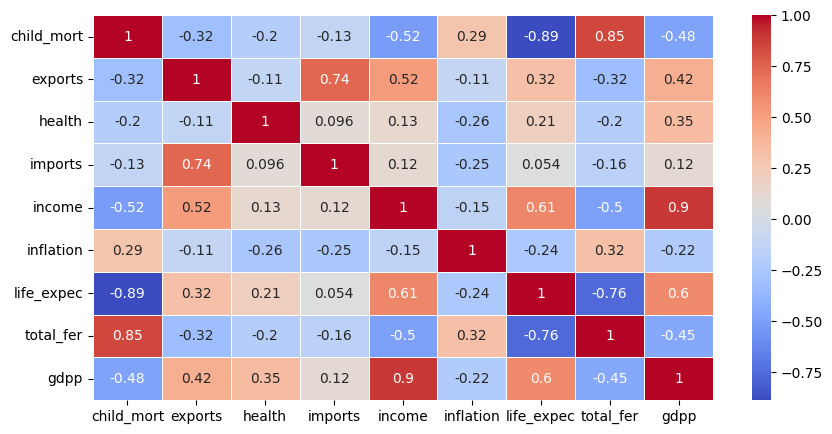

In [21]:
%matplotlib inline
b,c=plt.subplots(figsize=(10,5))
sns.heatmap(df1.corr(),cmap='coolwarm',cbar=True,annot=True,linewidths=0.5,ax=c)
plt.show()

#### Observations:

The correlation range between two variables is always between -1 and +1. A value of -1 indicates a perfect negative correlation, 0 indicates no correlation, and +1 indicates a perfect positive correlation. Income and GDP, Child mortality, and total fertility have the highest correlations, respectively. On the other hand, life expectancy and child mortality have a negative correlation. 

## 6.2. Boxplot

In [22]:
num_columns = df.drop("country", axis = 1)

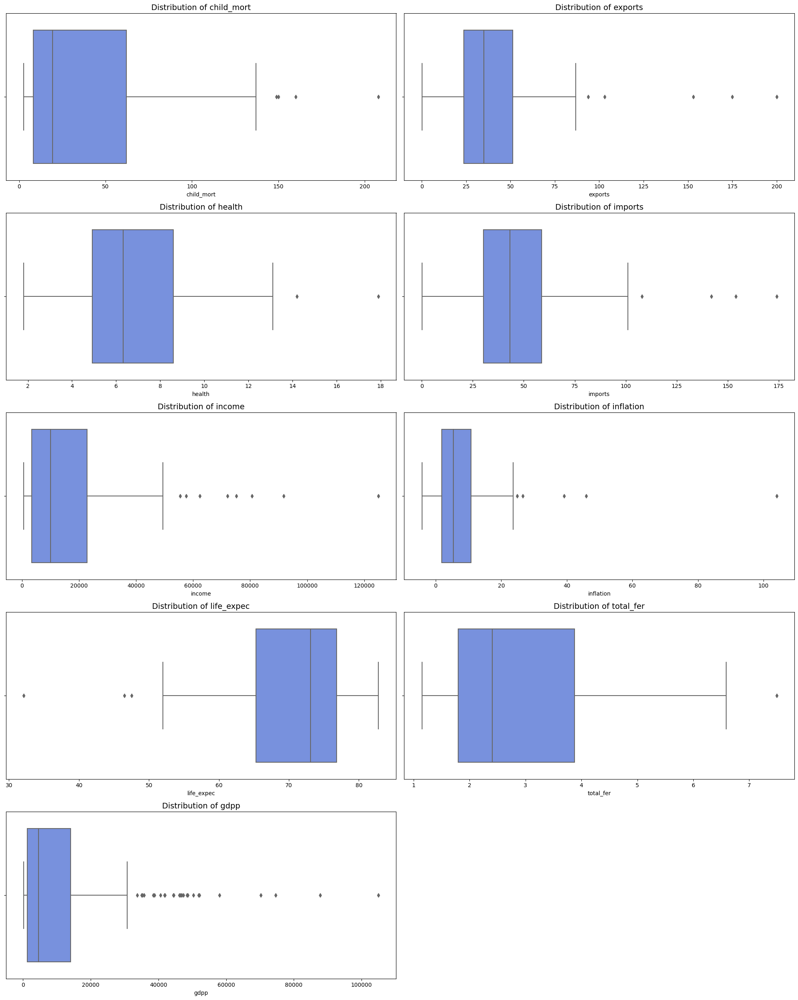

In [23]:
fig, axes = plt.subplots(5, 2, figsize=(20, 25))
sns.set_palette("coolwarm")
# Loop through numerical columns
for idx, i in enumerate(num_columns):
    row = idx // 2  # Compute row index
    col = idx % 2   # Compute column index
    sns.boxplot(data=df, x=i, orient='h', ax=axes[row, col])
    axes[row, col].set_title(f"Distribution of {i}", fontsize=14)

# Turn off the unused 9th subplot
axes[4, 1].axis('off') 

# Adjust layout to prevent overlap
plt.tight_layout()

# Show the plot
plt.show()


## 6.3. Scatterplot of child mortality vs other numerical variables

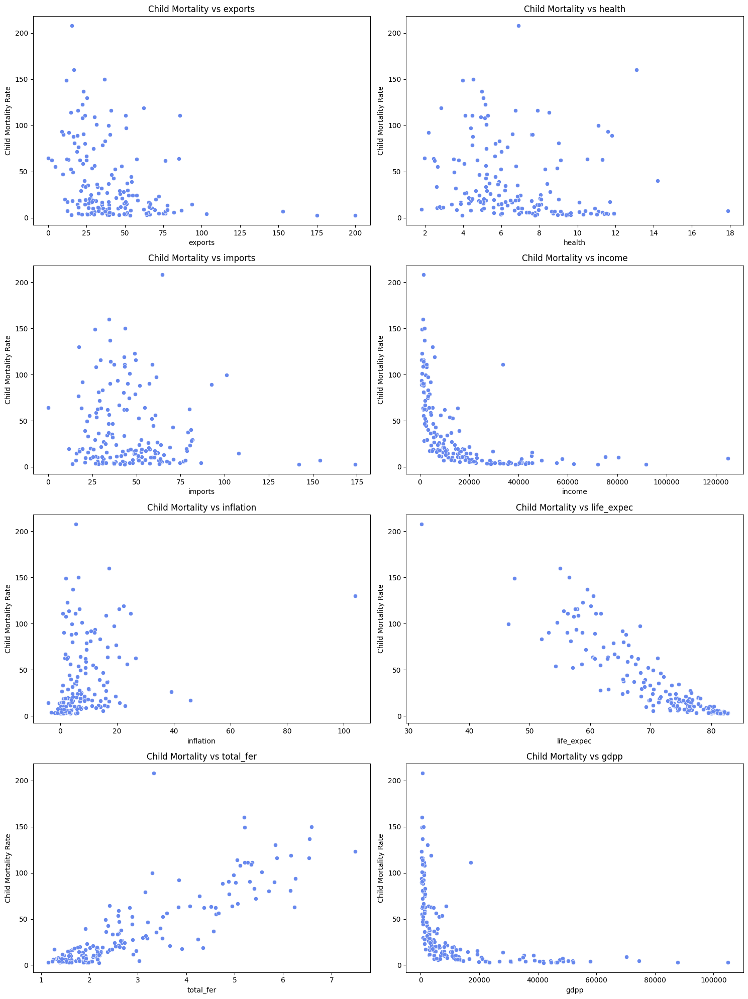

In [24]:
# List of features to plot against 'child_mort'
features = ['exports', 'health', 'imports', 'income', 'inflation', 'life_expec', 'total_fer', 'gdpp']

# Create subplots
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15, 20))

# Flatten the axes array for easier indexing
axes = axes.flatten()

# Iterate through the features and plot scatter plots
for i, feature in enumerate(features):
    sns.scatterplot(data=df, x=feature, y='child_mort', ax=axes[i] , palette='coolwarm')
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel('Child Mortality Rate')
    axes[i].set_title(f'Child Mortality vs {feature}')

# Adjust layout and display
plt.tight_layout()
plt.show()

## 6.4. pairplot

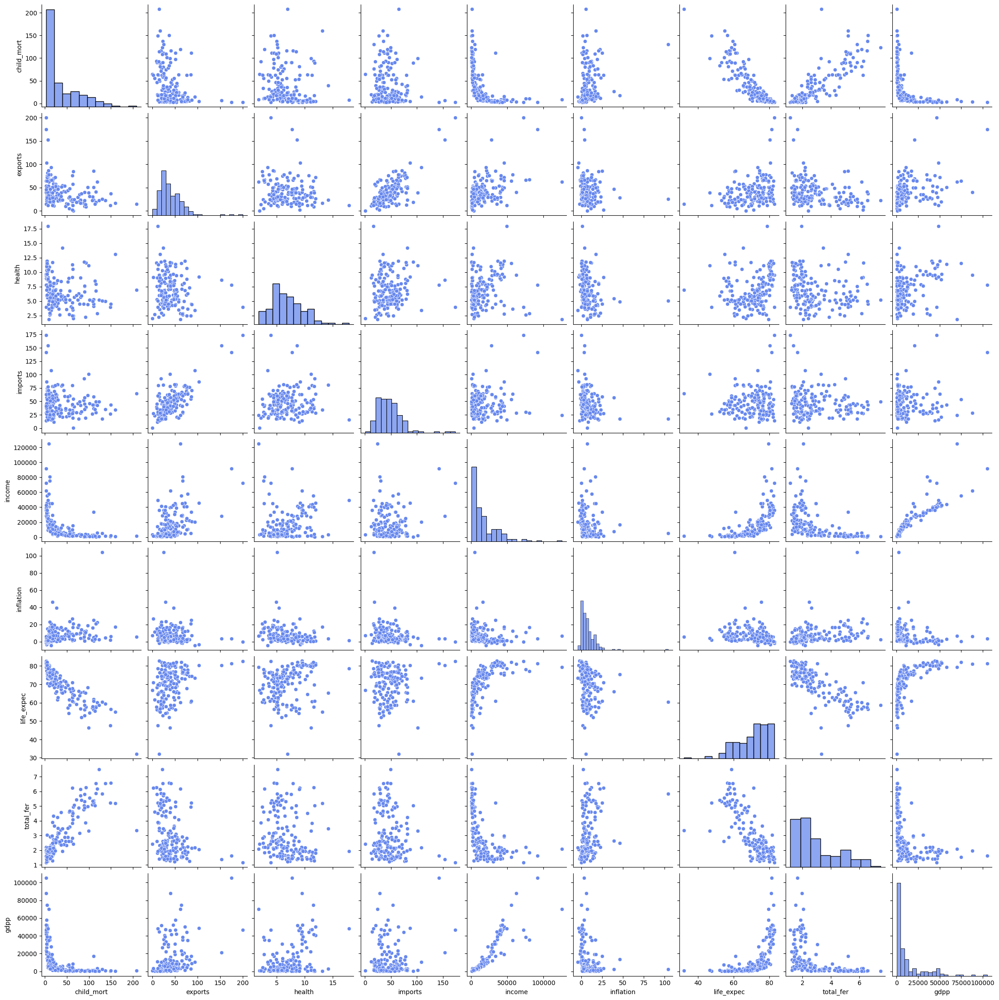

In [25]:
sns.pairplot(num_columns)
plt.show()

## 6.5. Barplot

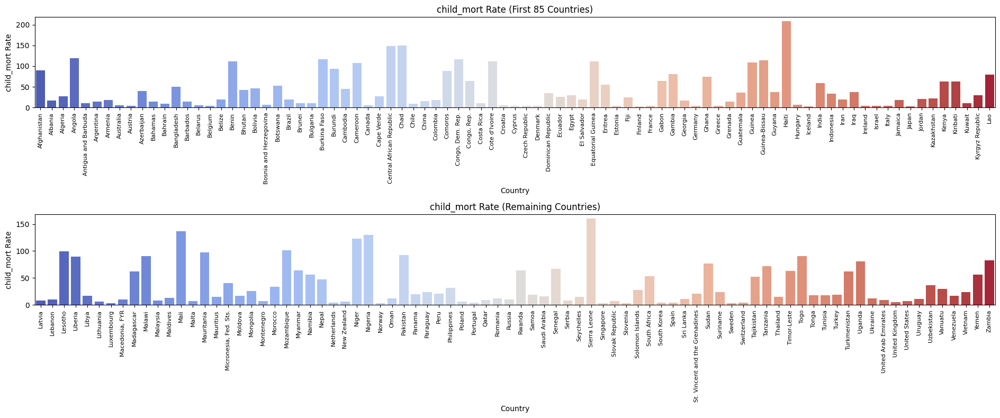

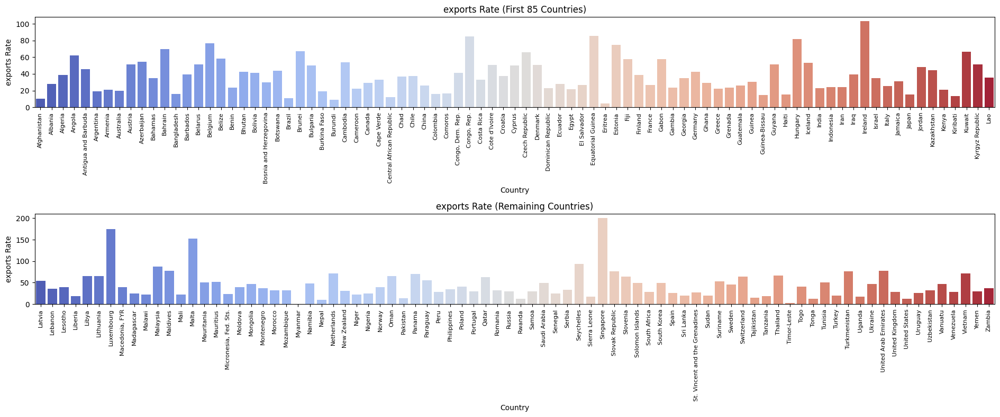

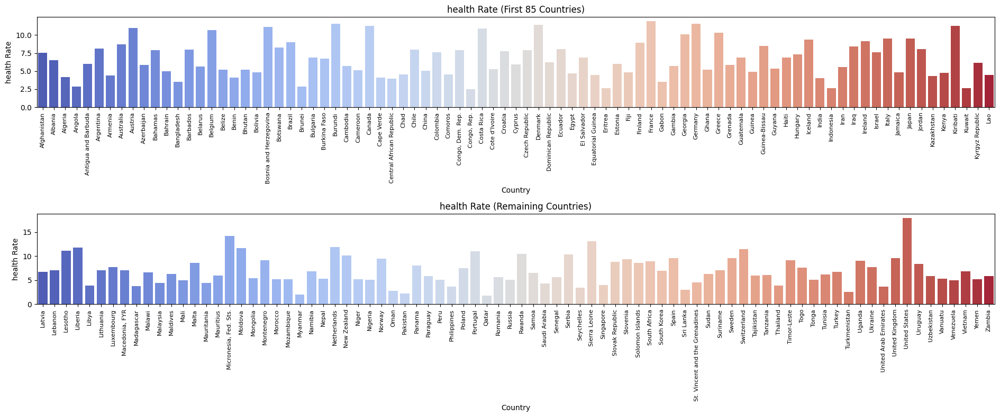

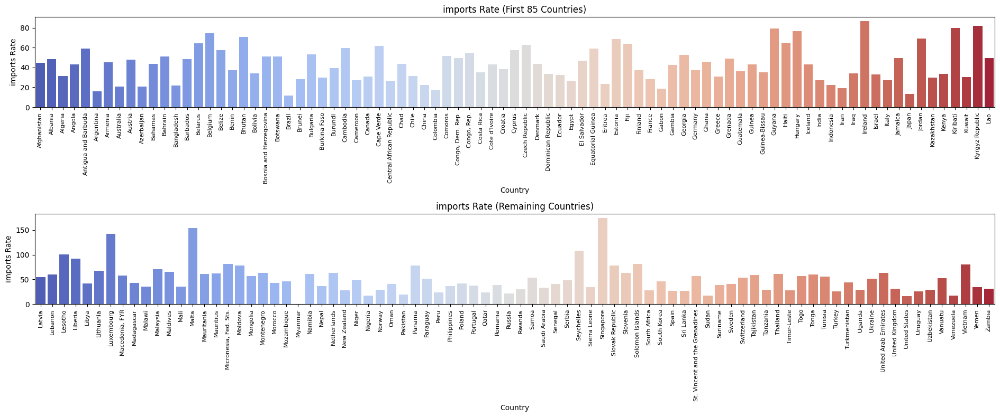

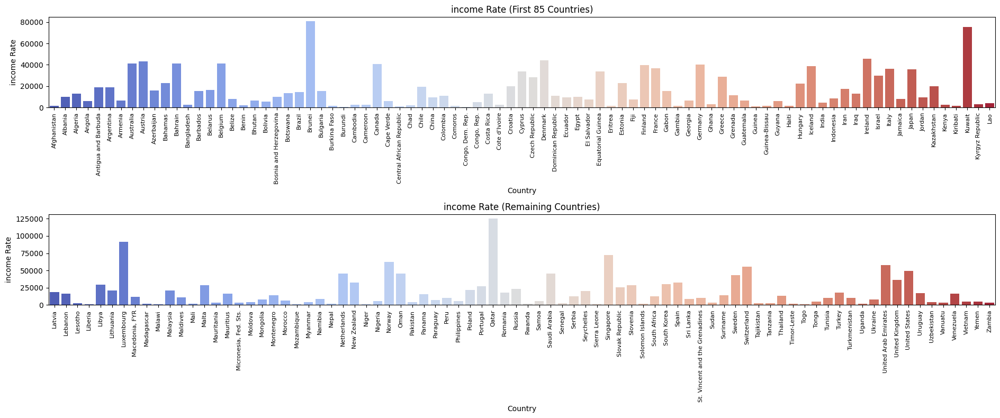

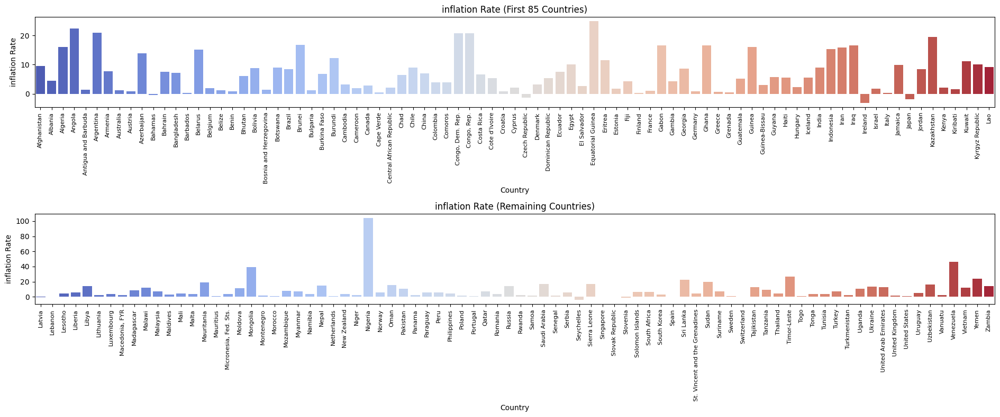

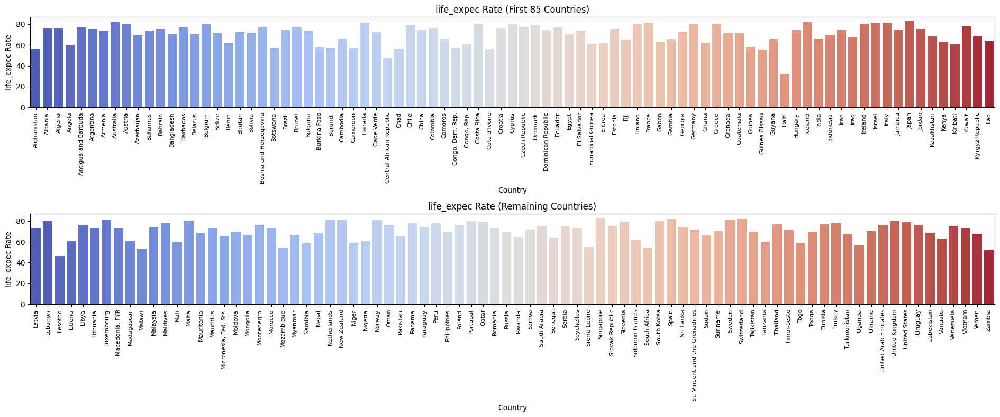

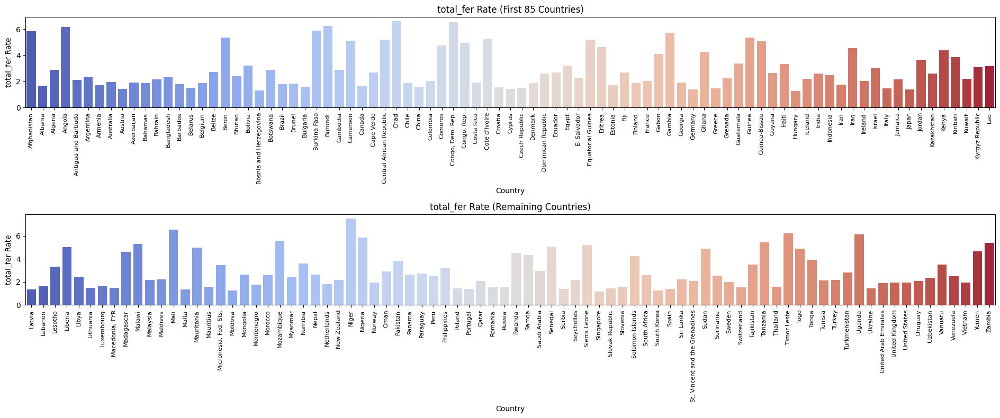

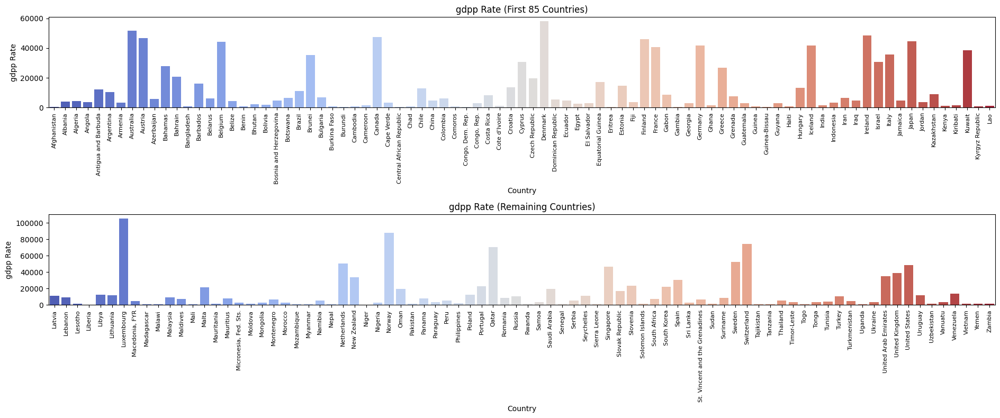

In [26]:
for col in num_columns:
    fig, axes = plt.subplots(2, 1, figsize=(19, 8)) 

    # Plot the first 85 rows in the first subplot
    sns.barplot(data=df[:85], x="country", y=col, palette="coolwarm", ax=axes[0])
    axes[0].set_xlabel('Country')
    axes[0].set_ylabel(f'{col} Rate')
    axes[0].set_title(f'{col} Rate (First 85 Countries)')
    axes[0].tick_params(axis='x', rotation=90, labelsize=8)

    # Plot the remaining rows in the second subplot
    sns.barplot(data=df[85:], x="country", y=col, palette="coolwarm", ax=axes[1])
    axes[1].set_xlabel('Country')
    axes[1].set_ylabel(f'{col} Rate')
    axes[1].set_title(f'{col} Rate (Remaining Countries)')
    axes[1].tick_params(axis='x', rotation=90, labelsize=8)

    # Adjust layout and show the plot for this column
    plt.tight_layout()
    plt.show()

In [27]:
df.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

## 6.6. Geographical distributions of numercial features

In [28]:
for i in num_columns:
    
    # Create basic choropleth map
    fig = px.choropleth(df,
                        locations='country',
                        locationmode='country names',  
                        color=i,
                        hover_name=i,
                        animation_frame=i,
                        projection='natural earth')
    
    # Update layout to make the map larger, color bar smaller, and reduce distance of animation frame
    fig.update_layout(
        title={
            'text': i+'Rate per Country',
            'x': 0.5,  # Center the title horizontally
            'y': 0.80,  # Place the title closer to the top of the figure
            'xanchor': 'center',  # Anchor the title's horizontal center to the x position
            'yanchor': 'top',  # Anchor the title's top to the y position
            'font': {
                'size': 20,  # Font size
                'color': 'black',  # Font color
                'family': 'Arial Black'  # Font style (bold)
            }
        },
        
        
        width=1000,  # Width of the figure
        height=1000,  # Height of the figure
        
        coloraxis_colorbar=dict(
            lenmode='fraction',  # Use a fraction of the plot height
            len=0.5,  # Set the color bar length as a fraction of the plot height
            thicknessmode='fraction',  # Use a fraction of the plot width
            thickness=0.03  # Set the color bar thickness as a fraction of the plot width
        ),
        sliders=[{    
            'yanchor': 'top',
            'xanchor': 'left',
            'currentvalue': {'font': {'size': 20}, 'prefix': i+':', 'visible': True, 'xanchor': 'right'},
            'pad': {'b': 10, 't': 20},  # Adjust padding to move slider closer to the plot
            'len': 0.9,  # Length of the slider
            'x': 0,  # x position of the slider
            'y': 0.2,  # y position of the slider
        }]
    )
    
    fig.show()


## 6.7. 3D Scatter Plot of Child Mortality, Health and Income

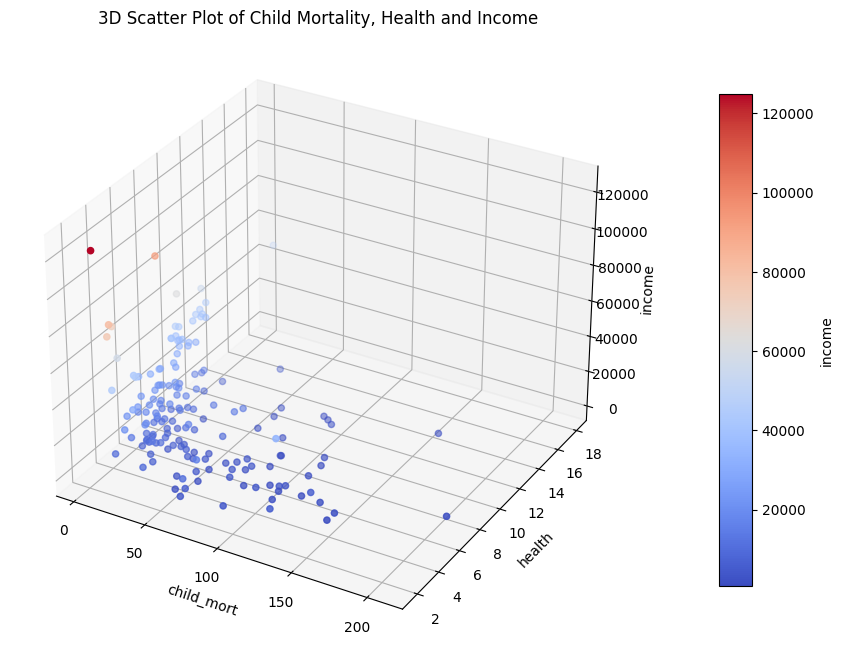

In [29]:
%matplotlib inline

fig = plt.figure(figsize=(12, 8))


# Set up 3D projection
ax = plt.axes(projection='3d')

# Define axis data
x = df['child_mort']
y = df['health']
z = df['income']

# Plotting a scatter plot for better visualization of individual points
scatter = ax.scatter3D(x, y, z, c=z, cmap='coolwarm', marker='o')

# Adding labels
ax.set_xlabel('child_mort')
ax.set_ylabel('health')
ax.set_zlabel('income')

# ax.view_init(45, 215)

# Adding a color bar for scale reference
fig.colorbar(scatter, ax=ax, label='income', shrink=0.8, aspect=15, pad=0.1)

# Setting title
ax.set_title('3D Scatter Plot of Child Mortality, Health and Income')

plt.show()


## 6.8. 3D Scatter Plot of Imports, Exports and gdpp

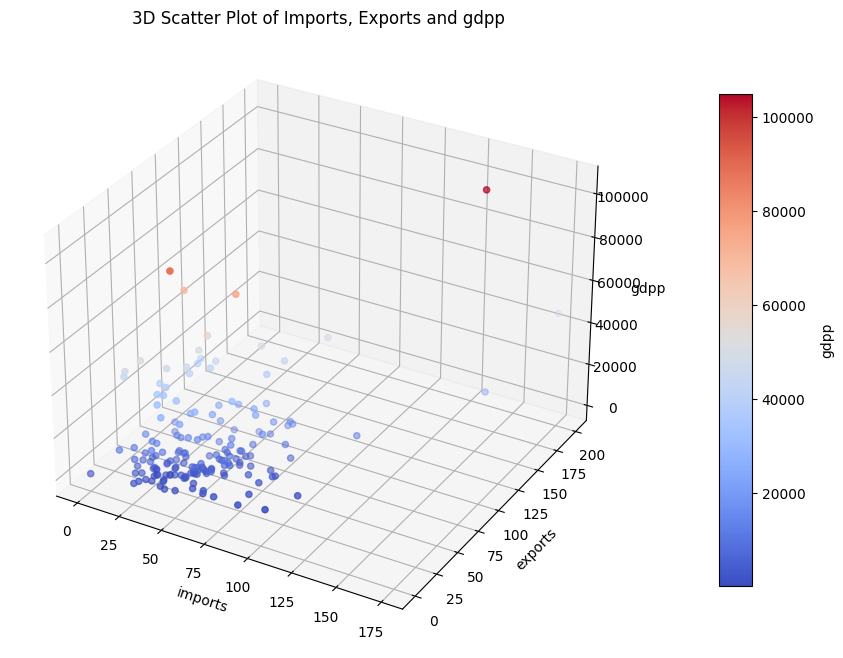

In [30]:
%matplotlib inline

fig = plt.figure(figsize=(12, 8))


# Set up 3D projection
ax = plt.axes(projection='3d')

# Define axis data
x = df['imports']
y = df['exports']
z = df['gdpp']

# Plotting a scatter plot for better visualization of individual points
scatter = ax.scatter3D(x, y, z, c=z, cmap='coolwarm', marker='o')

# Adding labels
ax.set_xlabel('imports')
ax.set_ylabel('exports')
ax.set_zlabel('gdpp')

# ax.view_init(45, 215)

# Adding a color bar for scale reference
fig.colorbar(scatter, ax=ax, label='gdpp', shrink=0.8, aspect=15, pad=0.1)

# Setting title
ax.set_title('3D Scatter Plot of Imports, Exports and gdpp')

plt.show()


## 6.9. 3D Scatter Plot of Imports, Exports and Inflation

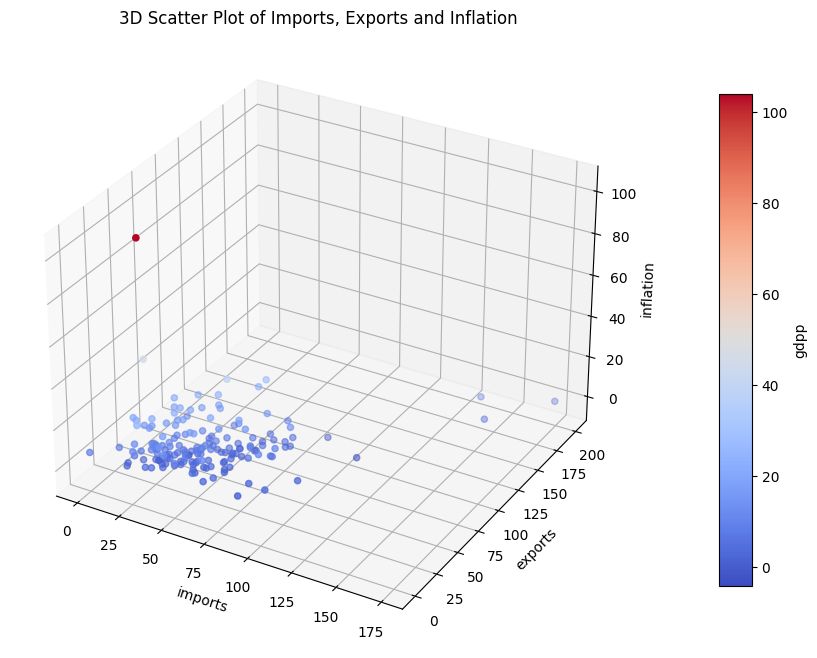

In [31]:
%matplotlib inline

fig = plt.figure(figsize=(12, 8))


# Set up 3D projection
ax = plt.axes(projection='3d')

# Define axis data
x = df['imports']
y = df['exports']
z = df['inflation']

# Plotting a scatter plot for better visualization of individual points
scatter = ax.scatter3D(x, y, z, c=z, cmap='coolwarm', marker='o')

# Adding labels
ax.set_xlabel('imports')
ax.set_ylabel('exports')
ax.set_zlabel('inflation')

# ax.view_init(45, 215)

# Adding a color bar for scale reference
fig.colorbar(scatter, ax=ax, label='gdpp', shrink=0.8, aspect=15, pad=0.1)

# Setting title
ax.set_title('3D Scatter Plot of Imports, Exports and Inflation')

plt.show()


## 6.10. 3D Scatter Plot of Imports, Exports and Inflation

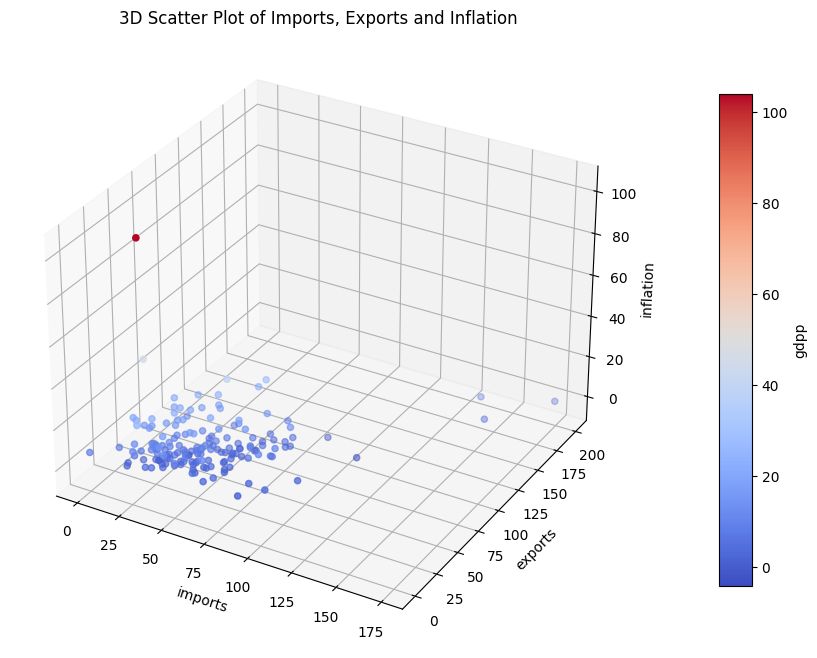

In [32]:
%matplotlib inline

fig = plt.figure(figsize=(12, 8))


# Set up 3D projection
ax = plt.axes(projection='3d')

# Define axis data
x = df['imports']
y = df['exports']
z = df['inflation']

# Plotting a scatter plot for better visualization of individual points
scatter = ax.scatter3D(x, y, z, c=z, cmap='coolwarm', marker='o')

# Adding labels
ax.set_xlabel('imports')
ax.set_ylabel('exports')
ax.set_zlabel('inflation')

# ax.view_init(45, 215)

# Adding a color bar for scale reference
fig.colorbar(scatter, ax=ax, label='gdpp', shrink=0.8, aspect=15, pad=0.1)

# Setting title
ax.set_title('3D Scatter Plot of Imports, Exports and Inflation')

plt.show()


## 6.11. 3D Scatter Plot of Life Expectancy, Total Fertility and Health

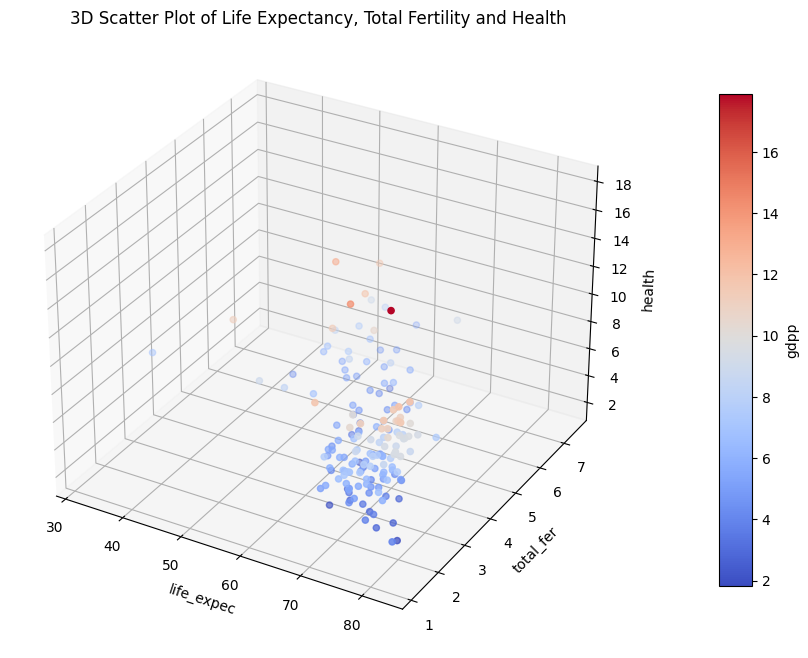

In [33]:
%matplotlib inline

fig = plt.figure(figsize=(12, 8))


# Set up 3D projection
ax = plt.axes(projection='3d')

# Define axis data
x = df['life_expec']
y = df['total_fer']
z = df['health']

# Plotting a scatter plot for better visualization of individual points
scatter = ax.scatter3D(x, y, z, c=z, cmap='coolwarm', marker='o')

# Adding labels
ax.set_xlabel('life_expec')
ax.set_ylabel('total_fer')
ax.set_zlabel('health')

# ax.view_init(45, 215)

# Adding a color bar for scale reference
fig.colorbar(scatter, ax=ax, label='gdpp', shrink=0.8, aspect=15, pad=0.1)

# Setting title
ax.set_title('3D Scatter Plot of Life Expectancy, Total Fertility and Health')

plt.show()


# 

# 7. Multicollinearity

#### Multicollinearity is a statistical concept where several independent variables in a model are correlated.
#### A variance inflation factor (VIF) of 10 indicates a high level of multicollinearity, which is a serious issue that requires correction:
#### VIF = 1: No correlation between the predictor and other predictors
#### VIF between 1 and 5: Low correlation between the predictor and other predictors.
#### VIF between 5 and 10: Moderate correlation between the predictor and other predictors.
#### VIF > 10: High correlation between the predictor and other predictors

In [34]:
########### OR ###########

vif = pd.DataFrame()
vif["Variable"] = num_columns.columns
vif_values = []

for i in range(num_columns.shape[1]):  # shape[1] gives the number of columns
    vif_value = variance_inflation_factor(num_columns.values, i)
    vif_values.append(vif_value)

vif["VIF"] = vif_values
vif

,Variable,VIF
0,child_mort,8.084814
1,exports,16.084236
2,health,12.421525
3,imports,17.280234
4,income,13.414051
5,inflation,1.985961
6,life_expec,21.916807
7,total_fer,17.673828
8,gdpp,10.298641


#### Observation:
All features except inflation are highly correlated.
There is a relationship between variance inflation factor (VIF) and principal component analysis (PCA) in Python because both are used to address multicollinearity in data sets: 

VIF: Measures the ratio of the variance of a model to the variance of a model without a specific feature. A VIF value greater than 1.5 indicates multicollinearity and a VIF greater than 10 indicates severe multicollinearity. 

PCA: A dimeeduction technique that transforms correlated variables into a smaller set of uncorrelated variables called principal components. 

PCA can be used to address multicollinearity by reducing the number of variables while retaining most of the information. 

PCA and VIF can be used together to improve the accuracy and robustness of predictions in Python. 

# 8. Normalizing Dataset

In [35]:
scaler = StandardScaler()
scaled_features = scaler.fit_transform(num_columns)

# 9. Clustering

## 9.1. KMeans clustering

In [36]:
List = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans.fit(scaled_features)
    List.append(kmeans.inertia_)

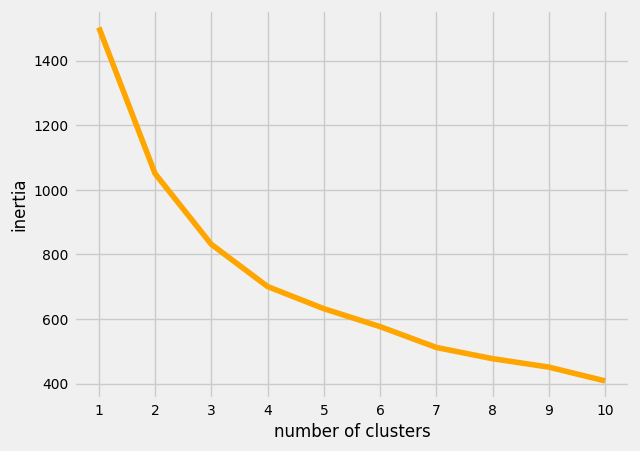

In [37]:
plt.style.use('fivethirtyeight')
plt.plot(range(1,11),List , color= "orange")
plt.xticks(range(1,11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('number of clusters', fontsize=12)
plt.ylabel('inertia', fontsize=12)
plt.show()

In [38]:
kl = KneeLocator(range(1, 11), List, curve="convex", direction="decreasing")
kl.elbow

4

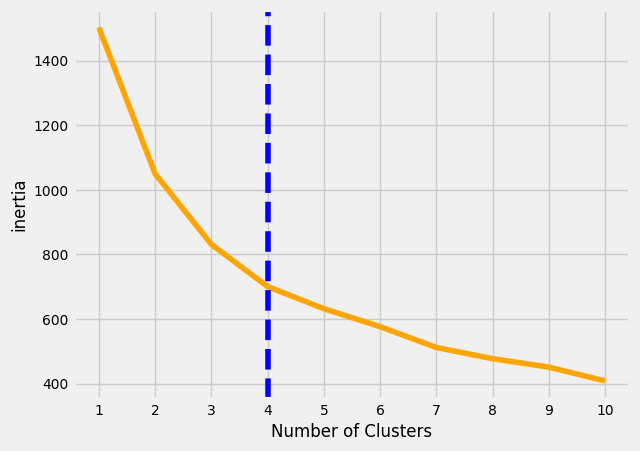

In [39]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), List , color= "orange")

plt.xticks(range(1, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=12)

plt.ylabel("inertia", fontsize=12)
plt.axvline(x=kl.elbow, color='b', label='axvline full height', ls='--')

plt.show()

In [40]:
kmeans = KMeans(n_clusters=4).fit(num_columns)
centroids = kmeans.cluster_centers_
print(centroids)

[[5.41351852e+01 3.32573981e+01 6.32157407e+00 4.55385731e+01
  6.38113889e+03 9.20411111e+00 6.65666667e+01 3.51981481e+00
  3.02725926e+03]
 [5.04285714e+00 5.55285714e+01 9.37380952e+00 4.72095238e+01
  4.75714286e+04 2.76814286e+00 8.04571429e+01 1.77761905e+00
  4.60857143e+04]
 [5.00000000e+00 9.23333333e+01 6.35333333e+00 6.47666667e+01
  9.30000000e+04 5.51666667e+00 8.06000000e+01 1.88333333e+00
  8.77000000e+04]
 [1.21028571e+01 5.22942857e+01 6.84514286e+00 4.93371429e+01
  2.56000000e+04 6.59545714e+00 7.60628571e+01 1.97685714e+00
  1.73477143e+04]]


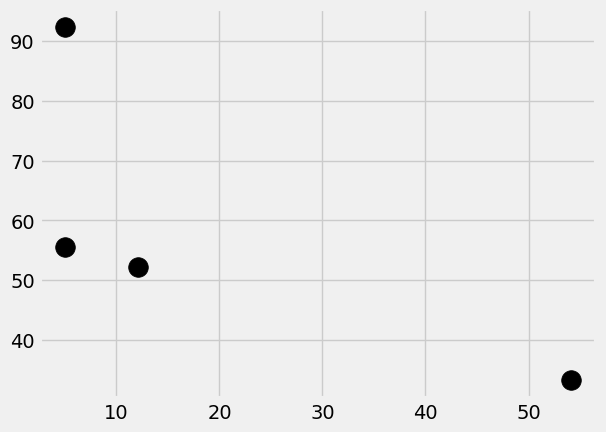

In [41]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200, alpha= 1)
plt.show()

In [42]:
num_columns.columns

Index(['child_mort', 'exports', 'health', 'imports', 'income', 'inflation',
       'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

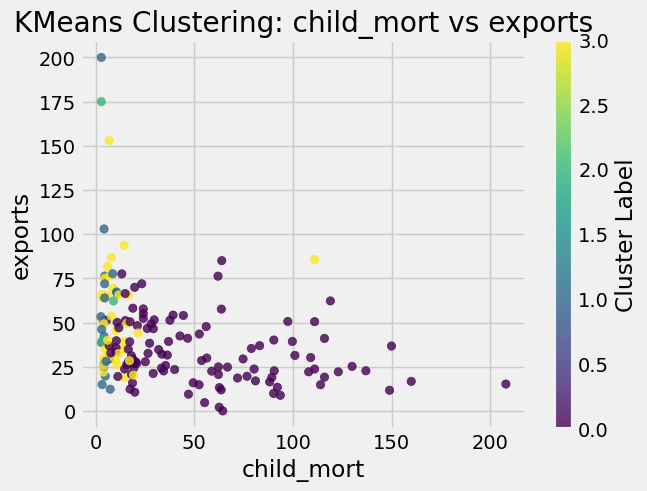

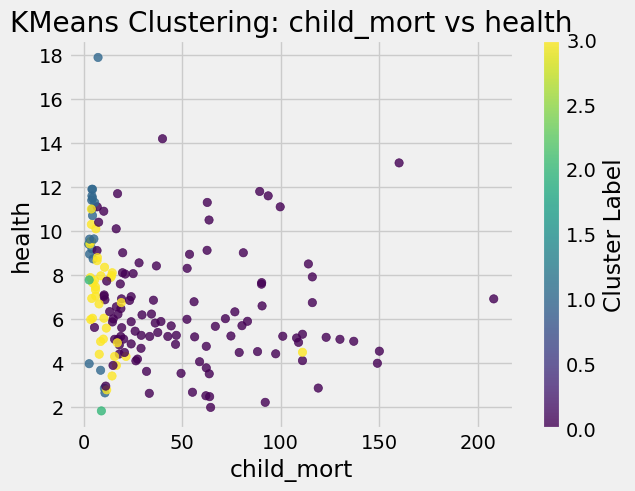

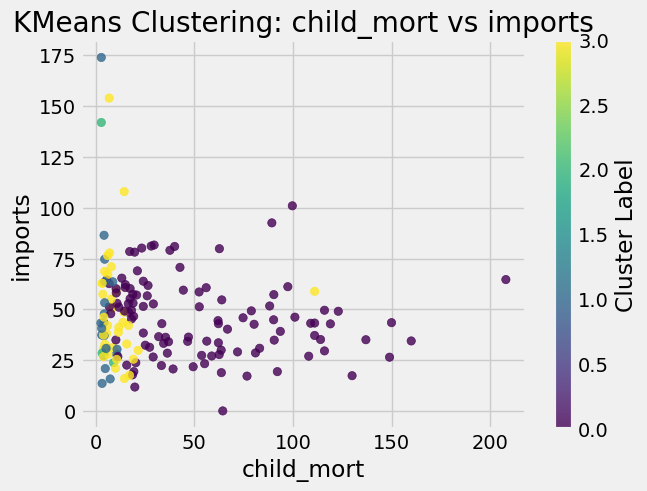

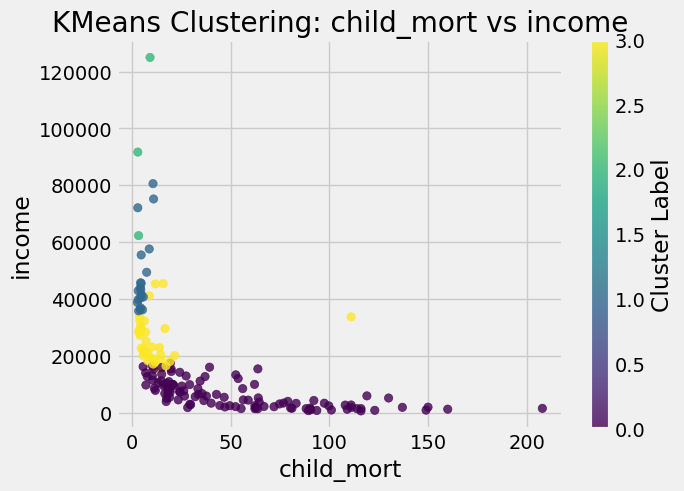

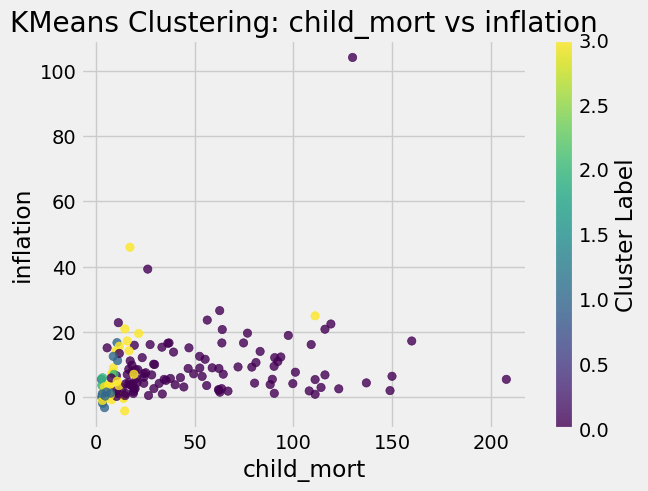

...

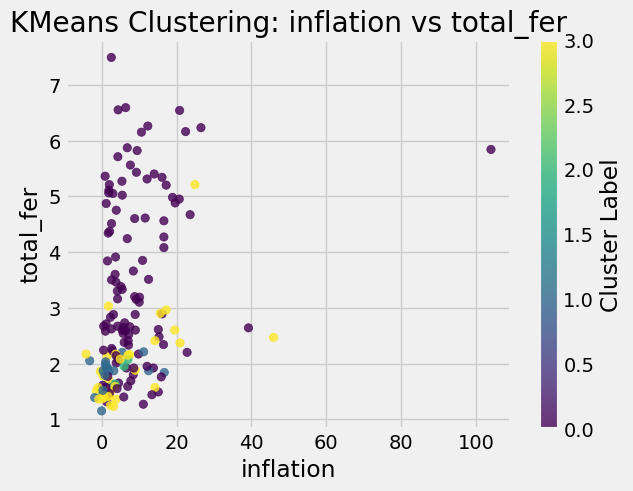

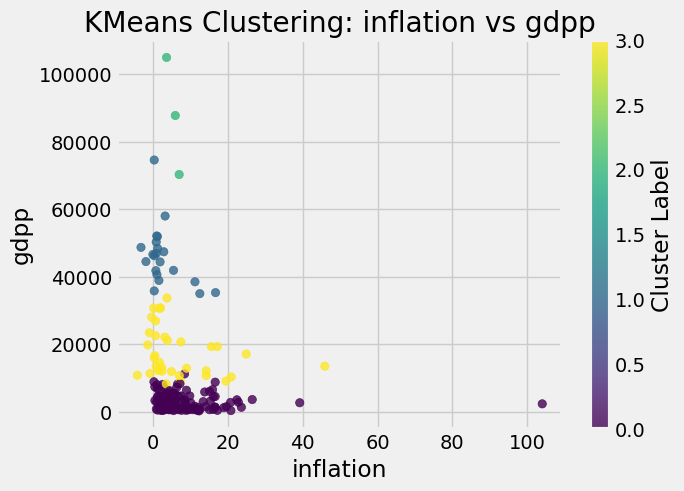

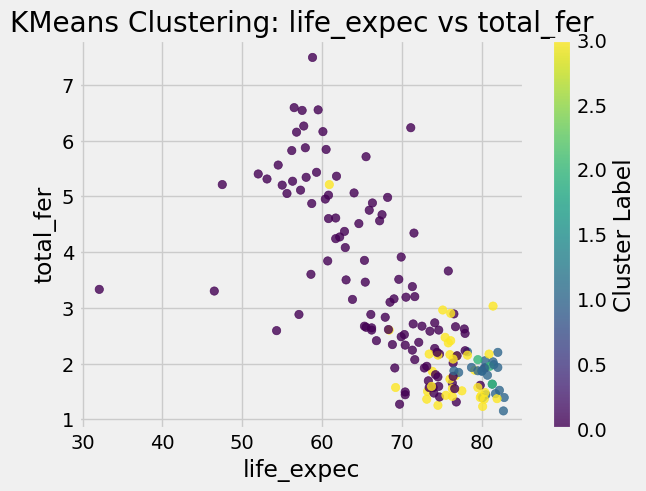

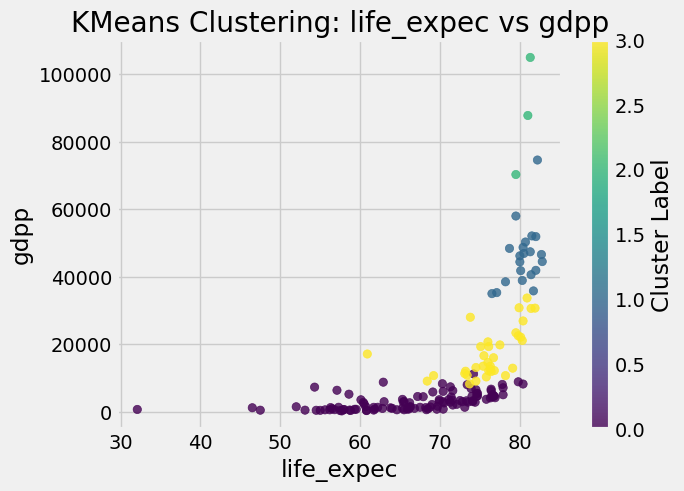

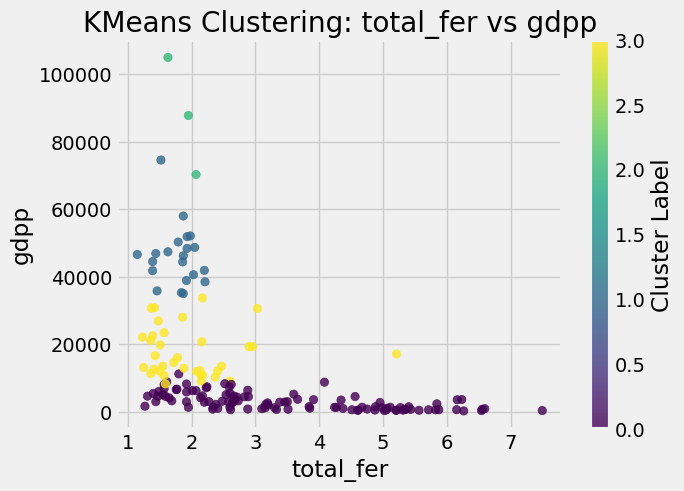

In [43]:
data = pd.DataFrame(num_columns)
num_columns = list(data.columns)

for i in range(len(num_columns)):  # Iterate through all columns
    for j in range(i + 1, len(num_columns)):  # Pair with subsequent columns
        feature1 = num_columns[i]  # Get the feature name
        feature2 = num_columns[j]  # Get the second feature name
        
        # Use the DataFrame `data` to access the feature columns
        plt.scatter(data[feature1], data[feature2], c=kmeans.labels_, cmap='viridis', alpha=0.8)
        plt.xlabel(feature1)
        plt.ylabel(feature2)
        plt.title(f'KMeans Clustering: {feature1} vs {feature2}')
        plt.colorbar(label='Cluster Label')  # Add colorbar for cluster labels
        plt.show()


### 9.1.1. Internal validation:

#### 9.1.1.1. Silhouette Coefficient

In [44]:
silhouette_coefficients = []

for k in range(2, 11):
    kmeans = KMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, kmeans.labels_)
    silhouette_coefficients.append(score)

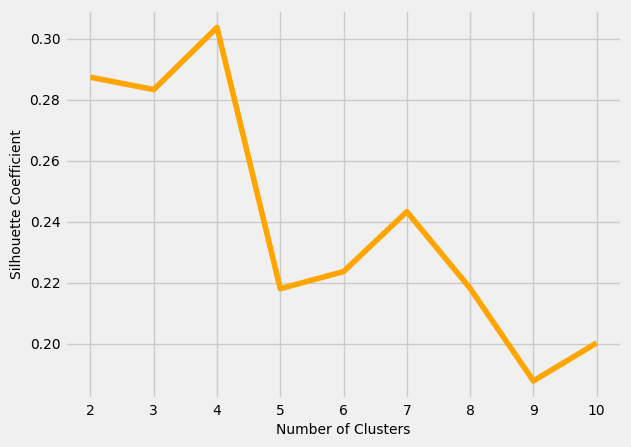

In [45]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [46]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

silhouette_coefficients = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans = KMeans(n_clusters=k, init=i, n_init=n, algorithm=a, max_iter=300, random_state=42)
                kmeans.fit(scaled_features)
                
                # Calculate the silhouette score
                score = silhouette_score(scaled_features, kmeans.labels_)
                silhouette_coefficients.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'silhouette_score'])
results_df

,n_clusters,init,n_init,algorithm,silhouette_score
0,2,k-means++,1,lloyd,0.287357
1,3,k-means++,1,lloyd,0.283296
2,4,k-means++,1,lloyd,0.231108
3,5,k-means++,1,lloyd,0.241162
4,6,k-means++,1,lloyd,0.235070
...,...,...,...,...,...
67,6,random,20,elkan,0.223591
68,7,random,20,elkan,0.243260
69,8,random,20,elkan,0.240485
70,9,random,20,elkan,0.230177


In [47]:
max_index = results_df['silhouette_score'].idxmax()
max_row = results_df.loc[max_index]
max_row

n_clusters                 5
init                  random
n_init                    20
algorithm              lloyd
silhouette_score    0.306451
Name: 57, dtype: object

In [48]:
results_df.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette_score'])

,n_clusters,init,n_init,algorithm,silhouette_score
0,2,k-means++,1,lloyd,0.287357
1,3,k-means++,1,lloyd,0.283296
2,4,k-means++,1,lloyd,0.231108
3,5,k-means++,1,lloyd,0.241162
4,6,k-means++,1,lloyd,0.235070
5,7,k-means++,1,lloyd,0.238300
6,8,k-means++,1,lloyd,0.252543
7,9,k-means++,1,lloyd,0.241528
8,10,k-means++,1,lloyd,0.215569
9,2,k-means++,1,elkan,0.287357


In [49]:
max_value = results_df['silhouette_score'].max()
# Create a mask to extract all rows with the maximum value
max_rows_si = results_df[results_df['silhouette_score'] == max_value]
max_rows_si

,n_clusters,init,n_init,algorithm,silhouette_score
57,5,random,20,lloyd,0.306451
66,5,random,20,elkan,0.306451


# 

#### 9.1.1.2. Calinski harabasz

In [50]:
calinski_harabasz=[]

for k in range(2, 11):
    kmeans = KMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans.fit(scaled_features)
    score = calinski_harabasz_score(scaled_features, kmeans.labels_)
    calinski_harabasz.append(score)

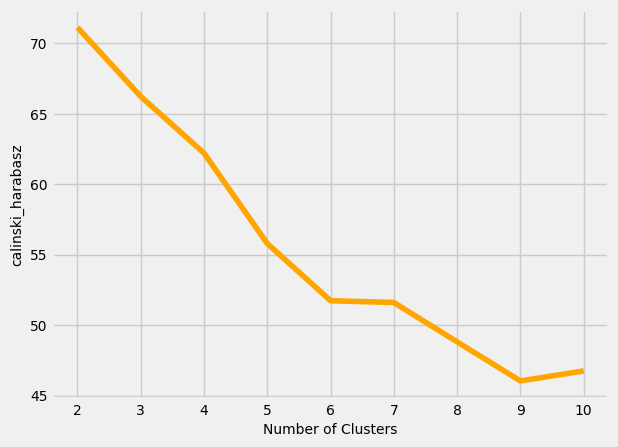

In [51]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabasz, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("calinski_harabasz" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [52]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

calinski_harabasz = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans = KMeans(n_clusters=k, init=i, n_init=n, algorithm=a, max_iter=300, random_state=42)
                kmeans.fit(scaled_features)
                
                # Calculate the silhouette score
                score = calinski_harabasz_score(scaled_features, kmeans.labels_)
                calinski_harabasz.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'calinski_harabasze'])
results_ch

,n_clusters,init,n_init,algorithm,calinski_harabasze
0,2,k-means++,1,lloyd,71.137462
1,3,k-means++,1,lloyd,66.234758
2,4,k-means++,1,lloyd,53.040125
3,5,k-means++,1,lloyd,49.009350
4,6,k-means++,1,lloyd,52.409545
...,...,...,...,...,...
67,6,random,20,elkan,51.732627
68,7,random,20,elkan,51.603750
69,8,random,20,elkan,50.940888
70,9,random,20,elkan,47.746457


In [53]:
max_index = results_ch['calinski_harabasze'].idxmax()
max_row = results_ch.loc[max_index]
max_row

n_clusters                    2
init                  k-means++
n_init                        1
algorithm                 lloyd
calinski_harabasze    71.137462
Name: 0, dtype: object

In [54]:
results_ch.style.highlight_max(color = 'orange', axis = 0, subset= ['calinski_harabasze'])

,n_clusters,init,n_init,algorithm,calinski_harabasze
0,2,k-means++,1,lloyd,71.137462
1,3,k-means++,1,lloyd,66.234758
2,4,k-means++,1,lloyd,53.040125
3,5,k-means++,1,lloyd,49.009350
4,6,k-means++,1,lloyd,52.409545
5,7,k-means++,1,lloyd,48.982567
6,8,k-means++,1,lloyd,51.902692
7,9,k-means++,1,lloyd,48.529517
8,10,k-means++,1,lloyd,46.029430
9,2,k-means++,1,elkan,71.137462


In [55]:
max_value = results_ch['calinski_harabasze'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch = results_ch[results_ch['calinski_harabasze'] == max_value]
max_rows_ch

,n_clusters,init,n_init,algorithm,calinski_harabasze
0,2,k-means++,1,lloyd,71.137462
9,2,k-means++,1,elkan,71.137462
18,2,k-means++,20,lloyd,71.137462
27,2,k-means++,20,elkan,71.137462
54,2,random,20,lloyd,71.137462
63,2,random,20,elkan,71.137462


# 

#### 9.1.1.3. Davies Bouldin

In [56]:
Davies_Bouldin=[]

for k in range(2, 11):
    kmeans = KMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans.fit(scaled_features)
    score = davies_bouldin_score(scaled_features, kmeans.labels_)
    Davies_Bouldin.append(score)

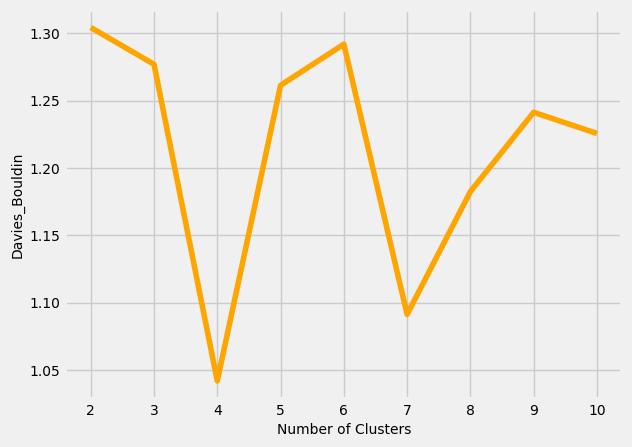

In [57]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies_Bouldin" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [58]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

Davies_bouldin = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans = KMeans(n_clusters=k, init=i, n_init=n, algorithm = a, max_iter=300, random_state=42)
                kmeans.fit(scaled_features)
                
                # Calculate the silhouette score
                score = davies_bouldin_score(scaled_features, kmeans.labels_)
                Davies_bouldin.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db = pd.DataFrame(Davies_bouldin, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'davies_bouldin'])
results_db

,n_clusters,init,n_init,algorithm,davies_bouldin
0,2,k-means++,1,lloyd,1.304259
1,3,k-means++,1,lloyd,1.276906
2,4,k-means++,1,lloyd,1.359906
3,5,k-means++,1,lloyd,1.119243
4,6,k-means++,1,lloyd,1.164978
...,...,...,...,...,...
67,6,random,20,elkan,1.291847
68,7,random,20,elkan,1.091258
69,8,random,20,elkan,1.206185
70,9,random,20,elkan,1.214846


In [59]:
min_index = results_db['davies_bouldin'].idxmin()
min_row = results_db.loc[min_index]
min_row

n_clusters                5
init              k-means++
n_init                   20
algorithm             lloyd
davies_bouldin     0.871793
Name: 21, dtype: object

In [60]:
results_db.style.highlight_min(color = 'orange', axis = 0, subset= ['davies_bouldin'])

,n_clusters,init,n_init,algorithm,davies_bouldin
0,2,k-means++,1,lloyd,1.304259
1,3,k-means++,1,lloyd,1.276906
2,4,k-means++,1,lloyd,1.359906
3,5,k-means++,1,lloyd,1.119243
4,6,k-means++,1,lloyd,1.164978
5,7,k-means++,1,lloyd,1.188665
6,8,k-means++,1,lloyd,1.043641
7,9,k-means++,1,lloyd,1.015735
8,10,k-means++,1,lloyd,1.173144
9,2,k-means++,1,elkan,1.304259


In [61]:
min_value = results_db['davies_bouldin'].min()
# Create a mask to extract all rows with the minimum value
min_rows_db = results_db[results_db['davies_bouldin'] == min_value]
min_rows_db

,n_clusters,init,n_init,algorithm,davies_bouldin
21,5,k-means++,20,lloyd,0.871793
30,5,k-means++,20,elkan,0.871793


### 9.1.2. Final Results from KMeans

In [62]:
min_rows_db["davies_bouldin"]

21    0.871793
30    0.871793
Name: davies_bouldin, dtype: float64

In [63]:
table = pd.concat([max_rows_si, max_rows_ch, min_rows_db], ignore_index=True)
table = table.fillna("-")
table

,n_clusters,init,n_init,algorithm,silhouette_score,calinski_harabasze,davies_bouldin
0,5,random,20,lloyd,0.306451,-,-
1,5,random,20,elkan,0.306451,-,-
2,2,k-means++,1,lloyd,-,71.137462,-
3,2,k-means++,1,elkan,-,71.137462,-
4,2,k-means++,20,lloyd,-,71.137462,-
5,2,k-means++,20,elkan,-,71.137462,-
6,2,random,20,lloyd,-,71.137462,-
7,2,random,20,elkan,-,71.137462,-
8,5,k-means++,20,lloyd,-,-,0.871793
9,5,k-means++,20,elkan,-,-,0.871793


### 9.1.3. Substituting the optimal parameters in KMeans for final model prediction

In [64]:
nclusters = [2,4,5]
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]


best_silhouette = -1  # Silhouette score ranges from -1 to 1, so -1 is a reasonable starting point
best_davies_bouldin = float('inf')  # Davies-Bouldin score should be minimized, so infinity is a good starting point

best_silhouette_params = None
best_davies_params = None

for n in nclusters:
    for i in init:
        for j in n_init:
            for a in algorithm:
                kmeans = KMeans(n_clusters=n, init=i, n_init= j, algorithm = a, max_iter=300, random_state=42)
                kmeans.fit(scaled_features)
                predict_k=kmeans.predict(scaled_features)

                # Calculate silhouette score
                silhouette = silhouette_score(scaled_features, kmeans.labels_)

                # Calculate Davies-Bouldin score
                davies = davies_bouldin_score(scaled_features, kmeans.labels_)

                # Check for max silhouette score
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_silhouette_params = (n, i, j, a)
                    
                    # Check for min Davies-Bouldin score
                if davies < best_davies_bouldin:
                    best_davies_bouldin = davies
                    best_davies_params = (n, i, j, a)


print("\nBest Silhouette Score:")
print(f"n_clusters: {best_silhouette_params[0]}, init: {best_silhouette_params[1]}, n_init: {best_silhouette_params[2]}, algorithm: {best_silhouette_params[3]}")
print(f"Silhouette Score: {best_silhouette:.4f}\n")

print("Best Davies-Bouldin Score:")
print(f"n_clusters: {best_davies_params[0]}, init: {best_davies_params[1]}, n_init: {best_davies_params[2]}, algorithm: {best_davies_params[3]}")
print(f"Davies-Bouldin Score: {best_davies_bouldin:.4f}")


Best Silhouette Score:
n_clusters: 5, init: random, n_init: 20, algorithm: lloyd
Silhouette Score: 0.3065

Best Davies-Bouldin Score:
n_clusters: 5, init: k-means++, n_init: 20, algorithm: lloyd
Davies-Bouldin Score: 0.8718


In [65]:
kmeans = KMeans(n_clusters=4, init="k-means++", n_init= 1, algorithm = "lloyd", max_iter=300, random_state=42)
kmeans.fit(scaled_features)
predict_k=kmeans.predict(scaled_features)

In [66]:
print("silhouette_score:", silhouette_score(scaled_features,kmeans.labels_))
print("calinski_harabasz:", calinski_harabasz_score(scaled_features,kmeans.labels_))
print("davies_bouldin:", davies_bouldin_score(scaled_features,kmeans.labels_))   

silhouette_score: 0.23110753977070106
calinski_harabasz: 53.04012504490151
davies_bouldin: 1.3599058891977467


In [67]:
df1 = df.copy()

In [68]:
df1['K_mean Prediction'] = predict_k
df1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1


In [69]:
df1["K_mean Prediction"].value_counts()

K_mean Prediction
2    65
1    47
3    30
0    25
Name: count, dtype: int64

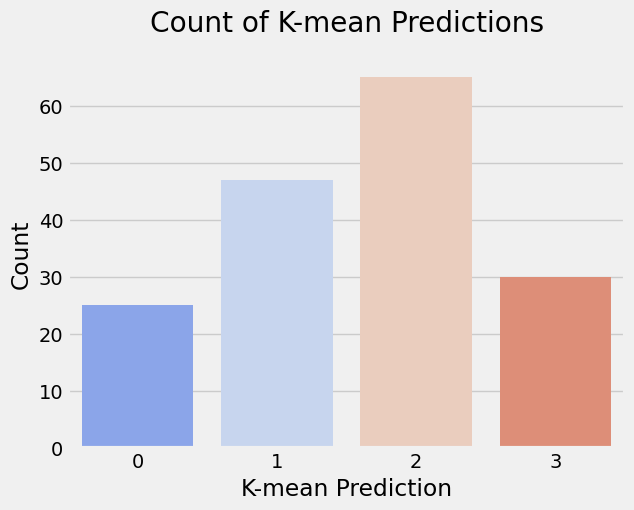

In [70]:
sns.countplot(x=df1["K_mean Prediction"], palette= "coolwarm")
plt.xlabel("K-mean Prediction")
plt.ylabel("Count")
plt.title("Count of K-mean Predictions", pad=20)
plt.show()

## 9.2. AgglomerativeClustering

In [71]:
ag = AgglomerativeClustering(n_clusters=5, linkage='average')
ag.fit(scaled_features)

AgglomerativeClustering(linkage='average', n_clusters=5)

In [72]:
pd.Series(ag.labels_).unique()

array([0, 4, 2, 3, 1])

### 9.2.1. Internal Validation

#### 9.2.1.1. Silhouette Coefficient

In [73]:
silhouette_coefficients = []

for k in range(2, 11):
    ag = AgglomerativeClustering(n_clusters=k)
    ag.fit(scaled_features)
    score = silhouette_score(scaled_features, ag.labels_)
    silhouette_coefficients.append(score)

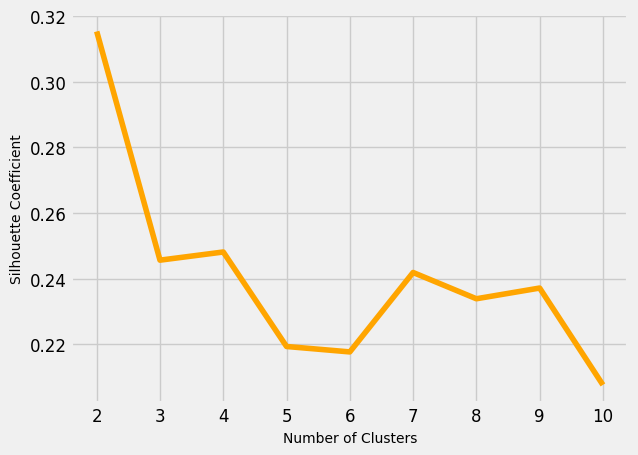

In [74]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [75]:
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

silhouette_coefficients = []

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag.fit(scaled_features)
        
        # Calculate the silhouette score
        score = silhouette_score(scaled_features, ag.labels_)
        silhouette_coefficients.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
result_df = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'linkage', 'silhouette_coefficients'])
result_df

,n_clusters,linkage,silhouette_coefficients
0,2,ward,0.315313
1,3,ward,0.245630
2,4,ward,0.248119
3,5,ward,0.219330
4,6,ward,0.217675
5,7,ward,0.241874
6,8,ward,0.233870
7,9,ward,0.237135
8,2,complete,0.272550
9,3,complete,0.290052


In [76]:
max_index = result_df['silhouette_coefficients'].idxmax()
max_row = result_df.loc[max_index]
max_row

n_clusters                        2
linkage                     average
silhouette_coefficients    0.630338
Name: 16, dtype: object

In [77]:
result_df.style.highlight_max(color = 'red', axis = 0, subset= ['silhouette_coefficients'])

,n_clusters,linkage,silhouette_coefficients
0,2,ward,0.315313
1,3,ward,0.245630
2,4,ward,0.248119
3,5,ward,0.219330
4,6,ward,0.217675
5,7,ward,0.241874
6,8,ward,0.233870
7,9,ward,0.237135
8,2,complete,0.272550
9,3,complete,0.290052


In [78]:
max_value = result_df['silhouette_coefficients'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s = result_df[result_df['silhouette_coefficients'] == max_value]
max_rows_s

,n_clusters,linkage,silhouette_coefficients
16,2,average,0.630338
24,2,single,0.630338


#### 9.2.1.2. Calinski harabasz

In [79]:
calinski_harabasz=[]

for k in range(2, 11):
    ag = AgglomerativeClustering(n_clusters = k)
    ag.fit(scaled_features)
    score = calinski_harabasz_score(scaled_features, ag.labels_)
    calinski_harabasz.append(score)

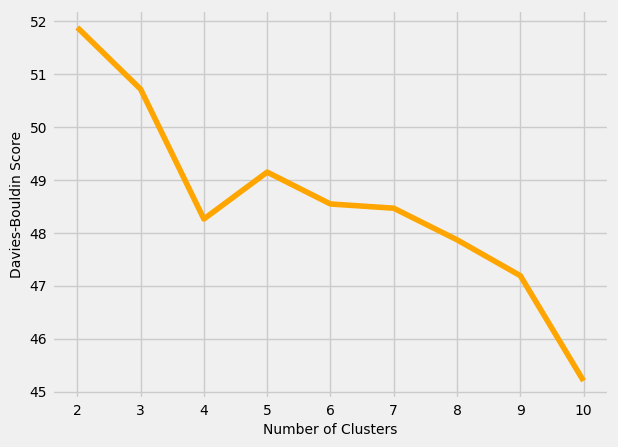

In [80]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabasz, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

#### Tuning hyperparameters

In [81]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

calinski_harabasz = []

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag.fit(scaled_features)
        
        # Calculate the silhouette score
        score = calinski_harabasz_score(scaled_features, ag.labels_)
        calinski_harabasz.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'linkage', 'calinski_harabasz'])
results_ch

,n_clusters,linkage,calinski_harabasz
0,2,ward,51.883430
1,3,ward,50.716151
2,4,ward,48.262593
3,5,ward,49.148383
4,6,ward,48.546270
5,7,ward,48.466199
6,8,ward,47.869375
7,9,ward,47.191340
8,2,complete,60.192228
9,3,complete,49.653679


In [82]:
max_index = results_ch['calinski_harabasz'].idxmax()
max_row = results_ch.loc[max_index]
max_row 

n_clusters                   2
linkage               complete
calinski_harabasz    60.192228
Name: 8, dtype: object

In [83]:
results_ch.style.highlight_max(color = 'red', axis = 0, subset= ['calinski_harabasz'])

,n_clusters,linkage,calinski_harabasz
0,2,ward,51.883430
1,3,ward,50.716151
2,4,ward,48.262593
3,5,ward,49.148383
4,6,ward,48.546270
5,7,ward,48.466199
6,8,ward,47.869375
7,9,ward,47.191340
8,2,complete,60.192228
9,3,complete,49.653679


In [84]:
max_value = results_ch['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch = results_ch[results_ch['calinski_harabasz'] == max_value]
max_rows_ch

,n_clusters,linkage,calinski_harabasz
8,2,complete,60.192228


#

#### 9.2.1.3. Davies Bouldin

In [85]:
Davies_Bouldin=[]

for k in range(2, 11):
    ag = AgglomerativeClustering(n_clusters=k, linkage=l)
    ag.fit(scaled_features)         
    score = davies_bouldin_score(scaled_features, ag.labels_)
    Davies_Bouldin.append(score)

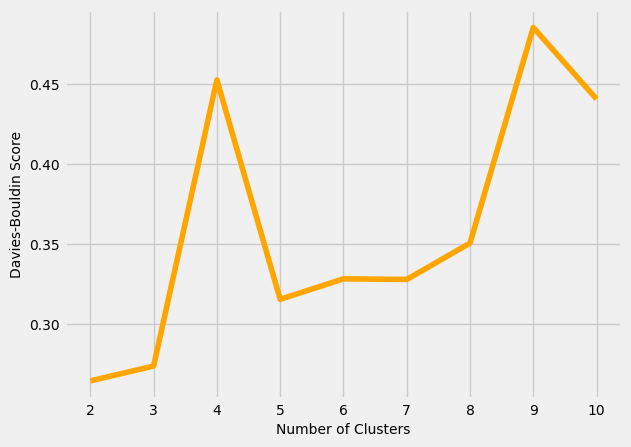

In [86]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

In [87]:
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

Davies_Bouldin=[]

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag.fit(scaled_features)
        
        # Calculate the silhouette score
        score = davies_bouldin_score(scaled_features, ag.labels_)
        Davies_Bouldin.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
result_db = pd.DataFrame(Davies_Bouldin, columns=['n_clusters', 'linkage', 'davies_bouldin'])
result_db

,n_clusters,linkage,davies_bouldin
0,2,ward,1.327258
1,3,ward,1.299789
2,4,ward,1.080126
3,5,ward,1.300801
4,6,ward,1.112785
5,7,ward,1.046616
6,8,ward,1.042658
7,9,ward,1.106138
8,2,complete,1.339072
9,3,complete,1.084870


In [88]:
max_index = result_db['davies_bouldin'].idxmax()
max_row = result_db.loc[max_index]
max_row

n_clusters               2
linkage           complete
davies_bouldin    1.339072
Name: 8, dtype: object

In [89]:
result_db.style.highlight_max(color = 'red', axis = 0, subset= ['davies_bouldin'])

,n_clusters,linkage,davies_bouldin
0,2,ward,1.327258
1,3,ward,1.299789
2,4,ward,1.080126
3,5,ward,1.300801
4,6,ward,1.112785
5,7,ward,1.046616
6,8,ward,1.042658
7,9,ward,1.106138
8,2,complete,1.339072
9,3,complete,1.084870


In [90]:
max_value = result_db['davies_bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db = result_db[result_db['davies_bouldin'] == max_value]
max_rows_db

,n_clusters,linkage,davies_bouldin
8,2,complete,1.339072


### 9.2.2. Final Results from AgglomerativeClustering

In [91]:
table = pd.concat([max_rows_s, max_rows_ch, max_rows_db], ignore_index=True)
table = table.fillna("-")
table

,n_clusters,linkage,silhouette_coefficients,calinski_harabasz,davies_bouldin
0,2,average,0.630338,-,-
1,2,single,0.630338,-,-
2,2,complete,-,60.192228,-
3,2,complete,-,-,1.339072


### 9.2.3. Substituting the optimal parameters in AgglomerativeClustering for final model 

In [92]:
ag = AgglomerativeClustering(n_clusters=2, linkage="average")
ag.fit(scaled_features)

AgglomerativeClustering(linkage='average')

In [93]:
predict_ag = ag.labels_

In [94]:
print("silhouette_score:", silhouette_score(scaled_features,ag.labels_))
print("calinski_harabasz:", calinski_harabasz_score(scaled_features,ag.labels_))
print("davies_bouldin:", davies_bouldin_score(scaled_features,ag.labels_))   

silhouette_score: 0.6303375987432929
calinski_harabasz: 11.39053886751502
davies_bouldin: 0.2644022582485486


In [95]:
pd.Series(predict_ag).nunique()

2

In [96]:
df1['AgglomerativeClustering'] = predict_ag
df1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,0


In [97]:
df1["AgglomerativeClustering"].value_counts()

AgglomerativeClustering
0    166
1      1
Name: count, dtype: int64

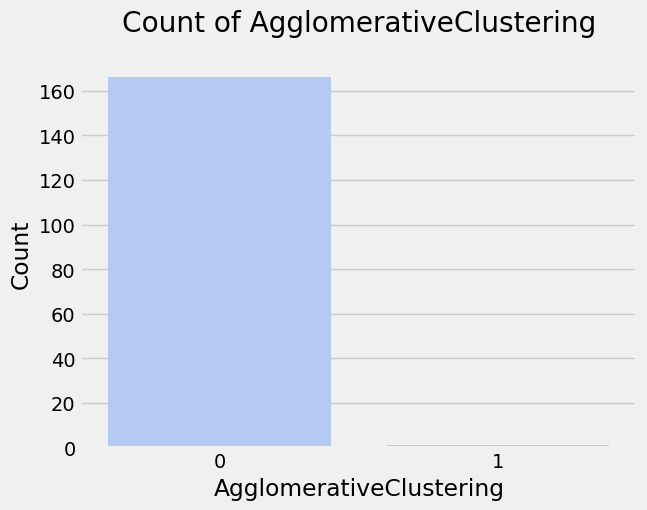

In [98]:
sns.countplot(x=df1["AgglomerativeClustering"], palette= "coolwarm")
plt.xlabel("AgglomerativeClustering")
plt.ylabel("Count")    
plt.title("Count of AgglomerativeClustering", pad=20)
plt.show()

## 9.3. Mini Batch KMeans

In [99]:
List = []

for k in range(1, 11):
    Minikmeans = MiniBatchKMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans.fit(scaled_features)
    List.append(Minikmeans.inertia_)

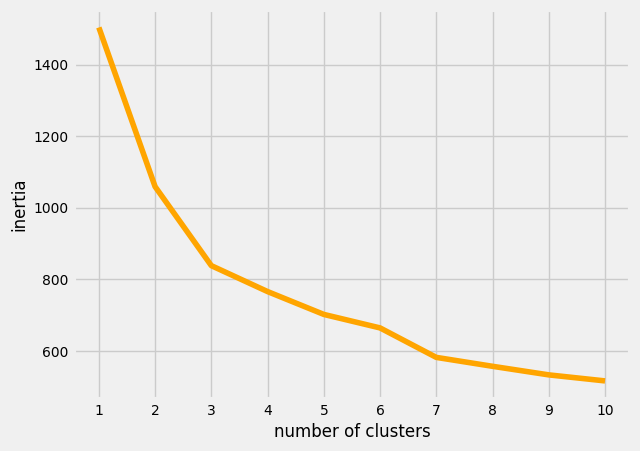

In [100]:
plt.style.use('fivethirtyeight')
plt.plot(range(1,11), List , color= "orange")
plt.xticks(range(1,11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('number of clusters', fontsize=12)
plt.ylabel('inertia', fontsize=12)
plt.show()

In [101]:
kl = KneeLocator(range(1, 11), List, curve="convex", direction="decreasing")
kl.elbow

3

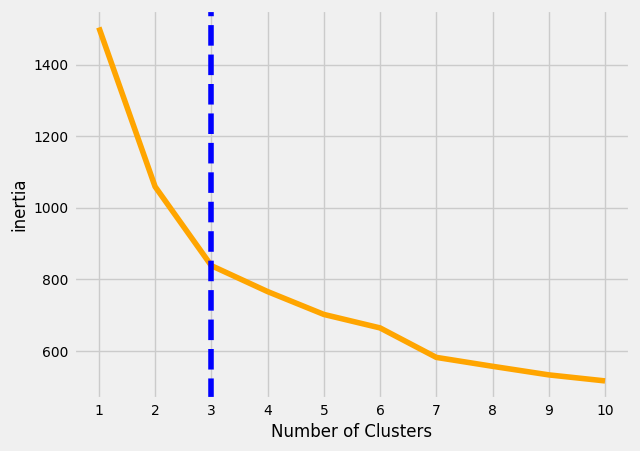

In [102]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), List , color= "orange")

plt.xticks(range(1, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=12)

plt.ylabel("inertia", fontsize=12)
plt.axvline(x=kl.elbow, color='b', label='axvline full height', ls='--')

plt.show()

In [103]:
df.columns

Index(['country', 'child_mort', 'exports', 'health', 'imports', 'income',
       'inflation', 'life_expec', 'total_fer', 'gdpp'],
      dtype='object')

In [104]:
num_columns = df.drop('country', axis = 1)

In [105]:
Minikmeans = MiniBatchKMeans(n_clusters=3).fit(num_columns)
centroids = Minikmeans.cluster_centers_
print(centroids)

[[3.26956888e+01 3.93127573e+01 6.40561387e+00 4.54808127e+01
  1.13367216e+04 8.09733552e+00 7.07184630e+01 2.68970947e+00
  6.07415558e+03]
 [8.15083532e+00 5.92656325e+01 8.24601432e+00 5.09212411e+01
  4.40613365e+04 3.76438186e+00 7.94897375e+01 1.90978520e+00
  4.04498807e+04]
 [7.60578704e+01 2.75289861e+01 6.17163580e+00 4.42493230e+01
  2.68592130e+03 9.57847068e+00 6.25649691e+01 4.64345679e+00
  1.22580247e+03]]


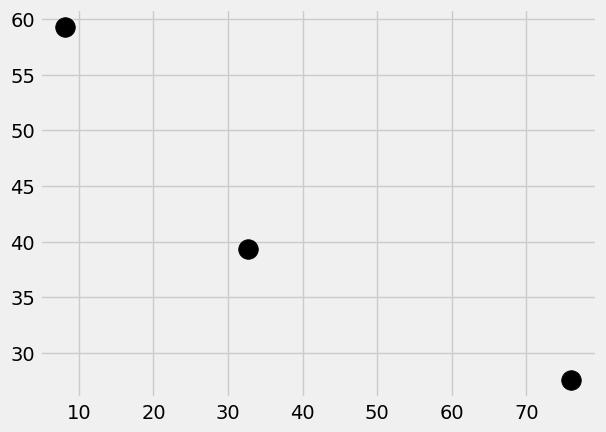

In [106]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=200, alpha= 1)
plt.show()

### 9.3.1. Internal validation: 

#### 9.3.1.1. Silhouette Coefficient

In [107]:
silhouette_coefficients = []

for k in range(2, 11):
    Minikmeans = MiniBatchKMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans.fit(scaled_features)
    score = silhouette_score(scaled_features, Minikmeans.labels_)
    silhouette_coefficients.append(score)

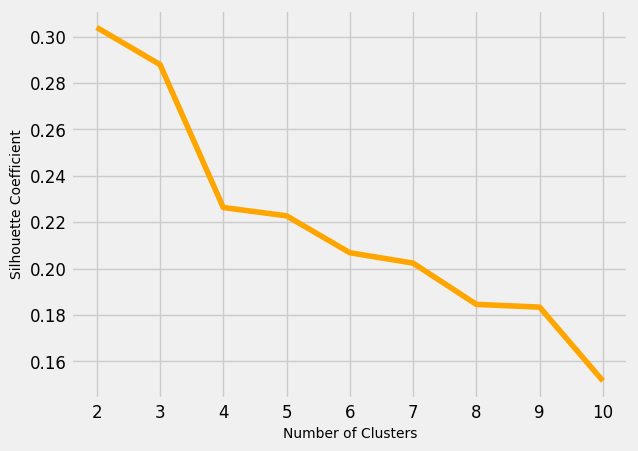

In [108]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [109]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

silhouette_coefficients = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, batch_size=1024, compute_labels=True, max_iter=300, random_state=42)
            Minikmeans.fit(scaled_features)
            
            # Calculate the silhouette score
            score = silhouette_score(scaled_features, Minikmeans.labels_)
            silhouette_coefficients.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'init', 'n_init', 'silhouette_score'])
results_df

,n_clusters,init,n_init,silhouette_score
0,2,k-means++,1,0.304343
1,3,k-means++,1,0.236267
2,4,k-means++,1,0.283581
3,5,k-means++,1,0.304208
4,6,k-means++,1,0.225287
5,7,k-means++,1,0.229617
6,8,k-means++,1,0.240766
7,9,k-means++,1,0.234227
8,10,k-means++,1,0.209978
9,2,k-means++,20,0.289299


In [110]:
max_index = results_df['silhouette_score'].idxmax()
max_row = results_df.loc[max_index]
max_row

n_clusters                  2
init                k-means++
n_init                      1
silhouette_score     0.304343
Name: 0, dtype: object

In [111]:
results_df.style.highlight_max(color = 'red', axis = 0, subset= ['silhouette_score'])

,n_clusters,init,n_init,silhouette_score
0,2,k-means++,1,0.304343
1,3,k-means++,1,0.236267
2,4,k-means++,1,0.283581
3,5,k-means++,1,0.304208
4,6,k-means++,1,0.225287
5,7,k-means++,1,0.229617
6,8,k-means++,1,0.240766
7,9,k-means++,1,0.234227
8,10,k-means++,1,0.209978
9,2,k-means++,20,0.289299


In [112]:
max_value = results_df['silhouette_score'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s = results_df[results_df['silhouette_score'] == max_value]
max_rows_s

,n_clusters,init,n_init,silhouette_score
0,2,k-means++,1,0.304343


#### 9.3.1.2. Calinski harabasz

In [113]:
calinski_harabasz=[]

for k in range(2, 11):
    Minikmeans = MiniBatchKMeans(n_clusters = k)
    Minikmeans.fit(scaled_features)
    score = calinski_harabasz_score(scaled_features, Minikmeans.labels_)
    calinski_harabasz.append(score)

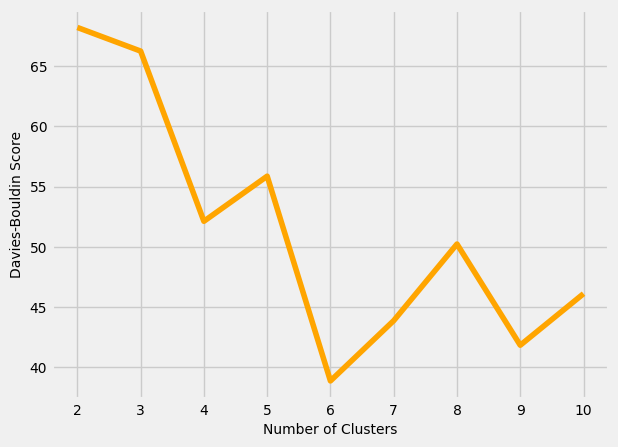

In [114]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabasz, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

#### Tuning hyperparameters

In [115]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

calinski_harabasz = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, max_iter=300, random_state=42)
            Minikmeans.fit(scaled_features)
            
            # Calculate the silhouette score
            score = calinski_harabasz_score(scaled_features, Minikmeans.labels_)
            calinski_harabasz.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'init', 'n_init', 'calinski_harabasz'])
results_ch

,n_clusters,init,n_init,calinski_harabasz
0,2,k-means++,1,59.708724
1,3,k-means++,1,45.051536
2,4,k-means++,1,56.810759
3,5,k-means++,1,53.503288
4,6,k-means++,1,50.444028
5,7,k-means++,1,43.922976
6,8,k-means++,1,47.181481
7,9,k-means++,1,45.694981
8,10,k-means++,1,44.696016
9,2,k-means++,20,70.978327


In [116]:
max_index = results_ch['calinski_harabasz'].idxmax()
max_row = results_ch.loc[max_index]
max_row 

n_clusters                   2
init                 k-means++
n_init                      20
calinski_harabasz    70.978327
Name: 9, dtype: object

In [117]:
results_ch.style.highlight_max(color = 'red', axis = 0, subset= ['calinski_harabasz'])

,n_clusters,init,n_init,calinski_harabasz
0,2,k-means++,1,59.708724
1,3,k-means++,1,45.051536
2,4,k-means++,1,56.810759
3,5,k-means++,1,53.503288
4,6,k-means++,1,50.444028
5,7,k-means++,1,43.922976
6,8,k-means++,1,47.181481
7,9,k-means++,1,45.694981
8,10,k-means++,1,44.696016
9,2,k-means++,20,70.978327


In [118]:
max_value = results_ch['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch = results_ch[results_ch['calinski_harabasz'] == max_value]
max_rows_ch

,n_clusters,init,n_init,calinski_harabasz
9,2,k-means++,20,70.978327


#### 9.3.1.3. Davies Bouldin

In [119]:
Davies_Bouldin=[]

for k in range(2, 11):
    Minikmeans = MiniBatchKMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans.fit(scaled_features)
    score = davies_bouldin_score(scaled_features, Minikmeans.labels_)
    Davies_Bouldin.append(score)

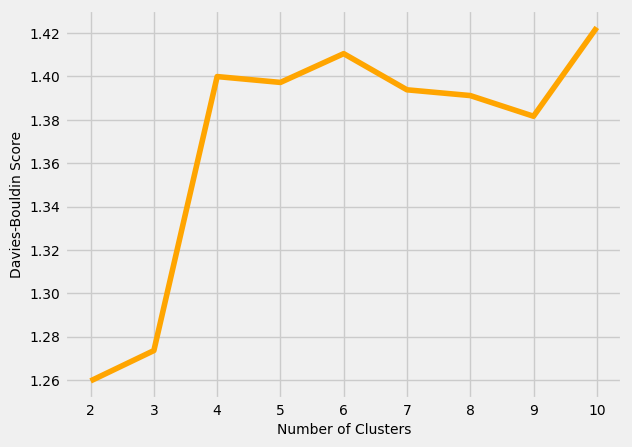

In [120]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

In [121]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

Davies_Bouldin=[]

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, max_iter=300, random_state=42)
            Minikmeans.fit(scaled_features)
            
            # Calculate the silhouette score
            score = davies_bouldin_score(scaled_features, Minikmeans.labels_)
            Davies_Bouldin.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db = pd.DataFrame(Davies_Bouldin, columns=['n_clusters', 'init', 'n_init', 'davies_bouldin'])
results_db

,n_clusters,init,n_init,davies_bouldin
0,2,k-means++,1,1.296870
1,3,k-means++,1,1.354707
2,4,k-means++,1,1.261552
3,5,k-means++,1,1.032841
4,6,k-means++,1,1.194820
5,7,k-means++,1,1.051619
6,8,k-means++,1,0.949453
7,9,k-means++,1,1.004673
8,10,k-means++,1,1.046253
9,2,k-means++,20,1.297214


In [122]:
max_index = results_db['davies_bouldin'].idxmax()
max_row = results_db.loc[max_index]
max_row

n_clusters              10
init                random
n_init                   1
davies_bouldin    1.546207
Name: 26, dtype: object

In [123]:
results_db.style.highlight_max(color = 'red', axis = 0, subset= ['davies_bouldin'])

,n_clusters,init,n_init,davies_bouldin
0,2,k-means++,1,1.296870
1,3,k-means++,1,1.354707
2,4,k-means++,1,1.261552
3,5,k-means++,1,1.032841
4,6,k-means++,1,1.194820
5,7,k-means++,1,1.051619
6,8,k-means++,1,0.949453
7,9,k-means++,1,1.004673
8,10,k-means++,1,1.046253
9,2,k-means++,20,1.297214


In [124]:
max_value = results_db['davies_bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db = results_db[results_db['davies_bouldin'] == max_value]
max_rows_db

,n_clusters,init,n_init,davies_bouldin
26,10,random,1,1.546207


### 9.3.2. Final Results from MiniBatchKMeans

In [125]:
table = pd.concat([max_rows_s, max_rows_ch, max_rows_db], ignore_index=True)
table = table.fillna("-")
table

,n_clusters,init,n_init,silhouette_score,calinski_harabasz,davies_bouldin
0,2,k-means++,1,0.304343,-,-
1,2,k-means++,20,-,70.978327,-
2,10,random,1,-,-,1.546207


### 9.3.3. Substituting the optimal parameters in MiniBatchKMeans for final model prediction

In [126]:
nclusters = [2,4]
init =  ['k-means++', 'random']
n_init = [1,20]

best_silhouette = -1  # Silhouette score ranges from -1 to 1, so -1 is a reasonable starting point
best_davies_bouldin = float('inf')  # Davies-Bouldin score should be minimized, so infinity is a good starting point

best_silhouette_params = None
best_davies_params = None

for n in nclusters:
    for i in init:
        for j in n_init:
                Minikmeans = MiniBatchKMeans(n_clusters=n, init=i, n_init= j, max_iter=300, random_state=42)
                Minikmeans.fit(scaled_features)
                predict_k=Minikmeans.predict(scaled_features)



                # Calculate silhouette score
                silhouette = silhouette_score(scaled_features, Minikmeans.labels_)

                # Calculate Davies-Bouldin score
                davies = davies_bouldin_score(scaled_features, Minikmeans.labels_)

                
                # Check for max silhouette score
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_silhouette_params = (n, i, j)
                    
                    # Check for min Davies-Bouldin score
                if davies < best_davies_bouldin:
                    best_davies_bouldin = davies
                    best_davies_params = (n, i, j)


                #print("silhouette_score:", silhouette_score(scaled_features,kmeans.labels_.max()))
                #print("calinski_harabasz:", calinski_harabasz_score(scaled_features,kmeans.labels_.min()))
                #print("davies_bouldin:", davies_bouldin_score(scaled_features,kmeans.labels_)) 

print("\nBest Silhouette Score:")
print(f"n_clusters: {best_silhouette_params[0]}, init: {best_silhouette_params[1]}, n_init: {best_silhouette_params[2]}")
print(f"Silhouette Score: {best_silhouette:.4f}\n")

print("Best Davies-Bouldin Score:")
print(f"n_clusters: {best_davies_params[0]}, init: {best_davies_params[1]}, n_init: {best_davies_params[2]}")
print(f"Davies-Bouldin Score: {best_davies_bouldin:.4f}") # formatted to 4 decimal places (.4f).


Best Silhouette Score:
n_clusters: 2, init: k-means++, n_init: 1
Silhouette Score: 0.3043

Best Davies-Bouldin Score:
n_clusters: 4, init: k-means++, n_init: 20
Davies-Bouldin Score: 1.0634


In [127]:
Minikmeans = MiniBatchKMeans(n_clusters=2, init="random", n_init=20, max_iter=300, random_state=42)
Minikmeans.fit(scaled_features)
predictMBK=Minikmeans.predict(scaled_features)

In [128]:
print("silhouette_score:", silhouette_score(scaled_features,Minikmeans.labels_))
print("calinski_harabasz:", calinski_harabasz_score(scaled_features,Minikmeans.labels_))
print("davies_bouldin:", davies_bouldin_score(scaled_features,Minikmeans.labels_))   

silhouette_score: 0.26801927653372504
calinski_harabasz: 66.95098166387424
davies_bouldin: 1.3630161585610598


In [129]:
df1['MiniBatchKMeans'] = predictMBK
df1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,0,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,0,1
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,0,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,0,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,0,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,0,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,0,1


In [130]:
df1["MiniBatchKMeans"].value_counts()

MiniBatchKMeans
1    102
0     65
Name: count, dtype: int64

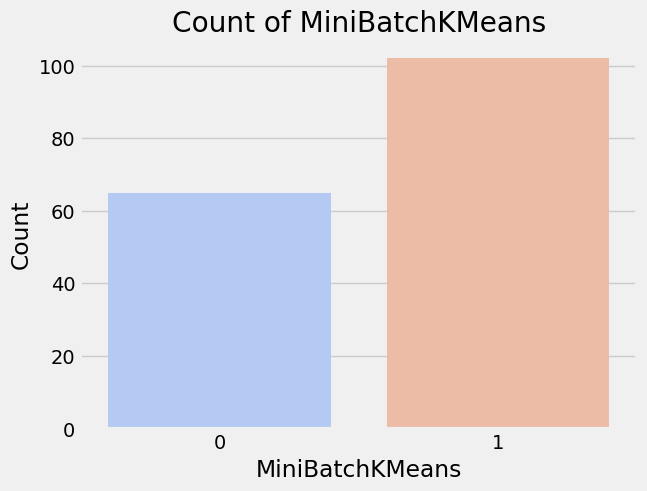

In [131]:
sns.countplot(x=df1["MiniBatchKMeans"], palette= "coolwarm")
plt.xlabel("MiniBatchKMeans")
plt.ylabel("Count")    
plt.title("Count of MiniBatchKMeans")
plt.show()

## 9.4. MeanShift

In [132]:
best_bandwidth = None
max_clusters = 0
min_clusters = float('inf')  # Initialize to a large value

for bw in range(1, 10):            
            ms = MeanShift(bandwidth=bw, bin_seeding=True)
            ms.fit(scaled_features)
            labels = ms.labels_
            labels_unique = np.unique(labels)
            n_clusters_ = len(labels_unique)
            
            print("Bandwidth:", bw, " -> Estimated number of clusters: %d" % n_clusters_)
            
            # Track the best bandwidth with the highest number of clusters
            if n_clusters_ > max_clusters:
                max_clusters = n_clusters_
                best_bandwidth = bw
                
            # Track the minimum number of clusters
            if n_clusters_ < min_clusters:
                min_clusters = n_clusters_
                Minbandwidth = bw  # Update the bandwidth for minimum clusters
    
print("\nBest bandwidth:", best_bandwidth, "with", max_clusters, "clusters")
print("Minimum bandwidth:", Minbandwidth, "with", min_clusters, "clusters")

Bandwidth: 1  -> Estimated number of clusters: 63
Bandwidth: 2  -> Estimated number of clusters: 11
Bandwidth: 3  -> Estimated number of clusters: 5
Bandwidth: 4  -> Estimated number of clusters: 4
Bandwidth: 5  -> Estimated number of clusters: 2
Bandwidth: 6  -> Estimated number of clusters: 2
Bandwidth: 7  -> Estimated number of clusters: 1
Bandwidth: 8  -> Estimated number of clusters: 1
Bandwidth: 9  -> Estimated number of clusters: 1

Best bandwidth: 1 with 63 clusters
Minimum bandwidth: 7 with 1 clusters


In [133]:
ms = MeanShift(bandwidth=9).fit(num_columns)
centroids = ms.cluster_centers_
print(centroids)

[[2.08e+02 1.53e+01 6.91e+00 ... 3.21e+01 3.33e+00 6.62e+02]
 [1.60e+02 1.68e+01 1.31e+01 ... 5.50e+01 5.20e+00 3.99e+02]
 [1.50e+02 3.68e+01 4.53e+00 ... 5.65e+01 6.59e+00 8.97e+02]
 ...
 [2.80e+00 2.00e+02 3.96e+00 ... 8.27e+01 1.15e+00 4.66e+04]
 [2.80e+00 1.75e+02 7.77e+00 ... 8.13e+01 1.63e+00 1.05e+05]
 [2.60e+00 5.34e+01 9.40e+00 ... 8.20e+01 2.20e+00 4.19e+04]]


### 9.4.1. Internal Validation

#### 9.4.1.1. Silhouette coefficient

In [134]:

silhouette_coefficients = []

for bw in range(1, 7):            
            ms = MeanShift(bandwidth=bw, bin_seeding=True)
            ms.fit(scaled_features)
    
            # Check the number of unique labels
            if len(set(ms.labels_)) > 1:  # Proceed only if more than one cluster
                score = silhouette_score(scaled_features, ms.labels_)
                silhouette_coefficients.append((bw, score))  # Store the score with parameter values
            else:
                silhouette_coefficients.append((bw, None))  # Append None if only one cluster

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df = pd.DataFrame(silhouette_coefficients, columns=['n_bandwidth', 'silhouette coefficients'])
results_df

,n_bandwidth,silhouette coefficients
0,1,0.114339
1,2,0.215245
2,3,0.379583
3,4,0.534772
4,5,0.630338
5,6,0.630338


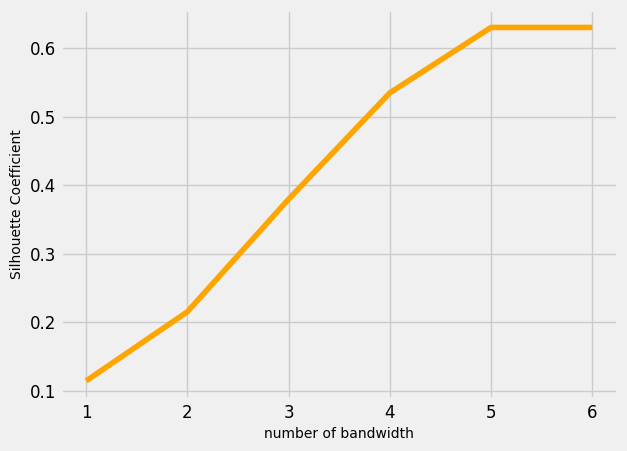

In [135]:

plt.plot(range(1, 7), results_df["silhouette coefficients"], color= "orange")
plt.xticks(range(1, 7), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

In [136]:
max_index = results_df['silhouette coefficients'].idxmax()
max_row = results_df.loc[max_index]
max_row

n_bandwidth                5.000000
silhouette coefficients    0.630338
Name: 4, dtype: float64

In [137]:
results_df.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette coefficients'])

,n_bandwidth,silhouette coefficients
0,1,0.114339
1,2,0.215245
2,3,0.379583
3,4,0.534772
4,5,0.630338
5,6,0.630338


In [138]:
max_value = results_df['silhouette coefficients'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s = results_df[results_df['silhouette coefficients'] == max_value]
max_rows_s

,n_bandwidth,silhouette coefficients
4,5,0.630338
5,6,0.630338


#### 9.4.1.2. Calinski harabasz

In [139]:

calinski_harabasz=[]

for bw in range(1, 15):            
            ms = MeanShift(bandwidth=bw, bin_seeding=True)
            ms.fit(scaled_features)

              
            if len(set(ms.labels_)) > 1:  # Proceed only if more than one cluster
                score = calinski_harabasz_score(scaled_features, ms.labels_)
                calinski_harabasz.append((bw, score))  # Store the score with parameter values
            else:
                calinski_harabasz.append((bw, None))  # Append None if only one cluster
            # Calculate the silhouette score
            
# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch = pd.DataFrame(calinski_harabasz, columns=['n_bandwidth', 'calinski_harabasz'])
results_ch

,n_bandwidth,calinski_harabasz
0,1,26.573744
1,2,30.601885
2,3,14.219834
3,4,13.279147
4,5,11.390539
5,6,11.390539
6,7,NaN
7,8,NaN
8,9,NaN
9,10,NaN


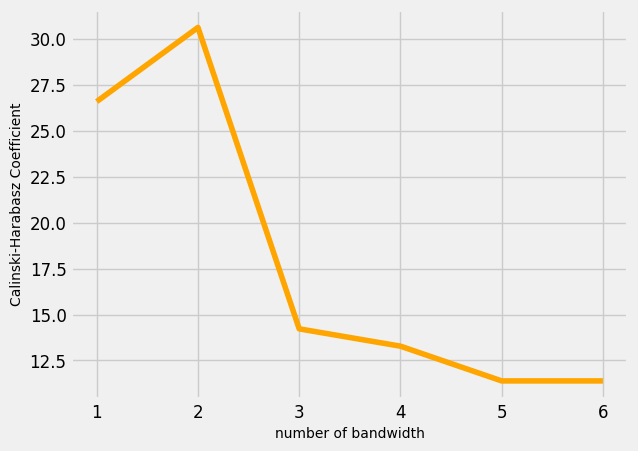

In [140]:

plt.plot(range(1, 7), results_ch["calinski_harabasz"][:6], color= "orange")
plt.xticks(range(1, 7), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Calinski-Harabasz Coefficient" , fontsize=10)
plt.show()

In [141]:
max_index = results_ch['calinski_harabasz'].idxmax()
max_row = results_ch.loc[max_index]
max_row

n_bandwidth           2.000000
calinski_harabasz    30.601885
Name: 1, dtype: float64

In [142]:
results_ch.style.highlight_max(color = 'orange', axis = 0, subset= ['calinski_harabasz'])

,n_bandwidth,calinski_harabasz
0,1,26.573744
1,2,30.601885
2,3,14.219834
3,4,13.279147
4,5,11.390539
5,6,11.390539
6,7,nan
7,8,nan
8,9,nan
9,10,nan


In [143]:
max_value = results_ch['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_c = results_ch[results_ch['calinski_harabasz'] == max_value]
max_rows_c

,n_bandwidth,calinski_harabasz
1,2,30.601885


#### 9.4.1.3. Davies Bouldin

In [144]:

davies_bouldin=[]

for bw in range(1, 15):            
            ms = MeanShift(bandwidth=bw, bin_seeding=True)
            ms.fit(scaled_features)

    
            if len(set(ms.labels_)) > 1:  # Proceed only if more than one cluster
                score = davies_bouldin_score(scaled_features, ms.labels_)
                davies_bouldin.append((bw, score))  # Store the score with parameter values
            else:
                davies_bouldin.append((bw, None))  # Append None if only one cluster
           
# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db = pd.DataFrame(davies_bouldin, columns=['n_bandwidth', 'Davies_Bouldin'])
results_db

,n_bandwidth,Davies_Bouldin
0,1,0.691487
1,2,0.972143
2,3,0.606098
3,4,0.452466
4,5,0.264402
5,6,0.264402
6,7,NaN
7,8,NaN
8,9,NaN
9,10,NaN


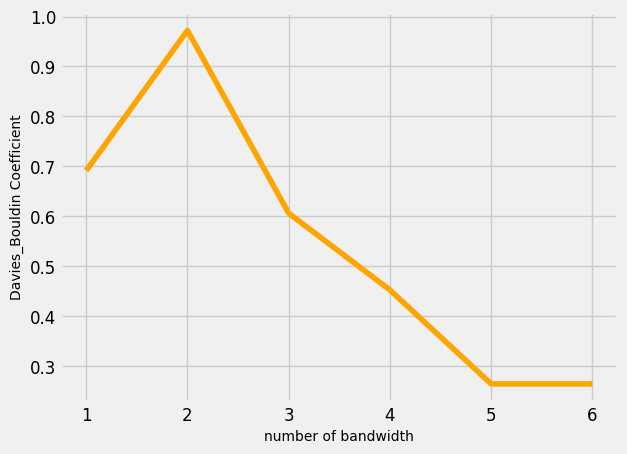

In [145]:

plt.plot(range(1, 7), results_db["Davies_Bouldin"][:6], color= "orange")
plt.xticks(range(1, 7), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Davies_Bouldin Coefficient" , fontsize=10)
plt.show()

In [146]:
max_index = results_db['Davies_Bouldin'].idxmax()
max_row = results_db.loc[max_index]
max_row

n_bandwidth       2.000000
Davies_Bouldin    0.972143
Name: 1, dtype: float64

In [147]:
results_db.style.highlight_max(color = 'orange', axis = 0, subset= ['Davies_Bouldin'])

,n_bandwidth,Davies_Bouldin
0,1,0.691487
1,2,0.972143
2,3,0.606098
3,4,0.452466
4,5,0.264402
5,6,0.264402
6,7,nan
7,8,nan
8,9,nan
9,10,nan


In [148]:
max_value = results_db['Davies_Bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_d = results_db[results_db['Davies_Bouldin'] == max_value]
max_rows_d

,n_bandwidth,Davies_Bouldin
1,2,0.972143


### 9.4.2. Final Results from MeanShift

In [149]:
table = pd.concat([max_rows_s, max_rows_c, max_rows_d], ignore_index=True)
table = table.fillna("-")
table

,n_bandwidth,silhouette coefficients,calinski_harabasz,Davies_Bouldin
0,5,0.630338,-,-
1,6,0.630338,-,-
2,2,-,30.601885,-
3,2,-,-,0.972143


### 9.4.3. Substituting the optimal parameter in MeanShift for final model prediction

In [150]:
bandwidth = [2,5,6]


best_silhouette = -1  # Silhouette score ranges from -1 to 1, so -1 is a reasonable starting point
best_davies_bouldin = float('inf')  # Davies-Bouldin score should be minimized, so infinity is a good starting point

best_silhouette_params = None
best_davies_params = None

for b in bandwidth:
        ms = MeanShift(bandwidth = b)
        ms.fit(scaled_features)
        predict_ms=ms.predict(scaled_features)



        # Calculate silhouette score
        silhouette = silhouette_score(scaled_features, ms.labels_) 

        # Calculate Davies-Bouldin score
        davies = davies_bouldin_score(scaled_features, ms.labels_)

        
        # Check for max silhouette score
        if silhouette > best_silhouette:
            best_silhouette = silhouette
            best_silhouette_params = b
            
            # Check for min Davies-Bouldin score
        if davies < best_davies_bouldin:
            best_davies_bouldin = davies
            best_davies_params = b

print("\nBest Silhouette Score:")
print(f"bandwidth: {best_silhouette_params}")
print(f"Silhouette Score: {best_silhouette:.4f}\n")

print("Best Davies-Bouldin Score:")
print(f"bandwidth: {best_davies_params}")
print(f"Davies-Bouldin Score: {best_davies_bouldin:.4f}")


Best Silhouette Score:
bandwidth: 5
Silhouette Score: 0.6303

Best Davies-Bouldin Score:
bandwidth: 5
Davies-Bouldin Score: 0.2644


In [151]:
ms = MeanShift(bandwidth=5, bin_seeding=True, max_iter=300)
ms.fit(scaled_features)
predict_ms=ms.predict(scaled_features)

In [152]:
print("silhouette_score:", silhouette_score(scaled_features,ms.labels_))
print("calinski_harabasz:", calinski_harabasz_score(scaled_features,ms.labels_))
print("davies_bouldin:", davies_bouldin_score(scaled_features,ms.labels_))   

silhouette_score: 0.6303375987432929
calinski_harabasz: 11.39053886751502
davies_bouldin: 0.2644022582485486


In [153]:
df1['MeanShift Prediction'] = predict_ms
df1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans,MeanShift Prediction
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,0,1,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,0,1,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,0,1,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,0,1,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,0,1,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,0,1,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,1,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,0,1,0


In [154]:
df1["MeanShift Prediction"].value_counts()

MeanShift Prediction
0    166
1      1
Name: count, dtype: int64

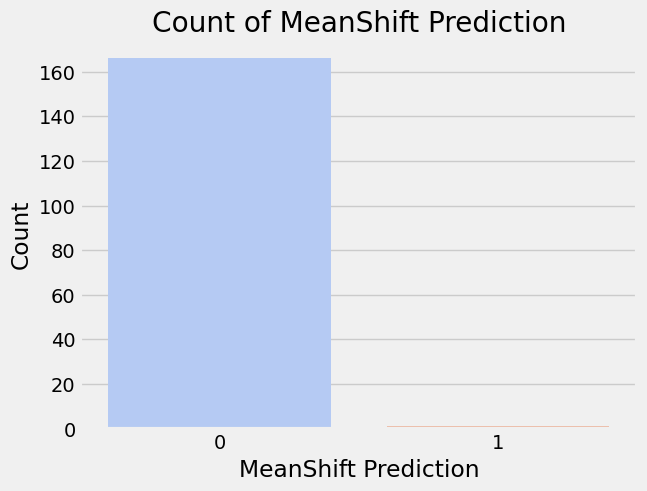

In [155]:
sns.countplot(x=df1["MeanShift Prediction"], palette= "coolwarm")
plt.xlabel("MeanShift Prediction")
plt.ylabel("Count")
plt.title("Count of MeanShift Prediction")
plt.show()

## 9.5. AffinityPropagation

In [156]:
Affinity = AffinityPropagation(random_state=5)
Affinity.fit(scaled_features)
labels = Affinity.labels_
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18])

### 9.5.1. Internal validation: 

#### 9.5.1.1. Silhouette coefficient

In [157]:
silhouette_coefficients = []

for damping in np.arange(0.5, 0.99, 0.04):
    
    af = AffinityPropagation(damping=damping, random_state=42)
    af.fit(scaled_features)
    labels = af.labels_

    if len(np.unique(labels)) > 1:  
        # Calculate silhouette coefficient
        score = silhouette_score(scaled_features, labels)
        silhouette_coefficients.append((damping, score))  # Store damping and score
    else:
        silhouette_coefficients.append((damping, None))  # Append None if only one cluster

In [158]:
# Convert the results into a DataFrame for analysis
results_silhouette = pd.DataFrame(silhouette_coefficients, columns=['damping', 'silhouette_coefficient'])
results_silhouette     

,damping,silhouette_coefficient
0,0.50,0.175080
1,0.54,0.185137
2,0.58,0.181422
3,0.62,0.172072
4,0.66,0.165920
5,0.70,0.176621
6,0.74,0.181422
7,0.78,0.176397
8,0.82,0.171020
9,0.86,0.179119


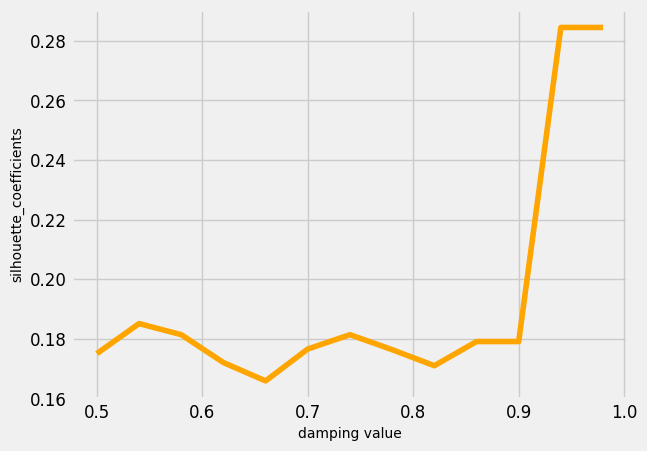

In [159]:
plt.style.use('fivethirtyeight')
plt.plot(results_silhouette["damping"], results_silhouette["silhouette_coefficient"], color="orange")  # Align x-values with damping range
plt.xticks(fontsize=12)  # Match x-ticks with damping values
plt.yticks(fontsize=12)   
plt.xlabel('damping value', fontsize=10)
plt.ylabel('silhouette_coefficients', fontsize=10)
plt.show()

In [160]:
max_index = results_silhouette['silhouette_coefficient'].idxmax()
max_row = results_silhouette.loc[max_index]
max_row

damping                   0.940000
silhouette_coefficient    0.284435
Name: 11, dtype: float64

In [161]:
results_silhouette.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette_coefficient'])

,damping,silhouette_coefficient
0,0.500000,0.175080
1,0.540000,0.185137
2,0.580000,0.181422
3,0.620000,0.172072
4,0.660000,0.165920
5,0.700000,0.176621
6,0.740000,0.181422
7,0.780000,0.176397
8,0.820000,0.171020
9,0.860000,0.179119


In [162]:
max_value = results_silhouette['silhouette_coefficient'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s = results_silhouette[results_silhouette['silhouette_coefficient'] == max_value]
max_rows_s

,damping,silhouette_coefficient
11,0.94,0.284435
12,0.98,0.284435


#### 9.5.1.2. Calinski harabasz

In [163]:
calinski_harabasz=[]

for damping in np.arange(0.5, 0.99, 0.04):
    ch = AffinityPropagation(damping=damping, random_state=42)
    ch.fit(scaled_features)
    score = calinski_harabasz_score(scaled_features, ch.labels_)
    calinski_harabasz.append((damping, score))  # Store the score with parameter values 

In [164]:
results_ch = pd.DataFrame(calinski_harabasz, columns=['damping', 'calinski_harabasz'])
results_ch

,damping,calinski_harabasz
0,0.50,38.591603
1,0.54,39.225693
2,0.58,39.470544
3,0.62,38.419100
4,0.66,38.025943
5,0.70,38.808613
6,0.74,39.470544
7,0.78,38.328742
8,0.82,37.962093
9,0.86,38.490884


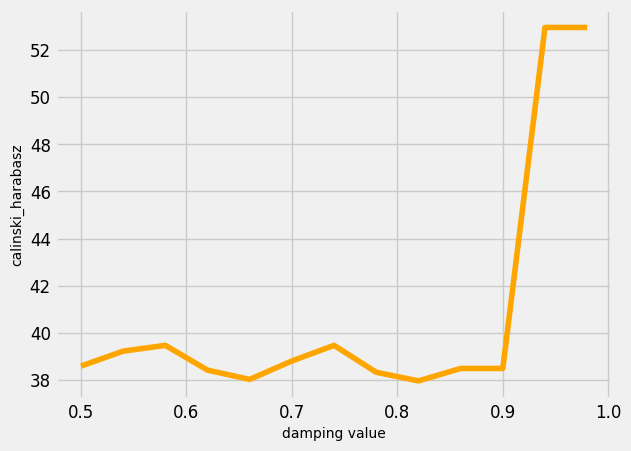

In [165]:
plt.style.use('fivethirtyeight')
plt.plot(results_ch["damping"], results_ch["calinski_harabasz"], color="orange")  # Align x-values with damping range
plt.xticks(fontsize=12)  # Match x-ticks with damping values
plt.yticks(fontsize=12)   
plt.xlabel('damping value', fontsize=10)
plt.ylabel('calinski_harabasz', fontsize=10)
plt.show()

In [166]:
max_index = results_ch['calinski_harabasz'].idxmax()
max_row = results_ch.loc[max_index]
max_row

damping               0.940000
calinski_harabasz    52.958785
Name: 11, dtype: float64

In [167]:
results_ch.style.highlight_max(color = 'orange', axis = 0, subset= ['calinski_harabasz'])

,damping,calinski_harabasz
0,0.500000,38.591603
1,0.540000,39.225693
2,0.580000,39.470544
3,0.620000,38.419100
4,0.660000,38.025943
5,0.700000,38.808613
6,0.740000,39.470544
7,0.780000,38.328742
8,0.820000,37.962093
9,0.860000,38.490884


In [168]:
max_value = results_ch['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch = results_ch[results_ch['calinski_harabasz'] == max_value]
max_rows_ch

,damping,calinski_harabasz
11,0.94,52.958785
12,0.98,52.958785


#### 9.5.1.3. Davies Bouldin

In [169]:
Davies_Bouldin=[]
 
for damping in np.arange(0.5, 0.99, 0.05):
    db = AffinityPropagation(damping=damping, random_state=42)
    db.fit(scaled_features)  
    score = davies_bouldin_score(scaled_features, db.labels_)
    Davies_Bouldin.append((damping, score))  # Store the score with parameter values 

In [170]:
results_db = pd.DataFrame(Davies_Bouldin, columns=['damping', 'Davies_Bouldin'])
results_db

,damping,Davies_Bouldin
0,0.50,1.007231
1,0.55,1.027651
2,0.60,1.011756
3,0.65,1.033638
4,0.70,1.032645
5,0.75,1.020808
6,0.80,1.020808
7,0.85,0.999992
8,0.90,0.999992
9,0.95,1.021000


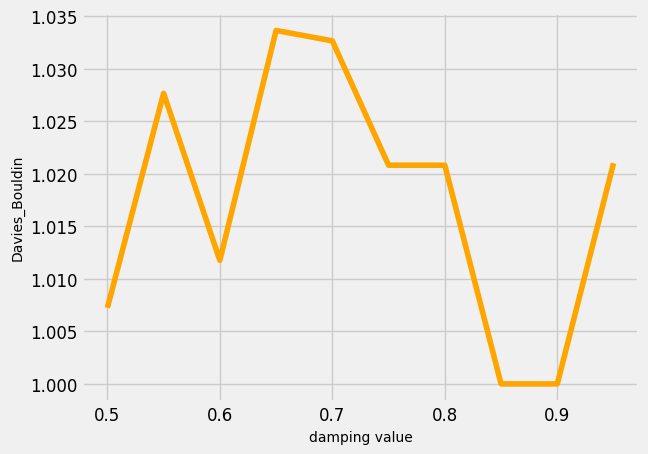

In [171]:
plt.style.use('fivethirtyeight')
plt.plot(results_db["damping"], results_db["Davies_Bouldin"], color="orange")  # Align x-values with damping range
plt.xticks(fontsize=12)  # Match x-ticks with damping values
plt.yticks(fontsize=12)   
plt.xlabel('damping value', fontsize=10)
plt.ylabel('Davies_Bouldin', fontsize=10)
plt.show()

In [172]:
max_index = results_db['Davies_Bouldin'].idxmax()
max_row = results_db.loc[max_index]
max_row

damping           0.650000
Davies_Bouldin    1.033638
Name: 3, dtype: float64

In [173]:
results_db.style.highlight_max(color = 'red', axis = 0, subset= ['Davies_Bouldin'])

,damping,Davies_Bouldin
0,0.500000,1.007231
1,0.550000,1.027651
2,0.600000,1.011756
3,0.650000,1.033638
4,0.700000,1.032645
5,0.750000,1.020808
6,0.800000,1.020808
7,0.850000,0.999992
8,0.900000,0.999992
9,0.950000,1.021000


In [174]:
max_value = results_db['Davies_Bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db = results_db[results_db['Davies_Bouldin'] == max_value]
max_rows_db

,damping,Davies_Bouldin
3,0.65,1.033638


### 9.5.2. Final Results from AffinityPropagation

In [175]:
table = pd.concat([max_rows_s, max_rows_ch, max_rows_db], ignore_index=True)
table = table.fillna("-")
table

,damping,silhouette_coefficient,calinski_harabasz,Davies_Bouldin
0,0.94,0.284435,-,-
1,0.98,0.284435,-,-
2,0.94,-,52.958785,-
3,0.98,-,52.958785,-
4,0.65,-,-,1.033638


### 9.5.3. Substituting the optimal parameters in AffinityPropagation for final model prediction

In [176]:
af = AffinityPropagation(damping=0.95, random_state=42)
af.fit(scaled_features)
labels = af.labels_

In [177]:
np.unique(labels)

array([0, 1, 2, 3])

In [178]:
print("silhouette_score:", silhouette_score(scaled_features,af.labels_))
print("calinski_harabasz:", calinski_harabasz_score(scaled_features,af.labels_))
print("davies_bouldin:", davies_bouldin_score(scaled_features,af.labels_))   

silhouette_score: 0.284435074161594
calinski_harabasz: 52.95878517240729
davies_bouldin: 1.0209999882393315


In [179]:
predict_af=af.fit_predict(scaled_features)

In [180]:
df1['AffinityPropagation'] = predict_af
df1

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans,MeanShift Prediction,AffinityPropagation
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,0,1,0,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,2,0,1,0,2
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,2,0,1,0,2
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,0,1,0,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,2,0,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,2,0,1,0,2
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,2,0,1,0,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,1,0,2
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,0,1,0,1


In [181]:
df1["AffinityPropagation"].value_counts()

AffinityPropagation
2    103
1     44
3     17
0      3
Name: count, dtype: int64

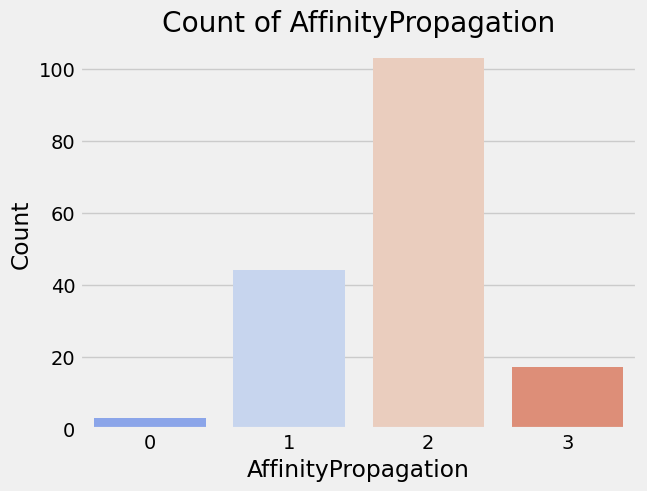

In [182]:
sns.countplot(x=df1["AffinityPropagation"], palette= "coolwarm")
plt.xlabel("AffinityPropagation")
plt.ylabel("Count")
plt.title("Count of AffinityPropagation")
plt.show()

## 9.6. Models Comparison

In [183]:
df2 = pd.DataFrame({'models':['kmeans','MiniBatchKMeans','MeanShift','Affinity Propagation']
                     ,'silhouette_coefficients':[0.2880471307804802, 0.19076996839841237, 0.6303375987432929,0.284435074161594]
                     ,'calinski_harabasz_score':[54.37794973180769, 49.195474385843646, 11.39053886751502, 52.95878517240729]
                      , "davies_bouldin" : [0.9982610375914969, 1.6429745929647592, 0.2644022582485486, 1.0209999882393315 ]
                     ,'n_clusters':[4,4,2,4]})
df2

,models,silhouette_coefficients,calinski_harabasz_score,davies_bouldin,n_clusters
0,kmeans,0.288047,54.377950,0.998261,4
1,MiniBatchKMeans,0.190770,49.195474,1.642975,4
2,MeanShift,0.630338,11.390539,0.264402,2
3,Affinity Propagation,0.284435,52.958785,1.021000,4


# 10. PCA

In [184]:
pca = PCA()
pca.fit_transform(scaled_features)
explained_variance = pca.explained_variance_ratio_

print('PCA singular values:\n\n',pca.singular_values_)
print()
print('PCA components:\n\n',pca.components_)
print()
print('PCA explained variance ratio:\n\n',pca.explained_variance_ratio_)

PCA singular values:

 [26.28030915 16.06984236 13.9804868  12.88910478 10.5034936   6.11048666
  4.35250145  3.84039901  3.34187463]

PCA components:

 [[-0.41951945  0.28389698  0.15083782  0.16148244  0.39844111 -0.19317293
   0.42583938 -0.40372896  0.39264482]
 [ 0.19288394  0.61316349 -0.24308678  0.67182064  0.02253553 -0.00840447
  -0.22270674  0.15523311 -0.0460224 ]
 [-0.02954353  0.14476069 -0.59663237 -0.29992674  0.3015475   0.64251951
   0.11391854  0.01954925  0.12297749]
 [ 0.37065326  0.00309102  0.4618975  -0.07190746  0.39215904  0.15044176
  -0.20379723  0.37830365  0.53199457]
 [-0.16896968  0.05761584  0.51800037  0.25537642 -0.2471496   0.7148691
   0.1082198  -0.13526221 -0.18016662]
 [ 0.20062815 -0.05933283  0.00727646 -0.03003154  0.16034699  0.06628537
  -0.60112652 -0.75068875  0.01677876]
 [-0.07948854 -0.70730269 -0.24983051  0.59218953  0.09556237  0.10463252
   0.01848639  0.02882643  0.24299776]
 [-0.68274306 -0.01419742  0.07249683 -0.02894642  0.3526

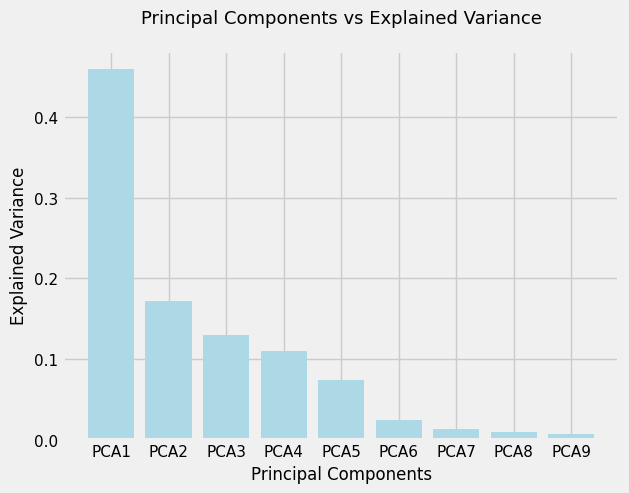

In [185]:
labels = ['PCA' + str(x) for x in range(1, len(explained_variance) + 1)]
plt.bar(x=range(1, len(pca.explained_variance_ratio_) + 1), height = pca.explained_variance_ratio_, tick_label=labels, color="lightblue")
plt.xlabel('Principal Components', fontsize=12)
plt.ylabel('Explained Variance', fontsize=12)
plt.xticks(fontsize=11)
plt.yticks(fontsize=11)
plt.title("Principal Components vs Explained Variance", fontsize=13, pad=20)

plt.show()

#### Observation:
From plot above it is observed that PCA1 and PCA2 contain more information than others. So we go with PCA1 and PCA2

In [186]:
pca = PCA(n_components = 2) 
pca_model = pca.fit_transform(scaled_features) 
pca_df = pd.DataFrame(pca_model) 
pca_df.columns = ['P1', 'P2'] 
pca_df

,P1,P2
0,-2.913025,0.095621
1,0.429911,-0.588156
2,-0.285225,-0.455174
3,-2.932423,1.695555
4,1.033576,0.136659
...,...,...
162,-0.820631,0.639570
163,-0.551036,-1.233886
164,0.498524,1.390744
165,-1.887451,-0.109453


In [187]:
pca_df.describe().T

,count,mean,std,min,25%,50%,75%,max
P1,167.0,-1.063687e-17,2.039748,-4.912066,-1.382270,0.022407,1.224328,6.917755
P2,167.0,3.191060e-17,1.247262,-2.997364,-0.752048,-0.094499,0.553475,6.682090


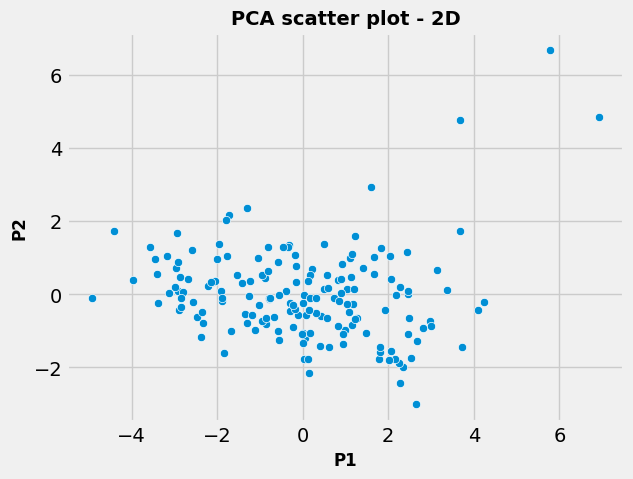

In [188]:
sns.scatterplot(data=pca_df, x="P1", y="P2", palette= "coolwarm")
plt.xlabel("P1", fontsize= 12 , fontweight='bold')
plt.ylabel("P2" , fontsize= 12 , fontweight='bold')
plt.title("PCA scatter plot - 2D", fontsize=14, fontweight='bold' )
plt.show()

# 11. Models with PCA

## 11.1. KMeans

In [189]:
List = []

for k in range(1, 11):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans_pca.fit(pca_model)
    List.append(kmeans_pca.inertia_)

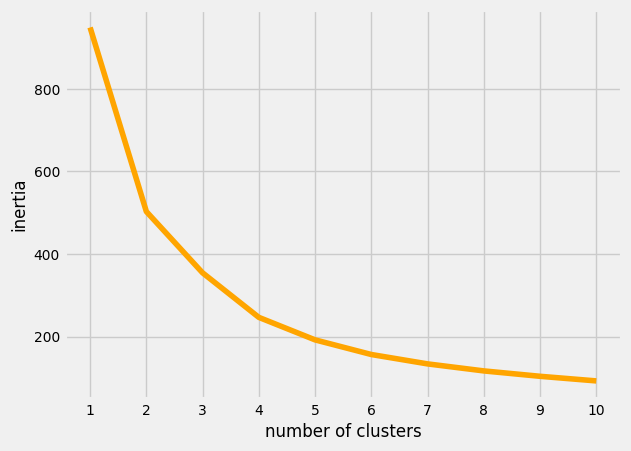

In [190]:
plt.style.use('fivethirtyeight')
plt.plot(range(1,11),List , color= "orange")
plt.xticks(range(1,11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('number of clusters', fontsize=12)
plt.ylabel('inertia', fontsize=12)
plt.show()

In [191]:
kl = KneeLocator(range(1, 11), List, curve="convex", direction="decreasing")
kl.elbow

4

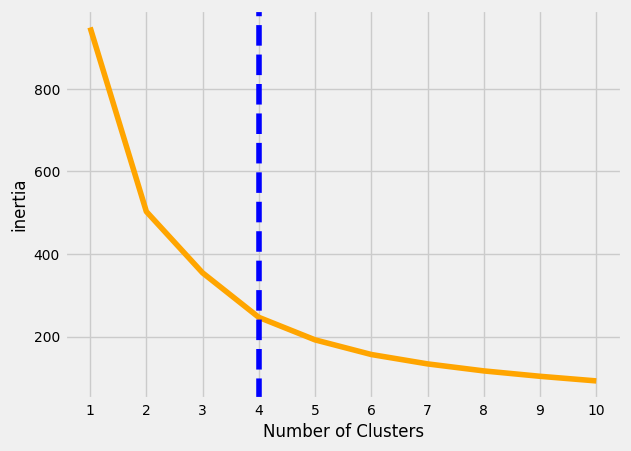

In [192]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), List , color= "orange")

plt.xticks(range(1, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=12)

plt.ylabel("inertia", fontsize=12)
plt.axvline(x=kl.elbow, color='b', label='axvline full height', ls='--')

plt.show()

In [193]:
kmeans_pca = KMeans(n_clusters=3).fit(num_columns)
centroids = kmeans_pca.cluster_centers_
print(centroids)

[[4.73898437e+01 3.58656172e+01 6.33203125e+00 4.59216086e+01
  8.56924219e+03 8.95764844e+00 6.78734375e+01 3.26335938e+00
  4.43839063e+03]
 [6.22857143e+00 9.64428571e+01 5.71285714e+00 6.85714286e+01
  8.03428571e+04 6.38871429e+00 8.02857143e+01 1.76714286e+00
  6.54428571e+04]
 [8.80000000e+00 4.99781250e+01 8.99156250e+00 4.60218750e+01
  3.76218750e+04 3.38331250e+00 7.91562500e+01 1.94468750e+00
  3.55875000e+04]]


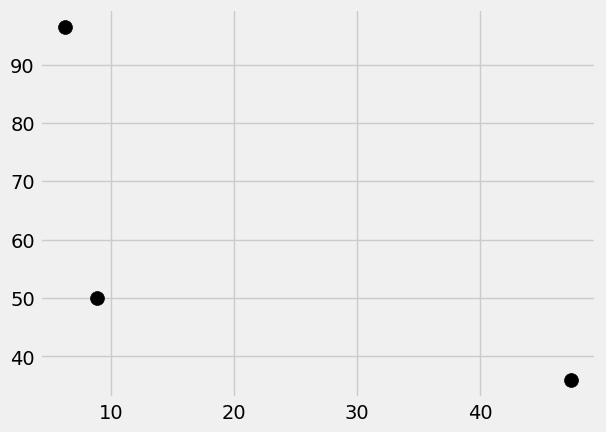

In [194]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=100, alpha= 1)
plt.show()

### 11.1.1. Internal validation:

#### 11.1.1.1. Silhouette Coefficient

In [195]:
silhouette_coefficients = []

for k in range(2, 11):
    kmeans_pca = KMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans_pca.fit(pca_model)
    score = silhouette_score(pca_model, kmeans_pca.labels_)
    silhouette_coefficients.append(score)

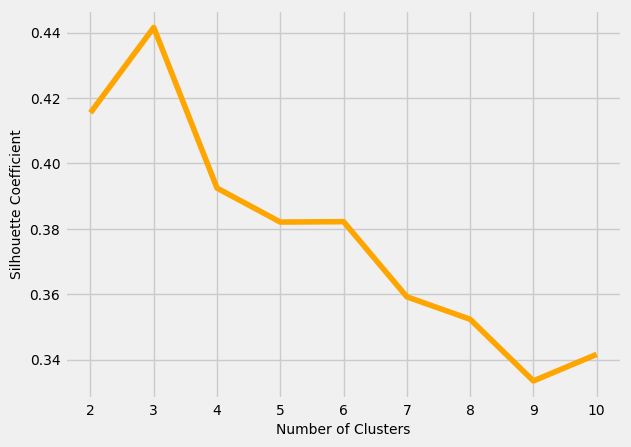

In [196]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [197]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

silhouette_coefficients = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans_pca = KMeans(n_clusters=k, init=i, n_init=n, algorithm=a, max_iter=300, random_state=42)
                kmeans_pca.fit(pca_model)
                
                # Calculate the silhouette score
                score = silhouette_score(pca_model, kmeans_pca.labels_)
                silhouette_coefficients.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df_pca = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'silhouette_score'])
results_df_pca

,n_clusters,init,n_init,algorithm,silhouette_score
0,2,k-means++,1,lloyd,0.415523
1,3,k-means++,1,lloyd,0.442497
2,4,k-means++,1,lloyd,0.398402
3,5,k-means++,1,lloyd,0.382064
4,6,k-means++,1,lloyd,0.375807
...,...,...,...,...,...
67,6,random,20,elkan,0.382190
68,7,random,20,elkan,0.356408
69,8,random,20,elkan,0.354428
70,9,random,20,elkan,0.347812


In [198]:
max_index = results_df_pca['silhouette_score'].idxmax()
max_row = results_df_pca.loc[max_index]
max_row

n_clusters                  3
init                k-means++
n_init                      1
algorithm               lloyd
silhouette_score     0.442497
Name: 1, dtype: object

In [199]:
results_df_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette_score'])

,n_clusters,init,n_init,algorithm,silhouette_score
0,2,k-means++,1,lloyd,0.415523
1,3,k-means++,1,lloyd,0.442497
2,4,k-means++,1,lloyd,0.398402
3,5,k-means++,1,lloyd,0.382064
4,6,k-means++,1,lloyd,0.375807
5,7,k-means++,1,lloyd,0.349965
6,8,k-means++,1,lloyd,0.315182
7,9,k-means++,1,lloyd,0.331412
8,10,k-means++,1,lloyd,0.332195
9,2,k-means++,1,elkan,0.415523


In [200]:
max_value = results_df_pca['silhouette_score'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s_pca = results_df_pca[results_df_pca['silhouette_score'] == max_value]
max_rows_s_pca

,n_clusters,init,n_init,algorithm,silhouette_score
1,3,k-means++,1,lloyd,0.442497
10,3,k-means++,1,elkan,0.442497
19,3,k-means++,20,lloyd,0.442497
28,3,k-means++,20,elkan,0.442497


#### 11.1.1.2. Silhouette CoefficientCalinski harabasz

In [201]:
calinski_harabasz=[]

for k in range(2, 11):
    kmeans_pca = KMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans_pca.fit(pca_model)
    score = calinski_harabasz_score(pca_model, kmeans_pca.labels_)
    calinski_harabasz.append(score)

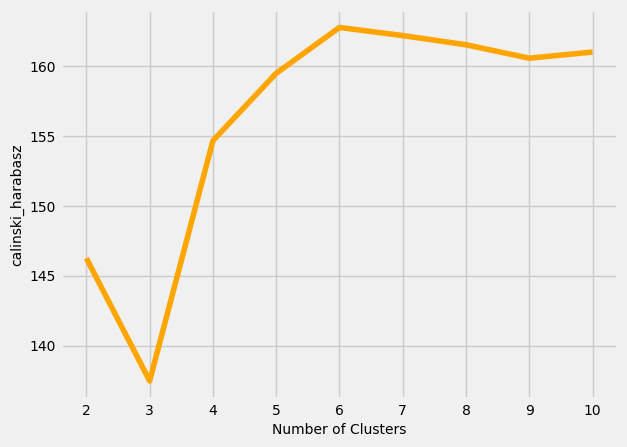

In [202]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabasz, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("calinski_harabasz" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [203]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

calinski_harabasz = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans_pca = KMeans(n_clusters=k, init=i, n_init=n, algorithm=a, max_iter=300, random_state=42)
                kmeans_pca.fit(pca_model)
                
                # Calculate the silhouette score
                score = calinski_harabasz_score(pca_model, kmeans_pca.labels_)
                calinski_harabasz.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch_pca = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'calinski_harabasze'])
results_ch_pca

,n_clusters,init,n_init,algorithm,calinski_harabasze
0,2,k-means++,1,lloyd,146.257729
1,3,k-means++,1,lloyd,137.475711
2,4,k-means++,1,lloyd,154.176190
3,5,k-means++,1,lloyd,159.503609
4,6,k-means++,1,lloyd,161.657709
...,...,...,...,...,...
67,6,random,20,elkan,162.784396
68,7,random,20,elkan,162.879481
69,8,random,20,elkan,163.931294
70,9,random,20,elkan,162.668674


In [204]:
max_index = results_ch_pca['calinski_harabasze'].idxmax()
max_row = results_ch_pca.loc[max_index]
max_row

n_clusters                    10
init                      random
n_init                        20
algorithm                  lloyd
calinski_harabasze    167.461198
Name: 62, dtype: object

In [205]:
results_ch_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['calinski_harabasze'])

,n_clusters,init,n_init,algorithm,calinski_harabasze
0,2,k-means++,1,lloyd,146.257729
1,3,k-means++,1,lloyd,137.475711
2,4,k-means++,1,lloyd,154.176190
3,5,k-means++,1,lloyd,159.503609
4,6,k-means++,1,lloyd,161.657709
5,7,k-means++,1,lloyd,155.405164
6,8,k-means++,1,lloyd,145.128170
7,9,k-means++,1,lloyd,153.800274
8,10,k-means++,1,lloyd,154.966948
9,2,k-means++,1,elkan,146.257729


In [206]:
max_value = results_ch_pca['calinski_harabasze'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch_pca = results_ch_pca[results_ch_pca['calinski_harabasze'] == max_value]
max_rows_ch_pca

,n_clusters,init,n_init,algorithm,calinski_harabasze
62,10,random,20,lloyd,167.461198
71,10,random,20,elkan,167.461198


#### 11.1.1.3. Silhouette CoefficientDavies Bouldin

In [207]:
Davies_Bouldin=[]

for k in range(2, 11):
    kmeans_pca = KMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    kmeans_pca.fit(pca_model)
    score = davies_bouldin_score(pca_model, kmeans_pca.labels_)
    Davies_Bouldin.append(score)

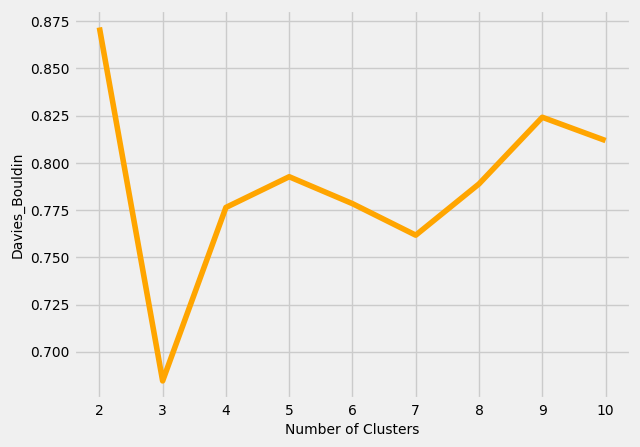

In [208]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color= "orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies_Bouldin" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [209]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]
nclusters = range(2,11)

Davies_bouldin = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for a in algorithm:
            for k in nclusters:
                kmeans_pca = KMeans(n_clusters=k, init=i, n_init=n, algorithm = a, max_iter=300, random_state=42)
                kmeans_pca.fit(pca_model)
                
                # Calculate the silhouette score
                score = davies_bouldin_score(pca_model, kmeans_pca.labels_)
                Davies_bouldin.append((k, i, n, a, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db_pca = pd.DataFrame(Davies_bouldin, columns=['n_clusters', 'init', 'n_init', 'algorithm', 'davies_bouldin'])
results_db_pca

,n_clusters,init,n_init,algorithm,davies_bouldin
0,2,k-means++,1,lloyd,0.871664
1,3,k-means++,1,lloyd,0.682420
2,4,k-means++,1,lloyd,0.753101
3,5,k-means++,1,lloyd,0.792647
4,6,k-means++,1,lloyd,0.782364
...,...,...,...,...,...
67,6,random,20,elkan,0.778395
68,7,random,20,elkan,0.774556
69,8,random,20,elkan,0.785512
70,9,random,20,elkan,0.803062


In [210]:
max_index = results_db_pca['davies_bouldin'].idxmax()
max_row = results_db_pca.loc[max_index]
max_row

n_clusters               4
init                random
n_init                   1
algorithm            lloyd
davies_bouldin    0.970364
Name: 38, dtype: object

In [211]:
results_db_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['davies_bouldin'])

,n_clusters,init,n_init,algorithm,davies_bouldin
0,2,k-means++,1,lloyd,0.871664
1,3,k-means++,1,lloyd,0.682420
2,4,k-means++,1,lloyd,0.753101
3,5,k-means++,1,lloyd,0.792647
4,6,k-means++,1,lloyd,0.782364
5,7,k-means++,1,lloyd,0.809734
6,8,k-means++,1,lloyd,0.905657
7,9,k-means++,1,lloyd,0.885065
8,10,k-means++,1,lloyd,0.872018
9,2,k-means++,1,elkan,0.871664


In [212]:
max_value = results_db_pca['davies_bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db_pca = results_db_pca[results_db_pca['davies_bouldin'] == max_value]
max_rows_db_pca

,n_clusters,init,n_init,algorithm,davies_bouldin
38,4,random,1,lloyd,0.970364
47,4,random,1,elkan,0.970364


### 11.1.2. Silhouette CoefficientFinal Results from KMeans

In [213]:
table1_pca = pd.concat([max_rows_s_pca, max_rows_ch_pca, max_rows_db_pca], ignore_index=True)
table1_pca = table1_pca.fillna("-")
table1_pca

,n_clusters,init,n_init,algorithm,silhouette_score,calinski_harabasze,davies_bouldin
0,3,k-means++,1,lloyd,0.442497,-,-
1,3,k-means++,1,elkan,0.442497,-,-
2,3,k-means++,20,lloyd,0.442497,-,-
3,3,k-means++,20,elkan,0.442497,-,-
4,10,random,20,lloyd,-,167.461198,-
5,10,random,20,elkan,-,167.461198,-
6,4,random,1,lloyd,-,-,0.970364
7,4,random,1,elkan,-,-,0.970364


### 11.1.3. Silhouette CoefficientSubstituting the optimal parameters in KMeans for final model prediction

In [214]:
nclusters = [2,4,5]
init =  ['k-means++', 'random']
n_init = [1 ,20]
algorithm = ["lloyd", "elkan"]


best_silhouette = -1  # Silhouette score ranges from -1 to 1, so -1 is a reasonable starting point
best_davies_bouldin = float('inf')  # Davies-Bouldin score should be minimized, so infinity is a good starting point

best_silhouette_params = None
best_davies_params = None

for n in nclusters:
    for i in init:
        for j in n_init:
            for a in algorithm:
                kmeans_pca = KMeans(n_clusters=n, init=i, n_init= j, algorithm = a, max_iter=300, random_state=42)
                kmeans_pca.fit(scaled_features)
                predict_k=kmeans_pca.predict(scaled_features)



                # Calculate silhouette score
                silhouette = silhouette_score(scaled_features, kmeans_pca.labels_)

                # Calculate Davies-Bouldin score
                davies = davies_bouldin_score(scaled_features, kmeans_pca.labels_)

                
                # Check for max silhouette score
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_silhouette_params = (n, i, j, a)
                    
                    # Check for min Davies-Bouldin score
                if davies < best_davies_bouldin:
                    best_davies_bouldin = davies
                    best_davies_params = (n, i, j, a)


print("\nBest Silhouette Score:")
print(f"n_clusters: {best_silhouette_params[0]}, init: {best_silhouette_params[1]}, n_init: {best_silhouette_params[2]}, algorithm: {best_silhouette_params[3]}")
print(f"Silhouette Score: {best_silhouette:.4f}\n")

print("Best Davies-Bouldin Score:")
print(f"n_clusters: {best_davies_params[0]}, init: {best_davies_params[1]}, n_init: {best_davies_params[2]}, algorithm: {best_davies_params[3]}")
print(f"Davies-Bouldin Score: {best_davies_bouldin:.4f}")


Best Silhouette Score:
n_clusters: 5, init: random, n_init: 20, algorithm: lloyd
Silhouette Score: 0.3065

Best Davies-Bouldin Score:
n_clusters: 5, init: k-means++, n_init: 20, algorithm: lloyd
Davies-Bouldin Score: 0.8718


In [215]:
kmeans_pca = KMeans(n_clusters=5, init="k-means++", n_init = 1, algorithm	= "lloyd", max_iter=300, random_state=42)
kmeans_pca.fit(pca_model)
predict_k_pca=kmeans_pca.predict(pca_model)

In [216]:
print("silhouette_score:", silhouette_score(pca_model,kmeans_pca.labels_))
print("calinski_harabasz:", calinski_harabasz_score(pca_model,kmeans_pca.labels_))
print("davies_bouldin:", davies_bouldin_score(pca_model,kmeans_pca.labels_))   

silhouette_score: 0.3820636406980114
calinski_harabasz: 159.50360915797327
davies_bouldin: 0.7926471576723666


In [217]:
centroids = kmeans_pca.cluster_centers_
print(centroids)

[[ 0.77969542  0.69131449]
 [-2.549867    0.48172658]
 [ 5.46022462  5.43247334]
 [ 2.46204546 -0.91603382]
 [-0.29706419 -0.66604964]]


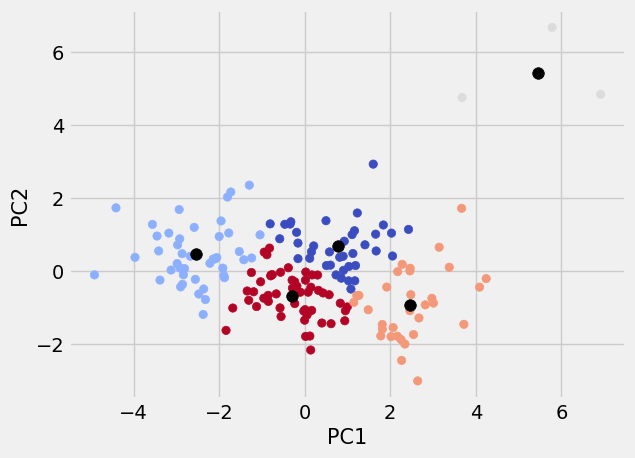

In [218]:
plt.scatter(pca_df['P1'], pca_df['P2'], c =kmeans_pca.fit_predict(pca_model), cmap='coolwarm') 
plt.scatter(centroids[:, 0], centroids[:,1], c='black', s=70) 
plt.xlabel("PC1",fontsize=15)
plt.ylabel("PC2",fontsize=15)
plt.show()

In [219]:
df2 = df.copy()

In [220]:
df2['K_mean Prediction'] = predict_k_pca
df2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,4
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,4
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0
...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,4
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,4
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1


In [221]:
df2["K_mean Prediction"].value_counts()

K_mean Prediction
4    51
1    43
0    38
3    32
2     3
Name: count, dtype: int64

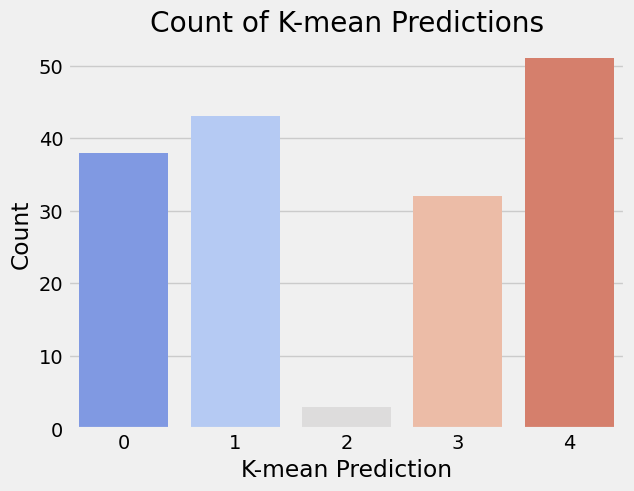

In [222]:
sns.countplot(x=df2["K_mean Prediction"], palette= "coolwarm")
plt.xlabel("K-mean Prediction")
plt.ylabel("Count")
plt.title("Count of K-mean Predictions")
plt.show()

## 11.2. AgglomerativeClustering

In [223]:
ag_pca = AgglomerativeClustering(n_clusters=5, linkage='average')
ag_pca.fit(pca_model)

AgglomerativeClustering(linkage='average', n_clusters=5)

In [224]:
pd.Series(ag_pca.labels_).unique()

array([4, 2, 0, 1, 3])

### 11.2.1. Internal Validation

#### 11.2.1.1. Silhouette Coefficient

In [225]:
silhouette_coefficients = []

for k in range(2, 11):
    ag_pca = AgglomerativeClustering(n_clusters=k)
    ag_pca.fit(pca_model)
    score = silhouette_score(pca_model, ag_pca.labels_)
    silhouette_coefficients.append(score)

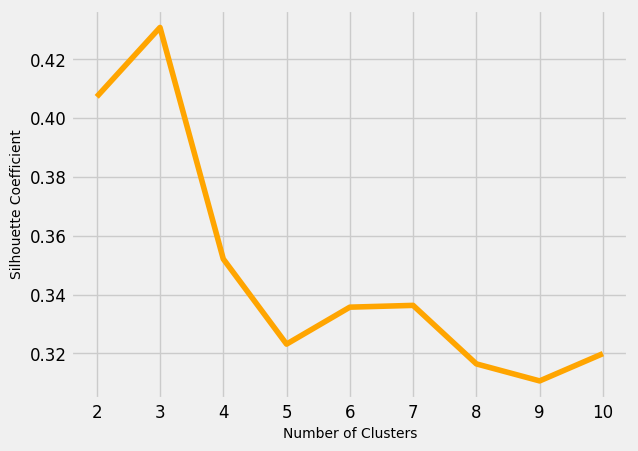

In [226]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [227]:
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

silhouette_coefficients = []

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag_pca = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag_pca.fit(pca_model)
        
        # Calculate the silhouette score
        score = silhouette_score(pca_model, ag_pca.labels_)
        silhouette_coefficients.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
result_df_pca = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'linkage', 'silhouette_coefficients'])
result_df_pca

,n_clusters,linkage,silhouette_coefficients
0,2,ward,0.407245
1,3,ward,0.430843
2,4,ward,0.352117
3,5,ward,0.323149
4,6,ward,0.335718
5,7,ward,0.336325
6,8,ward,0.316427
7,9,ward,0.310638
8,2,complete,0.660860
9,3,complete,0.433868


In [228]:
max_index = result_df_pca['silhouette_coefficients'].idxmax()
max_row = result_df_pca.loc[max_index]
max_row

n_clusters                        2
linkage                      single
silhouette_coefficients    0.684826
Name: 24, dtype: object

In [229]:
result_df_pca.style.highlight_max(color = 'red', axis = 0, subset= ['silhouette_coefficients'])

,n_clusters,linkage,silhouette_coefficients
0,2,ward,0.407245
1,3,ward,0.430843
2,4,ward,0.352117
3,5,ward,0.323149
4,6,ward,0.335718
5,7,ward,0.336325
6,8,ward,0.316427
7,9,ward,0.310638
8,2,complete,0.660860
9,3,complete,0.433868


In [230]:
max_value = result_df_pca['silhouette_coefficients'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s_pca = result_df_pca[result_df_pca['silhouette_coefficients'] == max_value]
max_rows_s_pca

,n_clusters,linkage,silhouette_coefficients
24,2,single,0.684826


#### 11.2.1.2. Calinski harabasz

In [231]:
calinski_harabasz=[]

for k in range(2, 11):
    ag_pca = AgglomerativeClustering(n_clusters = k)
    ag_pca.fit(pca_model)
    score = calinski_harabasz_score(pca_model, ag_pca.labels_)
    calinski_harabasz.append(score)

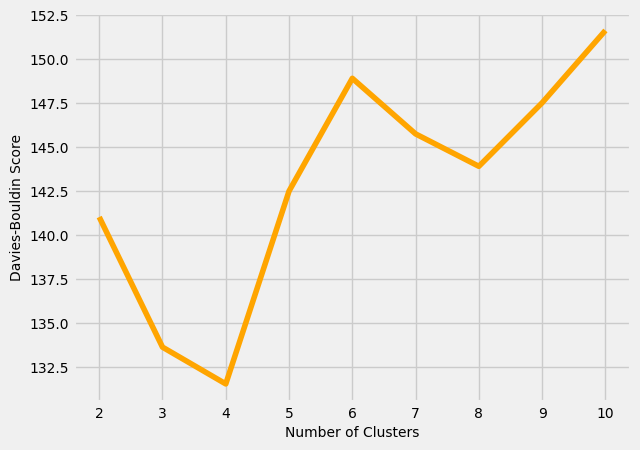

In [232]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), calinski_harabasz, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

#### Tuning hyperparameters

In [233]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

calinski_harabasz = []

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag_pca = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag_pca.fit(pca_model)
        
        # Calculate the silhouette score
        score = calinski_harabasz_score(pca_model, ag_pca.labels_)
        calinski_harabasz.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch_pca = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'linkage', 'calinski_harabasz'])
results_ch_pca

,n_clusters,linkage,calinski_harabasz
0,2,ward,141.029072
1,3,ward,133.627445
2,4,ward,131.535654
3,5,ward,142.505755
4,6,ward,148.920696
5,7,ward,145.759322
6,8,ward,143.915625
7,9,ward,147.529069
8,2,complete,38.953986
9,3,complete,110.540623


In [234]:
max_index = results_ch_pca['calinski_harabasz'].idxmax()
max_row = results_ch_pca.loc[max_index]
max_row 

n_clusters                    6
linkage                    ward
calinski_harabasz    148.920696
Name: 4, dtype: object

In [235]:
results_ch_pca.style.highlight_max(color = 'red', axis = 0, subset= ['calinski_harabasz'])

,n_clusters,linkage,calinski_harabasz
0,2,ward,141.029072
1,3,ward,133.627445
2,4,ward,131.535654
3,5,ward,142.505755
4,6,ward,148.920696
5,7,ward,145.759322
6,8,ward,143.915625
7,9,ward,147.529069
8,2,complete,38.953986
9,3,complete,110.540623


In [236]:
max_value = results_ch_pca['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch_pca = results_ch_pca[results_ch_pca['calinski_harabasz'] == max_value]
max_rows_ch_pca

,n_clusters,linkage,calinski_harabasz
4,6,ward,148.920696


#### 11.2.1.3. Davies Bouldin

In [237]:
Davies_Bouldin=[]

for k in range(2, 11):
    ag_pca = AgglomerativeClustering(n_clusters = k)
    ag_pca.fit(pca_model)
    score = davies_bouldin_score(pca_model, ag_pca.labels_)
    Davies_Bouldin.append(score)

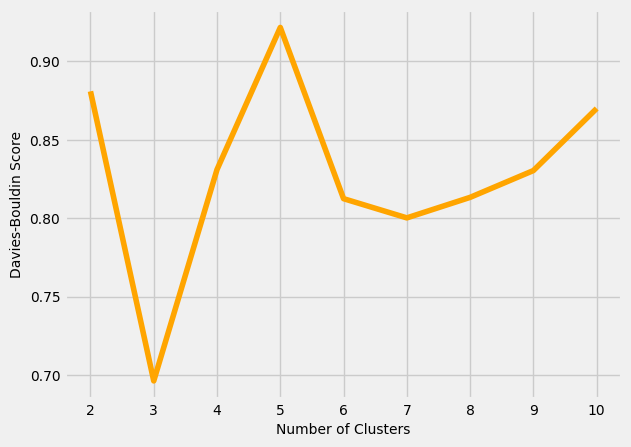

In [238]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

In [239]:
linkage =  ['ward', 'complete', "average", "single"]
nclusters = range(2,10)

Davies_Bouldin=[]

# Iterate over all combinations of parameters

for l in linkage:
    for k in nclusters:
        ag_pca = AgglomerativeClustering(n_clusters=k, linkage=l)
        ag_pca.fit(pca_model)
        
        # Calculate the silhouette score
        score = davies_bouldin_score(pca_model, ag_pca.labels_)
        Davies_Bouldin.append((k, l, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
result_db_pca = pd.DataFrame(Davies_Bouldin, columns=['n_clusters', 'linkage', 'davies_bouldin'])
result_db_pca

,n_clusters,linkage,davies_bouldin
0,2,ward,0.880891
1,3,ward,0.696306
2,4,ward,0.831051
3,5,ward,0.921614
4,6,ward,0.812475
5,7,ward,0.800225
6,8,ward,0.813308
7,9,ward,0.830391
8,2,complete,0.442251
9,3,complete,0.623308


In [240]:
max_index = result_db_pca['davies_bouldin'].idxmax()
max_row = result_db_pca.loc[max_index]
max_row

n_clusters               5
linkage               ward
davies_bouldin    0.921614
Name: 3, dtype: object

In [241]:
result_db_pca.style.highlight_max(color = 'red', axis = 0, subset= ['davies_bouldin'])

,n_clusters,linkage,davies_bouldin
0,2,ward,0.880891
1,3,ward,0.696306
2,4,ward,0.831051
3,5,ward,0.921614
4,6,ward,0.812475
5,7,ward,0.800225
6,8,ward,0.813308
7,9,ward,0.830391
8,2,complete,0.442251
9,3,complete,0.623308


In [242]:
max_value = result_db_pca['davies_bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db_pca = result_db_pca[result_db_pca['davies_bouldin'] == max_value]
max_rows_db_pca

,n_clusters,linkage,davies_bouldin
3,5,ward,0.921614


### 11.2.2. Final Results from AgglomerativeClustering

In [243]:
table4_pca = pd.concat([max_rows_s_pca, max_rows_ch_pca, max_rows_db_pca], ignore_index=True)
table4_pca = table4_pca.fillna("-")
table4_pca

,n_clusters,linkage,silhouette_coefficients,calinski_harabasz,davies_bouldin
0,2,single,0.684826,-,-
1,6,ward,-,148.920696,-
2,5,ward,-,-,0.921614


### 11.2.3. Substituting the optimal parameters in AgglomerativeClustering for final model 

In [244]:
ag_pca = AgglomerativeClustering(n_clusters=5, linkage="ward")
ag_pca.fit(pca_model)

AgglomerativeClustering(n_clusters=5)

In [245]:
predict_ag_pca = ag_pca.labels_

In [246]:
print("silhouette_score:", silhouette_score(pca_model,ag_pca.labels_))
print("calinski_harabasz:", calinski_harabasz_score(pca_model,ag_pca.labels_))
print("davies_bouldin:", davies_bouldin_score(pca_model,ag_pca.labels_))   

silhouette_score: 0.3231492041200303
calinski_harabasz: 142.505755425454
davies_bouldin: 0.9216143217571737


In [247]:
pd.Series(predict_ag_pca).nunique()

5

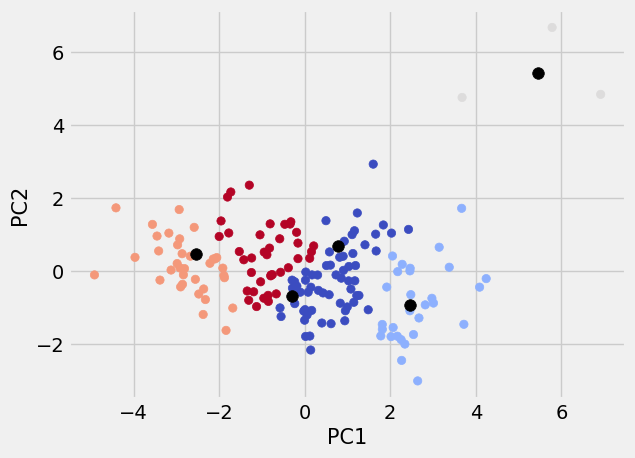

In [248]:
plt.scatter(pca_df['P1'], pca_df['P2'], c =ag_pca.fit_predict(pca_model), cmap='coolwarm') 
plt.scatter(centroids[:, 0], centroids[:,1], c='black', s=70) 
plt.xlabel("PC1",fontsize=15)
plt.ylabel("PC2",fontsize=15)
plt.show()

In [249]:
df2['AgglomerativeClustering'] = predict_ag_pca
df2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,3
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,4,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,4,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,3
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,4,4
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,4,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,3


In [250]:
df2["AgglomerativeClustering"].value_counts()

AgglomerativeClustering
0    61
4    39
3    35
1    29
2     3
Name: count, dtype: int64

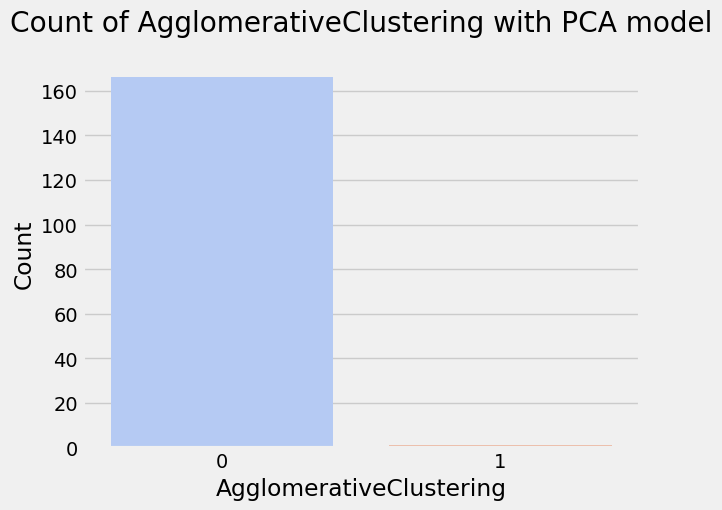

In [251]:
sns.countplot(x=df1["AgglomerativeClustering"], palette= "coolwarm")
plt.xlabel("AgglomerativeClustering")
plt.ylabel("Count")    
plt.title("Count of AgglomerativeClustering with PCA model", pad=20)
plt.show()

## 11.3. MiniBatchKMeans

In [252]:
List = []

for k in range(1, 11):
    Minikmeans_pca = MiniBatchKMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans_pca.fit(pca_model)          
    List.append(Minikmeans_pca.inertia_) 

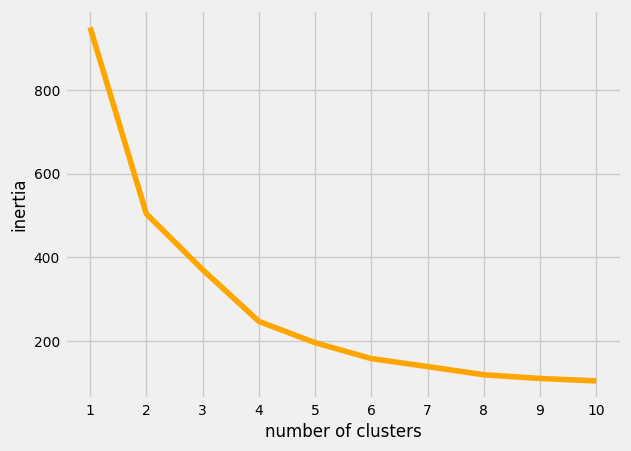

In [253]:
plt.style.use('fivethirtyeight')
plt.plot(range(1,11), List , color= "orange")
plt.xticks(range(1,11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel('number of clusters', fontsize=12)
plt.ylabel('inertia', fontsize=12)
plt.show()

In [254]:
kl = KneeLocator(range(1, 11), List, curve="convex", direction="decreasing")
kl.elbow

4

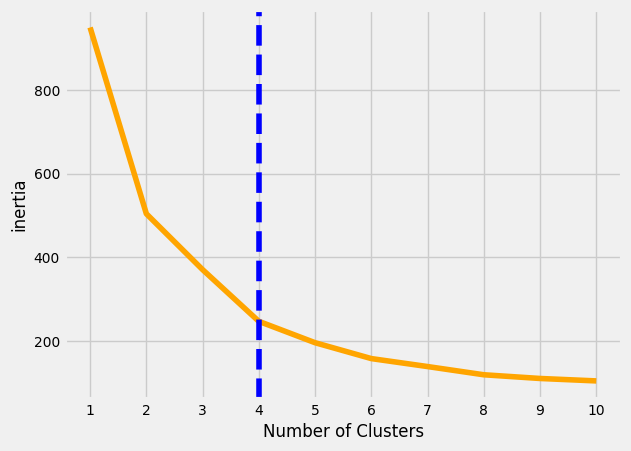

In [255]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), List , color= "orange")

plt.xticks(range(1, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=12)

plt.ylabel("inertia", fontsize=12)
plt.axvline(x=kl.elbow, color='b', label='axvline full height', ls='--')

plt.show()

In [256]:
num_columns

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200
...,...,...,...,...,...,...,...,...,...
162,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970
163,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500
164,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310
165,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310


In [257]:
Minikmeans_pca = MiniBatchKMeans(n_clusters=4).fit(num_columns)
centroids = Minikmeans_pca.cluster_centers_
print(centroids)

[[5.58928314e+01 3.26767890e+01 6.37295762e+00 4.52796888e+01
  5.88570289e+03 9.33555816e+00 6.61060866e+01 3.59334085e+00
  2.75949865e+03]
 [5.19538153e+00 5.42114458e+01 9.21783133e+00 4.57289157e+01
  4.76915663e+04 3.02005823e+00 8.03907631e+01 1.78066265e+00
  4.54042169e+04]
 [1.50252809e+01 5.10624719e+01 6.62652809e+00 4.90801124e+01
  2.36216854e+04 6.76493146e+00 7.53252809e+01 2.05030337e+00
  1.51213820e+04]
 [5.47647059e+00 8.71779412e+01 5.78794118e+00 5.87485294e+01
  9.60441176e+04 5.66917647e+00 8.04867647e+01 1.90294118e+00
  8.45411765e+04]]


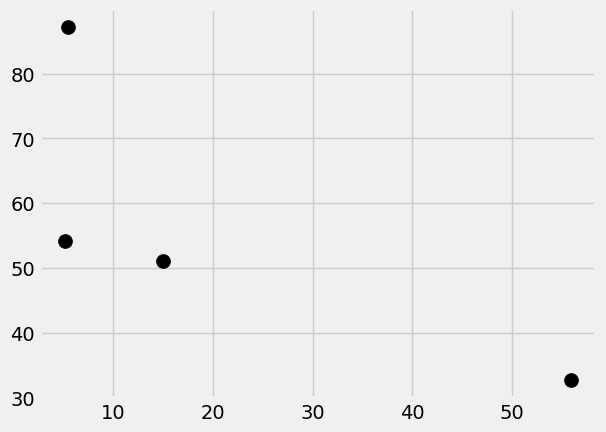

In [258]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=100, alpha= 1)
plt.show()

### 11.3.1. Internal validation: 

#### 11.3.1.1. Silhouette Coefficient

In [259]:
silhouette_coefficients = []

for k in range(2, 11):
    Minikmeans_pca = MiniBatchKMeans(n_clusters=k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans_pca.fit(pca_model)
    score = silhouette_score(pca_model, Minikmeans_pca.labels_)
    silhouette_coefficients.append(score)

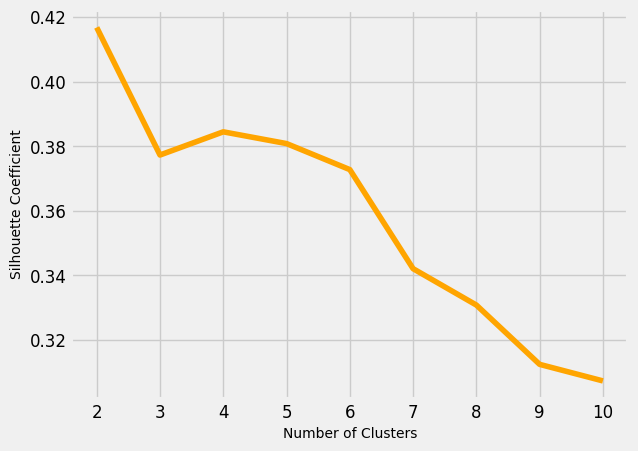

In [260]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), silhouette_coefficients, color= "orange")
plt.xticks(range(2, 11), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

#### Tuning hyperparameters

In [261]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

silhouette_coefficients = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans_pca = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, batch_size=1024, compute_labels=True, max_iter=300, random_state=42)
            Minikmeans_pca.fit(pca_model)
            
            # Calculate the silhouette score
            score = silhouette_score(pca_model, Minikmeans_pca.labels_)
            silhouette_coefficients.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df_pca = pd.DataFrame(silhouette_coefficients, columns=['n_clusters', 'init', 'n_init', 'silhouette_score'])
results_df_pca

,n_clusters,init,n_init,silhouette_score
0,2,k-means++,1,0.416812
1,3,k-means++,1,0.347839
2,4,k-means++,1,0.386788
3,5,k-means++,1,0.388678
4,6,k-means++,1,0.349312
5,7,k-means++,1,0.332318
6,8,k-means++,1,0.349663
7,9,k-means++,1,0.324938
8,10,k-means++,1,0.307501
9,2,k-means++,20,0.415523


In [262]:
max_index = results_df_pca['silhouette_score'].idxmax()
max_row = results_df_pca.loc[max_index]
max_row

n_clusters                  3
init                k-means++
n_init                     20
silhouette_score     0.442497
Name: 10, dtype: object

In [263]:
results_df_pca.style.highlight_max(color = 'red', axis = 0, subset= ['silhouette_score'])

,n_clusters,init,n_init,silhouette_score
0,2,k-means++,1,0.416812
1,3,k-means++,1,0.347839
2,4,k-means++,1,0.386788
3,5,k-means++,1,0.388678
4,6,k-means++,1,0.349312
5,7,k-means++,1,0.332318
6,8,k-means++,1,0.349663
7,9,k-means++,1,0.324938
8,10,k-means++,1,0.307501
9,2,k-means++,20,0.415523


In [264]:
max_value = results_df_pca['silhouette_score'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s_pca = results_df_pca[results_df_pca['silhouette_score'] == max_value]
max_rows_s_pca

,n_clusters,init,n_init,silhouette_score
10,3,k-means++,20,0.442497


#### 11.3.1.2. Calinski harabasz

#### Tuning hyperparameters

In [265]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

calinski_harabasz = []

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans_pca = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, max_iter=300, random_state=42)
            Minikmeans_pca.fit(pca_model)
            
            # Calculate the silhouette score
            score = calinski_harabasz_score(pca_model, Minikmeans_pca.labels_)
            calinski_harabasz.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch_pca = pd.DataFrame(calinski_harabasz, columns=['n_clusters', 'init', 'n_init', 'calinski_harabasz'])
results_ch_pca

,n_clusters,init,n_init,calinski_harabasz
0,2,k-means++,1,145.922919
1,3,k-means++,1,109.280384
2,4,k-means++,1,146.316083
3,5,k-means++,1,154.568897
4,6,k-means++,1,159.513880
5,7,k-means++,1,146.534947
6,8,k-means++,1,155.343005
7,9,k-means++,1,152.134968
8,10,k-means++,1,137.685195
9,2,k-means++,20,146.257729


In [266]:
max_index = results_ch_pca['calinski_harabasz'].idxmax()
max_row = results_ch_pca.loc[max_index]
max_row 

n_clusters                    6
init                     random
n_init                       20
calinski_harabasz    161.557782
Name: 31, dtype: object

In [267]:
results_ch_pca.style.highlight_max(color = 'red', axis = 0, subset= ['calinski_harabasz'])

,n_clusters,init,n_init,calinski_harabasz
0,2,k-means++,1,145.922919
1,3,k-means++,1,109.280384
2,4,k-means++,1,146.316083
3,5,k-means++,1,154.568897
4,6,k-means++,1,159.513880
5,7,k-means++,1,146.534947
6,8,k-means++,1,155.343005
7,9,k-means++,1,152.134968
8,10,k-means++,1,137.685195
9,2,k-means++,20,146.257729


In [268]:
max_value = results_ch_pca['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_ch_pca = results_ch_pca[results_ch_pca['calinski_harabasz'] == max_value]
max_rows_ch_pca

,n_clusters,init,n_init,calinski_harabasz
31,6,random,20,161.557782


#### 11.3.1.3. Davies Bouldin

In [269]:
Davies_Bouldin=[]

for k in range(2, 11):
    Minikmeans_pca = MiniBatchKMeans(n_clusters = k, init='random', n_init=10, max_iter=300, random_state=42)
    Minikmeans_pca.fit(pca_model)
    score = davies_bouldin_score(pca_model, Minikmeans_pca.labels_)
    Davies_Bouldin.append(score)

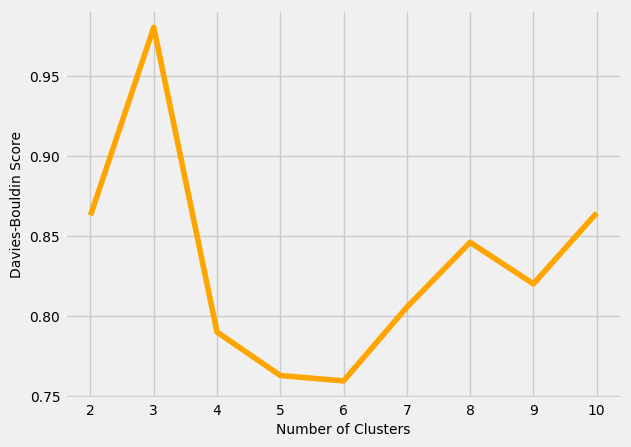

In [270]:
plt.style.use("fivethirtyeight")
plt.plot(range(2, 11), Davies_Bouldin, color="orange")
plt.xticks(range(2, 11), fontsize=10)
plt.yticks(fontsize=10)
plt.xlabel("Number of Clusters", fontsize=10)
plt.ylabel("Davies-Bouldin Score", fontsize=10)
plt.show()

In [271]:
init =  ['k-means++', 'random']
n_init = [1 ,20]
nclusters = range(2,11)

Davies_Bouldin=[]

# Iterate over all combinations of parameters
for i in init:
    for n in n_init:
        for k in nclusters:
            Minikmeans_pca = MiniBatchKMeans(n_clusters=k, init=i, n_init=n, max_iter=300, random_state=42)
            Minikmeans_pca.fit(pca_model)
            
            # Calculate the silhouette score
            score = davies_bouldin_score(pca_model, Minikmeans_pca.labels_)
            Davies_Bouldin.append((k, i, n, score))  # Store the score with parameter values

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db_pca = pd.DataFrame(Davies_Bouldin, columns=['n_clusters', 'init', 'n_init', 'davies_bouldin'])
results_db_pca

,n_clusters,init,n_init,davies_bouldin
0,2,k-means++,1,0.862902
1,3,k-means++,1,1.134461
2,4,k-means++,1,0.777302
3,5,k-means++,1,0.742315
4,6,k-means++,1,0.831458
5,7,k-means++,1,0.819440
6,8,k-means++,1,0.833089
7,9,k-means++,1,0.855279
8,10,k-means++,1,0.835993
9,2,k-means++,20,0.871664


In [272]:
max_index = results_db_pca['davies_bouldin'].idxmax()
max_row = results_db_pca.loc[max_index]
max_row

n_clusters                3
init              k-means++
n_init                    1
davies_bouldin     1.134461
Name: 1, dtype: object

In [273]:
results_db_pca.style.highlight_max(color = 'red', axis = 0, subset= ['davies_bouldin'])

,n_clusters,init,n_init,davies_bouldin
0,2,k-means++,1,0.862902
1,3,k-means++,1,1.134461
2,4,k-means++,1,0.777302
3,5,k-means++,1,0.742315
4,6,k-means++,1,0.831458
5,7,k-means++,1,0.819440
6,8,k-means++,1,0.833089
7,9,k-means++,1,0.855279
8,10,k-means++,1,0.835993
9,2,k-means++,20,0.871664


In [274]:
max_value = results_db_pca['davies_bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_db_pca = results_db_pca[results_db_pca['davies_bouldin'] == max_value]
max_rows_db_pca

,n_clusters,init,n_init,davies_bouldin
1,3,k-means++,1,1.134461


### 11.3.2. Final Results from MiniBatchKMeans

In [275]:
table3 = pd.concat([max_rows_s_pca, max_rows_ch_pca, max_rows_db_pca], ignore_index=True)
table3 = table3.fillna("-")
table3

,n_clusters,init,n_init,silhouette_score,calinski_harabasz,davies_bouldin
0,3,k-means++,20,0.442497,-,-
1,6,random,20,-,161.557782,-
2,3,k-means++,1,-,-,1.134461


### 11.3.3. Substituting the optimal parameters in MiniBatchKMeans for final model prediction

In [276]:
nclusters = [2,4]
init =  ['k-means++', 'random']
n_init = [1,20]

best_silhouette = -1  # Silhouette score ranges from -1 to 1, so -1 is a reasonable starting point
best_davies_bouldin = float('inf')  # Davies-Bouldin score should be minimized, so infinity is a good starting point

best_silhouette_params = None
best_davies_params = None

for n in nclusters:
    for i in init:
        for j in n_init:
                Minikmeans_pca = MiniBatchKMeans(n_clusters=n, init=i, n_init= j, max_iter=300, random_state=42)
                Minikmeans_pca.fit(scaled_features)
                predict_k=Minikmeans_pca.predict(scaled_features)



                # Calculate silhouette score
                silhouette = silhouette_score(scaled_features, Minikmeans_pca.labels_)

                # Calculate Davies-Bouldin score
                davies = davies_bouldin_score(scaled_features, Minikmeans_pca.labels_)

                
                # Check for max silhouette score
                if silhouette > best_silhouette:
                    best_silhouette = silhouette
                    best_silhouette_params = (n, i, j)
                    
                    # Check for min Davies-Bouldin score
                if davies < best_davies_bouldin:
                    best_davies_bouldin = davies
                    best_davies_params = (n, i, j)

print("\nBest Silhouette Score:")
print(f"n_clusters: {best_silhouette_params[0]}, init: {best_silhouette_params[1]}, n_init: {best_silhouette_params[2]}")
print(f"Silhouette Score: {best_silhouette:.4f}\n")

print("Best Davies-Bouldin Score:")
print(f"n_clusters: {best_davies_params[0]}, init: {best_davies_params[1]}, n_init: {best_davies_params[2]}")
print(f"Davies-Bouldin Score: {best_davies_bouldin:.4f}") # formatted to 4 decimal places (.4f).


Best Silhouette Score:
n_clusters: 2, init: k-means++, n_init: 1
Silhouette Score: 0.3043

Best Davies-Bouldin Score:
n_clusters: 4, init: k-means++, n_init: 20
Davies-Bouldin Score: 1.0634


In [277]:
Minikmeans_pca = MiniBatchKMeans(n_clusters=2, init="random", n_init=20, max_iter=300, random_state=42)
Minikmeans_pca.fit(pca_model)
predictMBK_pca = Minikmeans_pca.predict(pca_model)

In [278]:
print("silhouette_score:", silhouette_score(pca_model, Minikmeans_pca.labels_))
print("calinski_harabasz:", calinski_harabasz_score(pca_model, Minikmeans_pca.labels_))
print("davies_bouldin:", davies_bouldin_score(pca_model, Minikmeans_pca.labels_))   

silhouette_score: 0.4140068220400773
calinski_harabasz: 146.19134527596415
davies_bouldin: 0.877757556032724


In [279]:
centroids = Minikmeans_pca.cluster_centers_
print(centroids)

[[ 1.52383612 -0.12280998]
 [-1.68535433  0.20390082]]


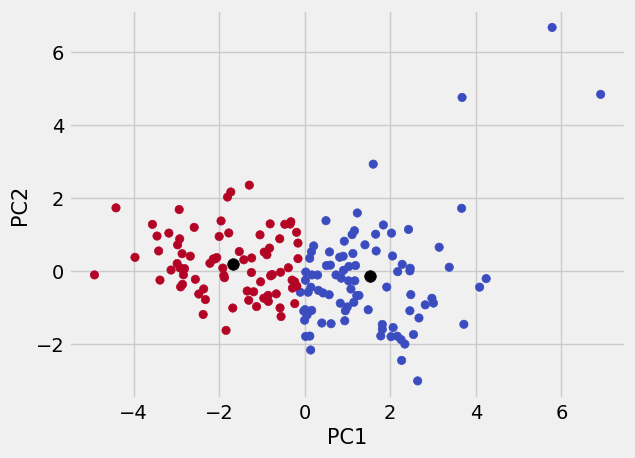

In [280]:
plt.scatter(pca_df['P1'], pca_df['P2'], c = Minikmeans_pca.fit_predict(pca_model), cmap='coolwarm') 
plt.scatter(centroids[:, 0], centroids[:,1], c='black', s=70) 
plt.xlabel("PC1",fontsize=15)
plt.ylabel("PC2",fontsize=15)
plt.show()

In [281]:
df2['MiniBatchKMeans'] = predictMBK_pca
df2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,3,1
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,4,0,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,4,0,1
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,3,1
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,4,4,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,4,0,1
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,3,1


In [282]:
df2["MiniBatchKMeans"].value_counts()

MiniBatchKMeans
0    89
1    78
Name: count, dtype: int64

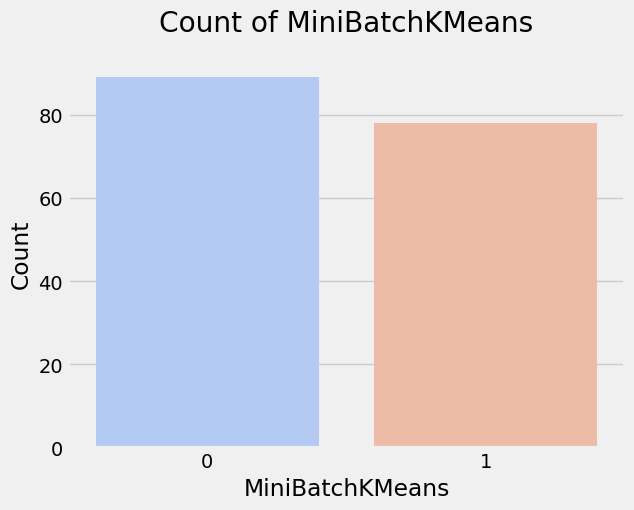

In [283]:
sns.countplot(x=df2["MiniBatchKMeans"], palette= "coolwarm")
plt.xlabel("MiniBatchKMeans")
plt.ylabel("Count")    
plt.title("Count of MiniBatchKMeans", pad=20)
plt.show()

## 11.4.MeanShift

In [284]:
best_bandwidth = None
max_clusters = 0
min_clusters = float('inf')  # Initialize to a large value

for bw in range(1, 10):            
            ms_pca = MeanShift(bandwidth=bw, bin_seeding=True)
            ms_pca.fit(pca_model)
            labels = ms_pca.labels_
            labels_unique = np.unique(labels)
            n_clusters_ = len(labels_unique)
            
            print("Bandwidth:", bw, " -> Estimated number of clusters: %d" % n_clusters_)
            
            # Track the best bandwidth with the highest number of clusters
            if n_clusters_ > max_clusters:
                max_clusters = n_clusters_
                best_bandwidth = bw
                
            # Track the minimum number of clusters
            if n_clusters_ < min_clusters:
                min_clusters = n_clusters_
                Minbandwidth = bw  # Update the bandwidth for minimum clusters
    
print("\nBest bandwidth:", best_bandwidth, "with", max_clusters, "clusters")
print("Minimum bandwidth:", Minbandwidth, "with", min_clusters, "clusters")

Bandwidth: 1  -> Estimated number of clusters: 11
Bandwidth: 2  -> Estimated number of clusters: 3
Bandwidth: 3  -> Estimated number of clusters: 2
Bandwidth: 4  -> Estimated number of clusters: 2
Bandwidth: 5  -> Estimated number of clusters: 1
Bandwidth: 6  -> Estimated number of clusters: 1
Bandwidth: 7  -> Estimated number of clusters: 1
Bandwidth: 8  -> Estimated number of clusters: 1
Bandwidth: 9  -> Estimated number of clusters: 1

Best bandwidth: 1 with 11 clusters
Minimum bandwidth: 5 with 1 clusters


In [285]:
ms_pca = MeanShift(bandwidth=9).fit(num_columns)
centroids = ms_pca.cluster_centers_
print(centroids)

[[2.08e+02 1.53e+01 6.91e+00 ... 3.21e+01 3.33e+00 6.62e+02]
 [1.60e+02 1.68e+01 1.31e+01 ... 5.50e+01 5.20e+00 3.99e+02]
 [1.50e+02 3.68e+01 4.53e+00 ... 5.65e+01 6.59e+00 8.97e+02]
 ...
 [2.80e+00 2.00e+02 3.96e+00 ... 8.27e+01 1.15e+00 4.66e+04]
 [2.80e+00 1.75e+02 7.77e+00 ... 8.13e+01 1.63e+00 1.05e+05]
 [2.60e+00 5.34e+01 9.40e+00 ... 8.20e+01 2.20e+00 4.19e+04]]


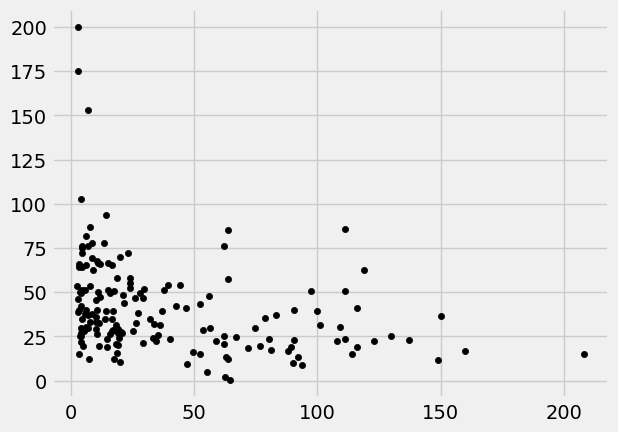

In [286]:
plt.scatter(centroids[:, 0], centroids[:, 1], c='black', s=20, alpha= 1)
plt.show()

### 11.4.1. Internali Validation

#### 11.4.1.1. Silhouette coefficient

In [287]:

silhouette_coefficients = []

for bw in range(1, 7):            
            ms_pca = MeanShift(bandwidth=bw, bin_seeding=True)
            ms_pca.fit(pca_model)
    
            # Check the number of unique labels
            if len(set(ms_pca.labels_)) > 1:  # Proceed only if more than one cluster
                score = silhouette_score(pca_model, ms_pca.labels_)
                silhouette_coefficients.append((bw, score))  # Store the score with parameter values
            else:
                silhouette_coefficients.append((bw, None))  # Append None if only one cluster

# Convert to a structured format for easier analysis (e.g., DataFrame)
results_df_pca = pd.DataFrame(silhouette_coefficients, columns=['n_bandwidth', 'silhouette coefficients'])
results_df_pca

,n_bandwidth,silhouette coefficients
0,1,0.267511
1,2,0.443138
2,3,0.616572
3,4,0.616572
4,5,NaN
5,6,NaN


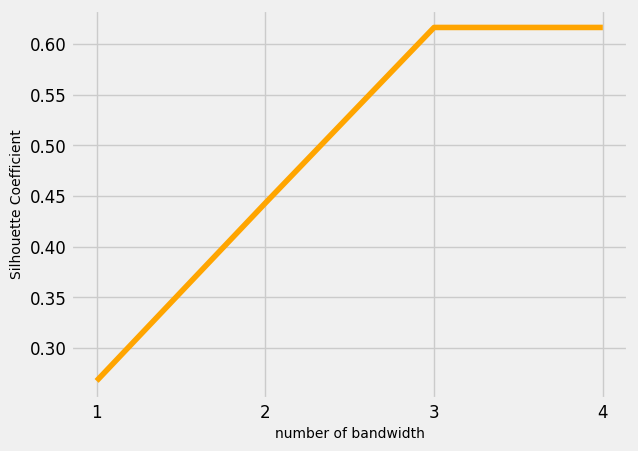

In [288]:
plt.plot(range(1, 5), results_df_pca["silhouette coefficients"][:4], color= "orange")
plt.xticks(range(1, 5), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Silhouette Coefficient" , fontsize=10)
plt.show()

In [289]:
max_index = results_df_pca['silhouette coefficients'].idxmax()
max_row = results_df_pca.loc[max_index]
max_row

n_bandwidth                3.000000
silhouette coefficients    0.616572
Name: 2, dtype: float64

In [290]:
results_df_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette coefficients'])

,n_bandwidth,silhouette coefficients
0,1,0.267511
1,2,0.443138
2,3,0.616572
3,4,0.616572
4,5,nan
5,6,nan


In [291]:
max_value = results_df_pca['silhouette coefficients'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s_pca = results_df_pca[results_df_pca['silhouette coefficients'] == max_value]
max_rows_s_pca

,n_bandwidth,silhouette coefficients
2,3,0.616572
3,4,0.616572


#### 11.4.1.2. Calinski harabasz

In [292]:

calinski_harabasz=[]

for bw in range(1, 6):            
            ms_pca = MeanShift(bandwidth=bw, bin_seeding=True)
            ms_pca.fit(pca_model)

            if len(set(ms_pca.labels_)) > 1:  # Proceed only if more than one cluster
                score = calinski_harabasz_score(pca_model, ms_pca.labels_)
                calinski_harabasz.append((bw, score))  # Store the score with parameter values
            else:
                calinski_harabasz.append((bw, None))  # Append None if only one cluster
            # Calculate the silhouette score
            
# Convert to a structured format for easier analysis (e.g., DataFrame)
results_ch_pca = pd.DataFrame(calinski_harabasz, columns=['n_bandwidth', 'calinski_harabasz'])
results_ch_pca

,n_bandwidth,calinski_harabasz
0,1,78.855120
1,2,23.181560
2,3,40.281056
3,4,40.281056
4,5,NaN


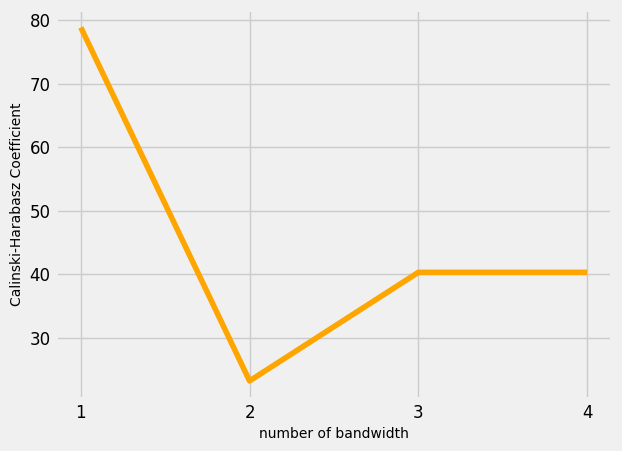

In [293]:

plt.plot(range(1, 5), results_ch_pca["calinski_harabasz"][:4], color= "orange")
plt.xticks(range(1, 5), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Calinski-Harabasz Coefficient" , fontsize=10)
plt.show()

In [294]:
max_index = results_ch_pca['calinski_harabasz'].idxmax()
max_row_pca = results_ch_pca.loc[max_index]
max_row_pca

n_bandwidth           1.00000
calinski_harabasz    78.85512
Name: 0, dtype: float64

In [295]:
results_ch_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['calinski_harabasz'])

,n_bandwidth,calinski_harabasz
0,1,78.855120
1,2,23.181560
2,3,40.281056
3,4,40.281056
4,5,nan


In [296]:
max_value = results_ch_pca['calinski_harabasz'].max()
# Create a mask to extract all rows with the maximum value
max_rows_c_pca = results_ch_pca[results_ch_pca['calinski_harabasz'] == max_value]
max_rows_c_pca

,n_bandwidth,calinski_harabasz
0,1,78.85512


#### 11.4.1.3. Davies Bouldin

In [297]:

davies_bouldin=[]

for bw in range(1, 6):            
            ms_pca = MeanShift(bandwidth=bw, bin_seeding=True)
            ms_pca.fit(pca_model)

    
            if len(set(ms_pca.labels_)) > 1:  # Proceed only if more than one cluster
                score = davies_bouldin_score(pca_model, ms_pca.labels_)
                davies_bouldin.append((bw, score))  # Store the score with parameter values
            else:
                davies_bouldin.append((bw, None))  # Append None if only one cluster
           
# Convert to a structured format for easier analysis (e.g., DataFrame)
results_db_pca = pd.DataFrame(davies_bouldin, columns=['n_bandwidth', 'Davies_Bouldin'])
results_db_pca

,n_bandwidth,Davies_Bouldin
0,1,0.760166
1,2,0.713819
2,3,0.584848
3,4,0.584848
4,5,NaN


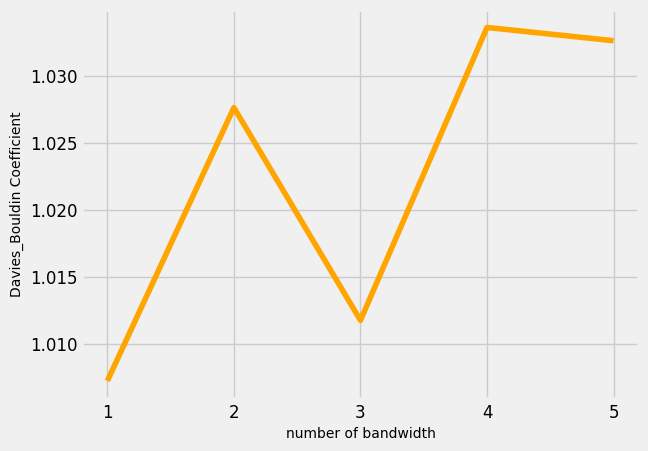

In [298]:

plt.plot(range(1, 6), results_db["Davies_Bouldin"][:5], color= "orange")
plt.xticks(range(1, 6), fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel("number of bandwidth", fontsize=10)
plt.ylabel("Davies_Bouldin Coefficient" , fontsize=10)
plt.show()

In [299]:
max_index = results_db_pca['Davies_Bouldin'].idxmax()
max_row = results_db_pca.loc[max_index]
max_row

n_bandwidth       1.000000
Davies_Bouldin    0.760166
Name: 0, dtype: float64

In [300]:
results_db_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['Davies_Bouldin'])

,n_bandwidth,Davies_Bouldin
0,1,0.760166
1,2,0.713819
2,3,0.584848
3,4,0.584848
4,5,nan


In [301]:
max_value = results_db_pca['Davies_Bouldin'].max()
# Create a mask to extract all rows with the maximum value
max_rows_d_pca = results_db_pca[results_db_pca['Davies_Bouldin'] == max_value]
max_rows_d_pca

,n_bandwidth,Davies_Bouldin
0,1,0.760166


### 11.4.2. Final Results from MeanShift

In [302]:
table2 = pd.concat([max_rows_s_pca, max_rows_c_pca, max_rows_d_pca], ignore_index=True)
table2 = table2.fillna("-")
table2

,n_bandwidth,silhouette coefficients,calinski_harabasz,Davies_Bouldin
0,3,0.616572,-,-
1,4,0.616572,-,-
2,1,-,78.85512,-
3,1,-,-,0.760166


### 11.4.3. Substituting the optimal parameter in MeanShift for final model prediction

In [303]:
ms_pca = MeanShift(bandwidth=3, bin_seeding=True, max_iter=300)
ms_pca.fit(pca_model)
predict_ms_pca=ms_pca.predict(pca_model)

In [304]:
print("silhouette_score:", silhouette_score(pca_model,ms_pca.labels_))
print("calinski_harabasz:", calinski_harabasz_score(pca_model,ms_pca.labels_))
print("davies_bouldin:", davies_bouldin_score(pca_model,ms_pca.labels_))   

silhouette_score: 0.6165724335276265
calinski_harabasz: 40.28105591644315
davies_bouldin: 0.5848480422992932


In [305]:
centroids = ms_pca.cluster_centers_
print(centroids)

[[-0.21981215 -0.08801432]
 [ 5.46022462  5.43247334]]


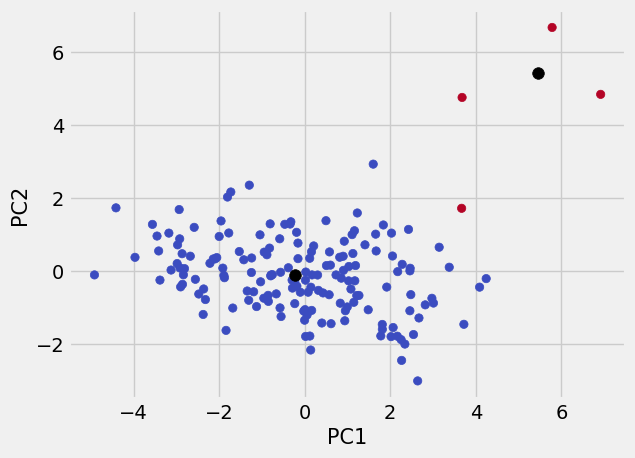

In [306]:
plt.scatter(pca_df['P1'], pca_df['P2'], c = ms_pca.fit_predict(pca_model), cmap='coolwarm') 
plt.scatter(centroids[:, 0], centroids[:,1], c='black', s=70) 
plt.xlabel("PC1",fontsize=15)
plt.ylabel("PC2",fontsize=15)
plt.show()

In [307]:
df2['MeanShift Prediction'] = predict_ms_pca
df2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans,MeanShift Prediction
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,3,1,0
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,4,0,0,0
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,4,0,1,0
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,3,1,0
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,4,4,1,0
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,4,0,1,0
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,0,0
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,3,1,0


In [308]:
df2["MeanShift Prediction"].value_counts()

MeanShift Prediction
0    163
1      4
Name: count, dtype: int64

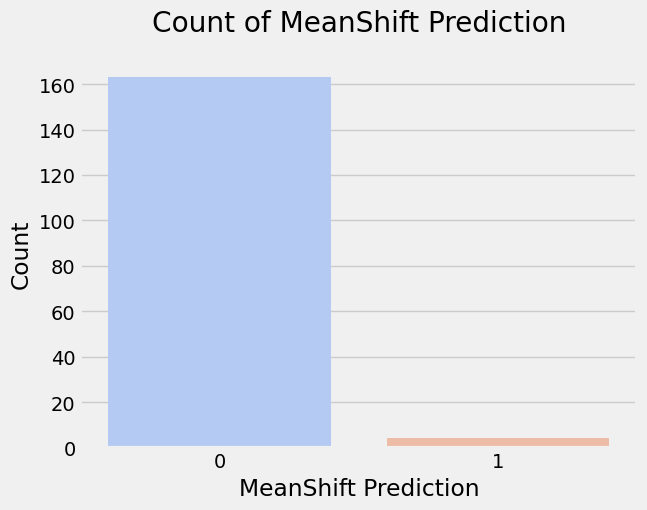

In [309]:
sns.countplot(x=df2["MeanShift Prediction"], palette= "coolwarm")
plt.xlabel("MeanShift Prediction")
plt.ylabel("Count")
plt.title("Count of MeanShift Prediction", pad=20)
plt.show()

## 11.5. AffinityPropagation

In [310]:
Affinity_pca = AffinityPropagation(random_state=5)
Affinity_pca.fit(pca_model)
labels = Affinity_pca.labels_
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13])

### 11.5.1. Internal validation: 

#### 11.5.1.1. Silhouette coefficient

In [311]:
silhouette_coefficients = []

for damping in np.arange(0.5, 0.99, 0.04):
    
    af_pca = AffinityPropagation(damping=damping, random_state=42)
    af_pca.fit(pca_model)
    labels = af_pca.labels_

    if len(np.unique(labels)) > 1:  
        # Calculate silhouette coefficient
        score = silhouette_score(pca_model, labels)
        silhouette_coefficients.append((damping, score))  # Store damping and score
    else:
        silhouette_coefficients.append((damping, None))  # Append None if only one cluster

In [312]:
# Convert the results into a DataFrame for analysis
results_silhouette_pca = pd.DataFrame(silhouette_coefficients, columns=['damping', 'silhouette_coefficient'])
results_silhouette_pca    

,damping,silhouette_coefficient
0,0.50,0.328817
1,0.54,0.359107
2,0.58,0.359077
3,0.62,0.343575
4,0.66,0.359421
5,0.70,0.352722
6,0.74,0.359421
7,0.78,0.359421
8,0.82,0.364781
9,0.86,NaN


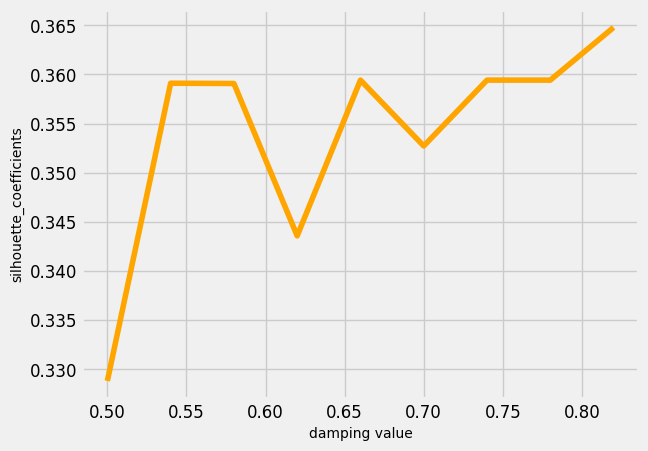

In [313]:
plt.style.use('fivethirtyeight')
plt.plot(results_silhouette_pca["damping"], results_silhouette_pca["silhouette_coefficient"], color="orange")  # Align x-values with damping range
plt.xticks(fontsize=12)  # Match x-ticks with damping values
plt.yticks(fontsize=12)   
plt.xlabel('damping value', fontsize=10)
plt.ylabel('silhouette_coefficients', fontsize=10)
plt.show()

In [314]:
max_index = results_silhouette_pca['silhouette_coefficient'].idxmax()
max_row = results_silhouette_pca.loc[max_index]
max_row

damping                   0.820000
silhouette_coefficient    0.364781
Name: 8, dtype: float64

In [315]:
results_silhouette_pca.style.highlight_max(color = 'orange', axis = 0, subset= ['silhouette_coefficient'])

,damping,silhouette_coefficient
0,0.500000,0.328817
1,0.540000,0.359107
2,0.580000,0.359077
3,0.620000,0.343575
4,0.660000,0.359421
5,0.700000,0.352722
6,0.740000,0.359421
7,0.780000,0.359421
8,0.820000,0.364781
9,0.860000,nan


In [316]:
max_value = results_silhouette_pca['silhouette_coefficient'].max()
# Create a mask to extract all rows with the maximum value
max_rows_s_pca = results_silhouette_pca[results_silhouette_pca['silhouette_coefficient'] == max_value]
max_rows_s_pca

,damping,silhouette_coefficient
8,0.82,0.364781


#### 11.5.1.2. Calinski harabasz

In [317]:
calinski_harabasz=[]

for damping in np.arange(0.5, 0.99, 0.04):
    ch_pca = AffinityPropagation(damping=damping, random_state=42)
    ch_pca.fit(pca_model)
    
    if len(np.unique(labels)) > 1:  
        score = calinski_harabasz_score(pca_model, ch_pca_labels)
        calinski_harabasz.append((damping, score))  # Store damping and score
    else:
        calinski_harabasz.append((damping, None))  # Append None if only one cluster
    #score = calinski_harabasz_score(pca_model, ch_pca.labels_)
   # calinski_harabasz.append((damping, score))  # Store the score with parameter values 

#### Observation:
Since the number of cluster is 1, calinski_harabasz does not give any score for different damping values

#### 11.5.1.3. Davies Bouldin

In [318]:
Davies_Bouldin=[]
 
for damping in np.arange(0.5, 0.99, 0.05):
    db_pca = AffinityPropagation(damping=damping, random_state=42)
    db_pca.fit(pca_model) 

    if len(np.unique(labels)) > 1:  
        score = davies_bouldin_score(pca_model, db_pca_labels)
        davies_bouldin.append((damping, score))  # Store damping and score
    else:
        davies_bouldin.append((damping, None))  # Append None if only one cluster
    #score = davies_bouldin_score(pca_model, db_pca.labels_)
    #Davies_Bouldin.append((damping, score))  # Store the score with parameter values 

In [319]:
print(f"Damping: {damping}, Clusters: {len(np.unique(db_pca.labels_))}")

Damping: 0.9500000000000004, Clusters: 1


In [320]:
results_db_pca = pd.DataFrame(Davies_Bouldin, columns=['damping', 'Davies_Bouldin'])
results_db_pca

,damping,Davies_Bouldin


#### Observation:
Since the number of cluster is 1, Davies_Bouldin does not give any score for different damping values

### 11.5.2. Final Results from AffinityPropagation

In [321]:
table4 = max_rows_s_pca
table4

,damping,silhouette_coefficient
8,0.82,0.364781


### 11.5.3. Substituting the optimal parameters in AffinityPropagation for final model prediction

In [322]:
af_pca = AffinityPropagation(damping=0.82, random_state=42)
af_pca.fit(pca_model)
labels = af_pca.labels_

In [323]:
np.unique(labels)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [324]:
print("silhouette_score:", silhouette_score(pca_model,af_pca.labels_))
#print("calinski_harabasz:", calinski_harabasz_score(pca_model,af.labels_))
#print("davies_bouldin:", davies_bouldin_score(pca_model,af.labels_))   

silhouette_score: 0.3647806113977989


In [325]:
centroids = af_pca.cluster_centers_
print(centroids)

[[ 1.08137420e+00 -4.81969530e-01]
 [-5.82411867e-01  8.94820332e-01]
 [ 1.65908340e+00  1.02156447e+00]
 [ 2.25427080e+00 -1.86663813e+00]
 [ 2.48092396e+00 -6.34701926e-01]
 [-1.06461193e-03 -1.33434959e+00]
 [-1.95392747e+00  1.38338452e+00]
 [ 3.37915727e+00  1.15702442e-01]
 [-3.45016774e+00  9.69922452e-01]
 [ 5.78337630e+00  6.68209028e+00]
 [-1.19183736e+00 -5.56757164e-01]
 [ 1.71674731e-01 -9.48076409e-02]
 [-2.55404919e+00 -2.15027956e-01]]


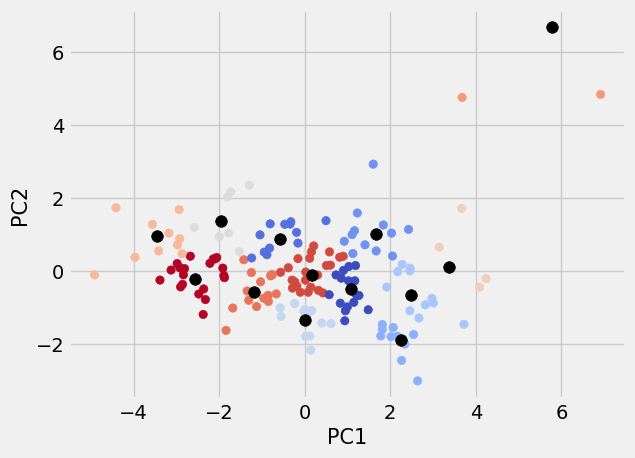

In [326]:
plt.scatter(pca_df['P1'], pca_df['P2'], c = af_pca.fit_predict(pca_model), cmap='coolwarm') 
plt.scatter(centroids[:, 0], centroids[:,1], c='black', s=70) 
plt.xlabel("PC1",fontsize=15)
plt.ylabel("PC2",fontsize=15)
plt.show()

In [327]:
predict_af_pca=af_pca.fit_predict(pca_model)

In [328]:
df2['AffinityPropagation'] = predict_af_pca
df2

,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp,K_mean Prediction,AgglomerativeClustering,MiniBatchKMeans,MeanShift Prediction,AffinityPropagation
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553,1,3,1,0,12
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090,4,0,0,0,11
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460,4,0,1,0,11
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530,1,3,1,0,8
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
162,Vanuatu,29.2,46.6,5.25,52.7,2950,2.62,63.0,3.50,2970,4,4,1,0,1
163,Venezuela,17.1,28.5,4.91,17.6,16500,45.90,75.4,2.47,13500,4,0,1,0,5
164,Vietnam,23.3,72.0,6.84,80.2,4490,12.10,73.1,1.95,1310,0,0,0,0,1
165,Yemen,56.3,30.0,5.18,34.4,4480,23.60,67.5,4.67,1310,1,3,1,0,12


In [329]:
df2["AffinityPropagation"].value_counts()

AffinityPropagation
11    24
12    21
0     17
10    16
5     13
2     13
1     13
4     12
8     11
3     11
6      8
7      5
9      3
Name: count, dtype: int64

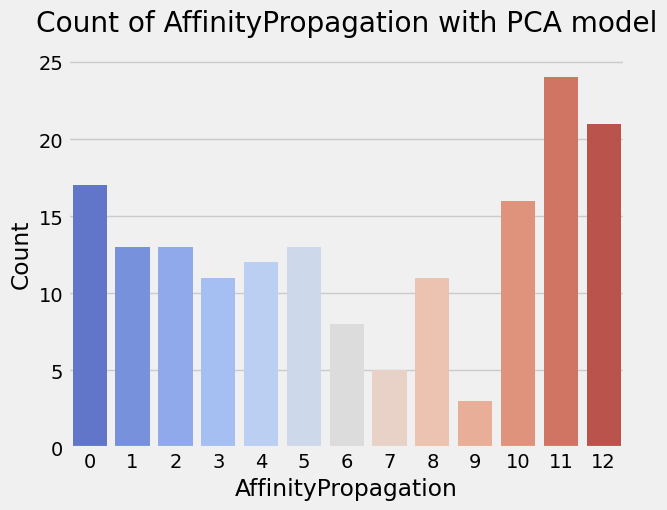

In [330]:
sns.countplot(x=df2["AffinityPropagation"], palette= "coolwarm")
plt.xlabel("AffinityPropagation")
plt.ylabel("Count")
plt.title("Count of AffinityPropagation with PCA model", pad=20)
plt.show()

# 12. Models Comparison

In [331]:
df_pca_comparison = pd.DataFrame({'models':['kmeans','MiniBatchKMeans','MeanShift','Affinity Propagation']
                     ,'silhouette_coefficients':[0.44249722382762424, 0.3618036779015017, 0.6165724335276267, 0.3647806113977988]
                     ,'calinski_harabasz_score':[137.47571089489333, 126.34230618881759, 40.28105591644323, "-"]
                      , "davies_bouldin" : [0.6824204335613837, 0.9926268015151617, 0.584848042299293, "-" ]
                     ,'n_clusters':[3,3,2,13]})          
df_pca_comparison

,models,silhouette_coefficients,calinski_harabasz_score,davies_bouldin,n_clusters
0,kmeans,0.442497,137.475711,0.68242,3
1,MiniBatchKMeans,0.361804,126.342306,0.992627,3
2,MeanShift,0.616572,40.281056,0.584848,2
3,Affinity Propagation,0.364781,-,-,13
